In [1]:
!kaggle datasets download najzeko/steam-reviews-2021

Dataset URL: https://www.kaggle.com/datasets/najzeko/steam-reviews-2021
License(s): GPL-2.0
100% 2.97G/2.97G [02:34<00:00, 22.2MB/s]
100% 2.97G/2.97G [02:34<00:00, 20.6MB/s]


In [2]:
!unzip steam-reviews-2021.zip

Archive:  steam-reviews-2021.zip
  inflating: steam_reviews.csv       


In [3]:
!kaggle datasets download giangpt/chinesefont

Dataset URL: https://www.kaggle.com/datasets/giangpt/chinesefont
License(s): unknown
 79% 6.00M/7.63M [00:01<00:00, 7.11MB/s]
100% 7.63M/7.63M [00:01<00:00, 5.58MB/s]


In [4]:
!unzip chinesefont.zip

Archive:  chinesefont.zip
  inflating: simsun.ttc              


# Research questions (RQs)

In [5]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import matplotlib.font_manager as font_manager
from matplotlib.ticker import FuncFormatter, ScalarFormatter
import matplotlib.ticker as mtick
import datetime as dt
import calendar
from statsmodels.stats.proportion import proportions_ztest
import scipy.stats as stats
from scipy.stats import spearmanr, pearsonr
import warnings
warnings.filterwarnings('ignore')

In [6]:
df = pd.read_csv('steam_reviews.csv', header='infer', index_col=0)

In [3]:
df2 = pd.read_csv('steam_reviews.csv', header='infer', index_col=0) # keep a copy of the dataset for later

In [7]:
df.head()

,app_id,app_name,review_id,language,review,timestamp_created,timestamp_updated,recommended,votes_helpful,votes_funny,...,steam_purchase,received_for_free,written_during_early_access,author.steamid,author.num_games_owned,author.num_reviews,author.playtime_forever,author.playtime_last_two_weeks,author.playtime_at_review,author.last_played
0,292030,The Witcher 3: Wild Hunt,85185598,schinese,不玩此生遗憾，RPG游戏里的天花板，太吸引人了,1611381629,1611381629,True,0,0,...,True,False,False,76561199095369542,6,2,1909.0,1448.0,1909.0,1.611343e+09
1,292030,The Witcher 3: Wild Hunt,85185250,schinese,拔DIAO无情打桩机--杰洛特!!!,1611381030,1611381030,True,0,0,...,True,False,False,76561198949504115,30,10,2764.0,2743.0,2674.0,1.611386e+09
2,292030,The Witcher 3: Wild Hunt,85185111,schinese,巫师3NB,1611380800,1611380800,True,0,0,...,True,False,False,76561199090098988,5,1,1061.0,1061.0,1060.0,1.611384e+09
3,292030,The Witcher 3: Wild Hunt,85184605,english,"One of the best RPG's of all time, worthy of a...",1611379970,1611379970,True,0,0,...,True,False,False,76561199054755373,5,3,5587.0,3200.0,5524.0,1.611384e+09
4,292030,The Witcher 3: Wild Hunt,85184287,schinese,大作,1611379427,1611379427,True,0,0,...,True,False,False,76561199028326951,7,4,217.0,42.0,217.0,1.610788e+09


In [8]:
df.shape # print the shape of the dataset

(21747371, 22)

In [9]:
df.info() # get other general information about the dataset and the data types it stores

<class 'pandas.core.frame.DataFrame'>
Index: 21747371 entries, 0 to 21747375
Data columns (total 22 columns):
 #   Column                          Dtype  
---  ------                          -----  
 0   app_id                          int64  
 1   app_name                        object 
 2   review_id                       int64  
 3   language                        object 
 4   review                          object 
 5   timestamp_created               int64  
 6   timestamp_updated               int64  
 7   recommended                     bool   
 8   votes_helpful                   int64  
 9   votes_funny                     int64  
 10  weighted_vote_score             float64
 11  comment_count                   int64  
 12  steam_purchase                  bool   
 13  received_for_free               bool   
 14  written_during_early_access     bool   
 15  author.steamid                  int64  
 16  author.num_games_owned          int64  
 17  author.num_reviews            

In [10]:
# Data cleaning

# Convert timestamps in the 'timestamp_created', 'timestamp_updated', and 'author.last_played' columns from seconds to pandas datetime objects.
# This transformation allows for easier manipulation and analysis of date and time information in the dataset.
df['datetime_created'] = pd.to_datetime(df['timestamp_created'], unit='s')
df['datetime_updated'] = pd.to_datetime(df['timestamp_updated'], unit='s')
df['author.last_played_datetime'] = pd.to_datetime(df['author.last_played'], unit='s')

# Clean data due to inconsistencies
# Group the DataFrame by 'author.steamid' to get the maximum number of games owned per author
number_games = df.groupby('author.steamid').agg(num_games_owned=('author.num_games_owned','max'))
# Perform a join to add 'num_games_owned' from number_games to the main DataFrame df
df = df.merge(number_games, on='author.steamid', how='left')
# Replace the 'author.num_games_owned' column with values from the 'num_games_owned' column
df['author.num_games_owned'] = df['num_games_owned']
# Drop the temporary column 'num_games_owned' if it is no longer needed
df = df.drop(columns=['num_games_owned'])

# Calculate the number of reviews per author
number_reviews = (df[['author.steamid','review_id']].drop_duplicates(subset=['author.steamid','review_id'])).groupby('author.steamid').agg(num_reviews = ('review_id','count'))
# Perform a join to add 'num_reviews' from number_reviews to the main DataFrame df
df = df.merge(number_reviews, on='author.steamid', how='left')
# Replace the 'author.num_reviews' column with values from the 'num_reviews' column
df['author.num_reviews'] = df['num_reviews']
# Drop the temporary column 'num_reviews' if it is no longer needed
df = df.drop(columns=['num_reviews'])

# Eliminate duplicates
column_to_exclude = 'review_id' # Define the column to exclude from duplicates check
columns_to_include = [col for col in df.columns if col != column_to_exclude] # List of columns to include in the duplicates check
df.drop_duplicates(subset=columns_to_include, inplace=True) # Drop duplicates

# Display the first few rows of the DataFrame to verify the results
df.head()

,app_id,app_name,review_id,language,review,timestamp_created,timestamp_updated,recommended,votes_helpful,votes_funny,...,author.steamid,author.num_games_owned,author.num_reviews,author.playtime_forever,author.playtime_last_two_weeks,author.playtime_at_review,author.last_played,datetime_created,datetime_updated,author.last_played_datetime
0,292030,The Witcher 3: Wild Hunt,85185598,schinese,不玩此生遗憾，RPG游戏里的天花板，太吸引人了,1611381629,1611381629,True,0,0,...,76561199095369542,6,2,1909.0,1448.0,1909.0,1.611343e+09,2021-01-23 06:00:29,2021-01-23 06:00:29,2021-01-22 19:23:03
1,292030,The Witcher 3: Wild Hunt,85185250,schinese,拔DIAO无情打桩机--杰洛特!!!,1611381030,1611381030,True,0,0,...,76561198949504115,30,5,2764.0,2743.0,2674.0,1.611386e+09,2021-01-23 05:50:30,2021-01-23 05:50:30,2021-01-23 07:18:27
2,292030,The Witcher 3: Wild Hunt,85185111,schinese,巫师3NB,1611380800,1611380800,True,0,0,...,76561199090098988,5,1,1061.0,1061.0,1060.0,1.611384e+09,2021-01-23 05:46:40,2021-01-23 05:46:40,2021-01-23 06:36:17
3,292030,The Witcher 3: Wild Hunt,85184605,english,"One of the best RPG's of all time, worthy of a...",1611379970,1611379970,True,0,0,...,76561199054755373,5,1,5587.0,3200.0,5524.0,1.611384e+09,2021-01-23 05:32:50,2021-01-23 05:32:50,2021-01-23 06:35:44
4,292030,The Witcher 3: Wild Hunt,85184287,schinese,大作,1611379427,1611379427,True,0,0,...,76561199028326951,7,3,217.0,42.0,217.0,1.610788e+09,2021-01-23 05:23:47,2021-01-23 05:23:47,2021-01-16 09:10:49


# Research Question 1

<h2 style="display: inline;">[RQ 1]</h2><span style="font-size: 18px; font-style: italic;">Before diving deep into the dataset provided, it's crucial to understand its structure and main features. Data scientists usually take the first step of performing an Exploratory Data Analysis (EDA). What can you say about our dataset? Please perform an EDA and summarize the dataset's key characteristics using visualizations and tabular summaries.</span>

In [13]:
### Functions for RQ1 and RQ7

# Function that checks if a column contains any negative values
def check_negative_values(column):
  return (column<0).any()

# Function that takes in input the DataFrame associated with a game and returns in output
# the number of recommendations for each months
def get_monthly_recommendations(game):
    return game['datetime_created'].dt.to_period('M').value_counts().sort_index() # counts reviews per month and sorts them by index (month)

# Function that divides the 'author.num_games_owned' into bins of different volume labels
def segment_games_owned(num_games):
    if num_games <= 50:
        return 'Low Ownership'
    elif num_games <= 200:
        return 'Medium Ownership'
    elif num_games <= 1000:
        return 'High Ownership'
    else:
        return 'Very High Ownership'

# Functions that print summary tables for numeric, binary and categorical features

def numeric_summary(data):
    '''
    Function that returns summary statistics table for a features with numeric data
    Input: pandas dataframe or series, with int/ float data types
    Output: table containing information about the count, missing values, mean, median, std deviation,
    min, max, 25th Percentile (Q1), 75th Percentile (Q2), Interquartile Range (IQR, Q3-Q1), Skewness and Kurtosis
    '''

    summary_list = [] # initialize empty list to store summary statistics for each feature

    # compute summary statistics for each column
    for feature in data.columns:

        count = data[feature].count()
        missing = len(data[feature])-count
        Q1 = data[feature].quantile(0.25)
        Q3 = data[feature].quantile(0.75)

        feature_data = {
            "Feature": feature,
            "Count": count,
            "Missing": missing,
            "Mean": data[feature].mean(),
            "Median": data[feature].median(),
            "Std": data[feature].std(),
            "Min": data[feature].min(),
            "Max": data[feature].max(),
            "25% (Q1)": Q1,
            "75% (Q3)": Q3,
            "IQR": Q3-Q1,
            "Skewness": data[feature].skew(),
            "Kurtosis": data[feature].kurt()
        }

        summary_list.append(feature_data)

    # return the summary table
    summary_table = pd.DataFrame(summary_list)
    return summary_table

# --------------------------------------------------------------

def binary_summary(data):
    '''
    Function that returns summary statistics table for features with binary data
    Input: pandas dataframe or series containing binary data
    Output: table containing information about the total count of non missing values, missing values, True Count,
    False count, True Proportion (over existing values), False Proportion (over existing values)
    '''
    summary_list = [] # initialize empty list to store summary statistics for each feature

    # compute summary statistics for each column
    for feature in data.columns:

        count = data[feature].count()
        missing = len(data[feature])-count
        true_count = data[feature].sum()
        false_count = count-true_count

        feature_data = {
            "Feature": feature,
            "Count": count,
            "Missing": missing,
            "True Count": true_count,
            "False Count": false_count,
            "True Proportion": true_count/count,
            "False Proportion": false_count/count
        }

        summary_list.append(feature_data)

    # return the summary table
    summary_table = pd.DataFrame(summary_list)
    return summary_table

# --------------------------------------------------------------

def categorical_summary(data):
    '''
    Function that returns summary statistics table for features with categorical data
    Input: pandas dataframe or series contanining categorical data
    Output: table containing information about the total count of existing values, missing values,
    Unique count, most common category, most common count, least common category, least common count
    '''
    summary_list = [] # initialize empty list to store summary statistics for each feature

    # compute summary statistics for each column
    for feature in data.columns:

        count = data[feature].count()
        missing = len(data[feature])-count
        unique = data[feature].nunique()
        value_counts = data[feature].value_counts()

        feature_data = {
            "Feature": feature,
            "Count": count,
            "Missing": missing,
            "Unique": unique,
            "Most Common Value": value_counts.idxmax(),
            "Most Common Count": value_counts.max(),
            "Least Common Value": value_counts.idxmin(),
            "Least Common Count": value_counts.min()
        }

        summary_list.append(feature_data)

    # return summary table
    summary_table = pd.DataFrame(summary_list)
    return summary_table

### Global Description

From the outputs above, we see that this dataset contains 21747371 records of video game reviews and 22 features. It contains data on both reviews and users. Based on this glimpse of the dataset, it is possible to deduce the potential meanings of the attributes:

1. ```app_id```: unique identifier for the reviewed game/ app
2. ```app_name```: the name of the reviewed game/ app
3. ```review_id```: number that identifies the review
4. ```language```: the language in which the review was written
5. ```review```: the explicit content of the review
6. ```timestamp_created```: Unix format timestamp (in seconds) of review creation
7. ```timestamp_updated```: Unix format timestamp (in seconds) of the review's last update
8. ```recommended```: specifies whether the user who reviewed the game recommended it
9. ```votes_helpful```: number of users who find the review helpful
10. ```votes_funny```: number of users who find the review funny
11. ```weighted_vote_score```: likely the score reflecting the impact of the review based on the votes
12. ```comment_count```: number of comments left under the review
13. ```steam_purchase```: specifies whether the user purchased the reviewed game on Steam
14. ```received_for_free```: indicates whether the reviewer received the game/ app for free
15. ```written_during_early_access```: indicates whether the review was written during the early access stage of the game
16. ```author.steamid```: the reviewer's Steam ID
17. ```author.num_games_owned```: the number of games owned by the author of the review
18. ```author.num_reviews```: number of reviews the author has written
19. ```author.playtime_forever```: the total amount of time the author has spent playing the game
20. ```author.playtime_last_two_weeks```: the amount of time the author has spent playing the game in the past two weeks, likely in hours
21. ```author.playtime_at_review```: the reviewer's playtime, probably in hours, at the time they wrote the review
22. ```author.last_played```: likely the timestamp in Unix format (in seconds) of when the user last played the game

We see that the dataset contains 15 numeric features - three of which represent timestamps (```timestamp_created```, ```timestamp_updated``` and ```author.last_played```), and another three that can be considered categorical (```app_id```, ```review_id```, ```author.steam_id```) - four binary attributes, and three object-type features - two of which are categorical (```app_name``` and ```language```) and one contains document data (```review```).

The data cleaning steps above have added three timestamp columns, removed duplicate rows, and repopulated the ```author.num_games_owned``` and ```author.num_reviews``` columns, such that for each unique ```author.steamid```, these features are the same. For ```author.num_games_owned```, we decided to choos the maximum number of games owned grouped by ```author.steamid```, because it is most representative of the historical gaming activity of each user. For ```author.num_reviews```, we counted the number of rows each user appeared in to indicate the total number of reviews.

Below are some ulterior checks to verify data integrity:

In [12]:
# Check Data Integrity

# Check if any of the following numeric columns has negative values
print("Negative values in votes_helpful?", check_negative_values(df['votes_helpful']))
print("Negative values in votes_funny?", check_negative_values(df['votes_funny']))
print("Negative values in comment_count?", check_negative_values(df['comment_count']))
print("Negative values in author.num_games_owned?", check_negative_values(df['author.num_games_owned']))
print("Negative values in author.num_reviews?", check_negative_values(df['author.num_reviews']))
print("Negative values in author.playtime_forever?", check_negative_values(df['author.playtime_forever']))
print("Negative values in author.playtime_last_two_weeks?", check_negative_values(df['author.playtime_last_two_weeks']))
print("Negative values in author.playtime_at_review?", check_negative_values(df['author.playtime_at_review']))

# See if review_id is a unique identifier for the rows
unique_review_ids = df['review_id'].value_counts().unique() # get number of unique review ids
num_missing_review_ids = df['review_id'].isna().sum() # get number of missing review ids
print("\nIs review_id a unique row identifier? ", len(unique_review_ids)==1)
print("Number of missing review IDs: ", num_missing_review_ids)

# Check if the app_id and app_name pairs are consistent
# Group by app_id and aggregate unique app_name values
app_name_check = df.groupby('app_id')['app_name'].nunique()
# Filter app_id with more than one unique app_name
inconsistent_apps = app_name_check[app_name_check > 1]
print("\nNumber of inconsistent app_id, app_name pairs: ", inconsistent_apps.count())

Negative values in votes_helpful? False
Negative values in votes_funny? False
Negative values in comment_count? False
Negative values in author.num_games_owned? False
Negative values in author.num_reviews? False
Negative values in author.playtime_forever? False
Negative values in author.playtime_last_two_weeks? False
Negative values in author.playtime_at_review? False

Is review_id a unique row identifier?  True
Number of missing review IDs:  0

Number of inconsistent app_id, app_name pairs:  0


In [13]:
# Identifying missing values
df.isna().sum()

,0
app_id,0
app_name,0
review_id,0
language,0
review,33574
timestamp_created,0
timestamp_updated,0
recommended,0
votes_helpful,0
votes_funny,0


Most columns contain complete information. ```review``` and ```author.playtime_at_review``` have the greatest number of missing values. We may choose to keep them for the moment in order not to lose information, and decide how to handle them based on the situation.

### Summary Statistics

We are first going to study various features based on their data type, beginning with numeric columns, then moving on to binary data attributes and categorical features.

In [14]:
# Features we want to analyze by data type
numeric_columns = ['votes_helpful','votes_funny','weighted_vote_score',
                     'comment_count', 'author.num_games_owned', 'author.num_reviews',
                     'author.playtime_forever','author.playtime_last_two_weeks',
                     'author.playtime_at_review']
binary_columns = ['recommended','steam_purchase','received_for_free','written_during_early_access']
categorical_columns = ['app_id','app_name','review_id','language','author.steamid']

In [15]:
# Create table with Numeric Features Summary
print("Numeric Features Summary")
numeric_summary_df = numeric_summary(df[numeric_columns])
numeric_summary_df

Numeric Features Summary


,Feature,Count,Missing,Mean,Median,Std,Min,Max,25% (Q1),75% (Q3),IQR,Skewness,Kurtosis
0,votes_helpful,21612254,0,4.069975e+05,0.0,1.337903e+09,0.0,4.398047e+12,0.0,1.000000,1.000000,3287.267178,1.080612e+07
1,votes_funny,21612254,0,1.273857e+05,0.0,2.339012e+07,0.0,4.294967e+09,0.0,0.000000,0.000000,183.612281,3.371147e+04
2,weighted_vote_score,21612254,0,1.656786e-01,0.0,2.434857e-01,0.0,9.959868e-01,0.0,0.483056,0.483056,0.844464,-1.132220e+00
3,comment_count,21612254,0,1.311147e-01,0.0,2.204562e+00,0.0,4.893000e+03,0.0,0.000000,0.000000,617.238085,1.159750e+06
4,author.num_games_owned,21612254,0,4.070089e+06,61.0,4.230820e+09,0.0,4.398047e+12,22.0,146.000000,124.000000,1039.523857,1.080608e+06
5,author.num_reviews,21612254,0,3.641699e+00,2.0,4.742099e+00,1.0,1.480000e+02,1.0,4.000000,3.000000,4.694481,4.261881e+01
6,author.playtime_forever,21612252,2,1.616377e+04,4324.0,3.753292e+04,0.0,3.744943e+06,1246.0,15031.000000,13785.000000,9.806087,2.410321e+02
7,author.playtime_last_two_weeks,21612252,2,1.559215e+02,0.0,7.315275e+02,0.0,2.703900e+04,0.0,0.000000,0.000000,9.997095,1.534814e+02
8,author.playtime_at_review,21586600,25654,8.845612e+03,1879.0,2.395377e+04,1.0,3.228103e+06,558.0,6872.000000,6314.000000,11.624535,3.585044e+02


**Comment**: several features, such as ```votes_helpful```, ```votes_funny```, and ```author.num_reviews```, exhibit high skewness and kurtosis, which indicates the presence of outliers and a relatively small number of users that is heavily influencing the statistics. The median values often suggest that many entries have low or zero values, which aligns with the high skewness in the associated features. The variability across attributes (as shown by standard deviation) indicates diverse user engagement and activity levels across the dataset. As we have seen during the data cleaning, there are a two missing values in ```author.playtime_forever```, ```author.playtime_last_two_weeks```, and about 25 thousand in ```author.playtime_at_review```.

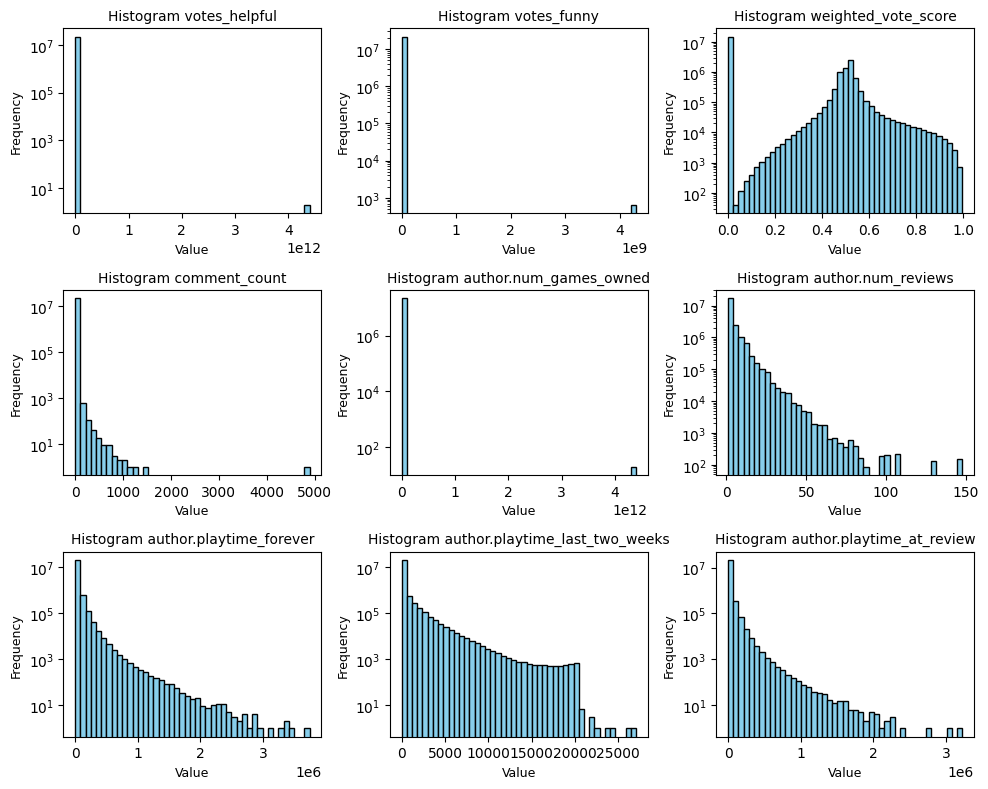

In [16]:
# Plot histograms for each column
fig, axes = plt.subplots(3, 3, figsize=(10,8))

for i in range(3):
    for j in range(3):
        ax = axes[i,j]
        ax.hist(df[numeric_columns[i*3+j]], bins=45, color='skyblue', edgecolor='black', log=True)
        ax.set_title(f'Histogram {numeric_columns[i*3+j]}', fontsize=10)
        ax.set_xlabel('Value', fontsize=9)
        ax.set_ylabel('Frequency', fontsize=9)

plt.tight_layout()
plt.show()

The histograms here further confirm that most of these attributes are heavily right-skewed, indicating that a small number of users or reviews accumulate very high values in terms of votes, playtime, comments, or games owned. A minority of users are highly active in terms of playtime, reviews, and votes, which is common in community-driven platforms where a small core of users tends to be more engaged. ```weighted_vote_score``` is the only feature with a relatively normal distribution, which suggests a balance in how users perceive the helpfulness of reviews.

We see that there are some outliers in the columns ```votes_helpful``` and ```votes_funny```, ```author.num_games_owned``` that heavily influence the statistics. We could try plotting histograms for them again, this time removing extreme outliers.

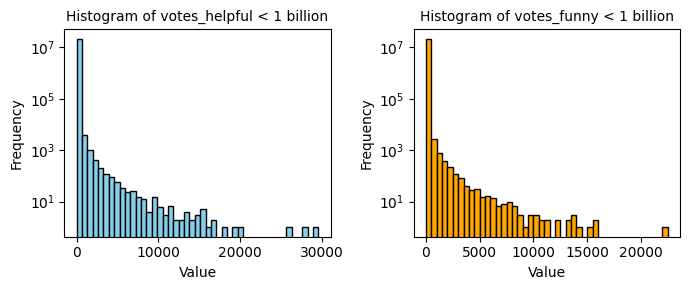

In [17]:
# Plot histograms for 'votes_helpful' and 'votes_funny' without outliers larger than 1e9
fig, axes = plt.subplots(1,2, figsize=(7, 3))
# Plot hist for votes_helpful
axes[0].hist(df[df['votes_helpful']<1e9]['votes_helpful'], bins=45, color='skyblue', edgecolor='black', log=True)
axes[0].set_xlabel('Value')
axes[0].set_ylabel('Frequency')
axes[0].set_title('Histogram of votes_helpful < 1 billion', fontsize=10)
# Plot hist for votes_funny
axes[1].hist(df[df['votes_funny']<1e9]['votes_funny'], bins=45, color='orange', edgecolor='black', log=True)
axes[1].set_xlabel('Value')
axes[1].set_ylabel('Frequency')
axes[1].set_title('Histogram of votes_funny < 1 billion', fontsize=10)
plt.tight_layout()
plt.show()

There are approximately 352,761 games on Steam as of 03/11/2024, according to https://steamdb.info/. This means that values in ```author.num_games_owned``` should not exceed this threshold.

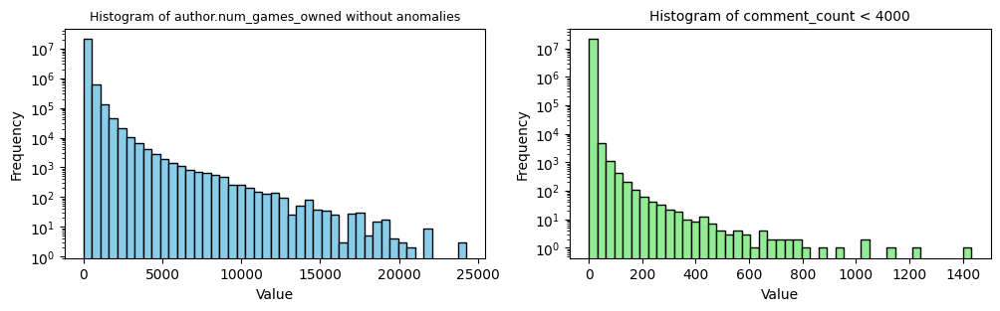

In [18]:
threshold = 352761 # max number of games on Steam (might vary over time)

# Plot histogram for 'author.num_games_owned' for values below the threshold (max number of games on Steam)
fig, axes = plt.subplots(1,2, figsize=(12, 3))
axes[0].hist(df[df['author.num_games_owned']<threshold]['author.num_games_owned'], bins=45, color='skyblue', edgecolor='black', log=True)
axes[0].set_xlabel('Value')
axes[0].set_ylabel('Frequency')
axes[0].set_title('Histogram of author.num_games_owned without anomalies', fontsize=9)
# Plot hist for 'comment_count' without outlier values larger than 4000
axes[1].hist(df[df['comment_count']<4000]['comment_count'], bins=45, color='lightgreen', edgecolor='black', log=True)
axes[1].set_xlabel('Value')
axes[1].set_ylabel('Frequency')
axes[1].set_title('Histogram of comment_count < 4000', fontsize=10)
plt.show()

In [19]:
# Create table with Binary Features Summary
print("Binary Features Summary")
binary_summary(df[binary_columns])

Binary Features Summary


,Feature,Count,Missing,True Count,False Count,True Proportion,False Proportion
0,recommended,21612254,0,18891794,2720460,0.874124,0.125876
1,steam_purchase,21612254,0,16724368,4887886,0.773837,0.226163
2,received_for_free,21612254,0,686054,20926200,0.031744,0.968256
3,written_during_early_access,21612254,0,2016347,19595907,0.093296,0.906704


**Comments**: the ```recommended``` and ```steam_purchase``` have high positive rates, indicating that there was an overall strong user satisfaction and engagement. The low proportions in ```received_for_free``` and ```written_during_early_access``` suggest that most users payed for the game and wrote did not leave reviews during the early access stages of the game. These columns contain no missing values.

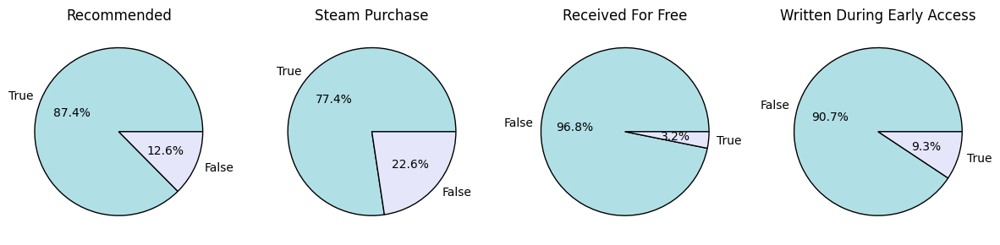

In [20]:
# Plot pie charts of the binary features
fig, axes = plt.subplots(1, 4, figsize=(12, 3))
titles = ['Recommended', 'Steam Purchase', 'Received For Free', 'Written During Early Access'] # titles of the pie charts

for i in range(4):
  ax = axes[i]
  df[binary_columns[i]].value_counts().plot(ax=ax, kind='pie', title=titles[i], autopct = '%.1f%%',
                                            colors=['powderblue','lavender'], wedgeprops={'edgecolor': 'black', 'linewidth': 1})
  ax.set_ylabel('')  # Remove the ylabel
  ax.set_xlabel('')  # Remove the xlabel

plt.tight_layout()
plt.show()

In [21]:
# Create table with Categorical Features Summary
print("Categorical Features Summary")
categorical_summary(df[categorical_columns])

Categorical Features Summary


,Feature,Count,Missing,Unique,Most Common Value,Most Common Count,Least Common Value,Least Common Count
0,app_id,21612254,0,315,578080,1644255,454200,200
1,app_name,21612254,0,315,PLAYERUNKNOWN'S BATTLEGROUNDS,1644255,Neon Hardcorps,200
2,review_id,21612254,0,21612254,65644930,1,65644930,1
3,language,21612254,0,28,english,9580556,vietnamese,6535
4,author.steamid,21612254,0,12406560,76561198062813911,148,76561198275934214,1


**Comments**: this table tells us that there is a total of 315 games/ apps being reviewed, and that the reviews are written in 28 languages, with the most used language being english. The most reviewed game appears to be "PLAYERUNKNOWN'S BATTLEGROUNDS", with 1644255 entries. The high count of author IDs suggests a vast user base, but the relatively low count for the most common author ID indicates that user reviews are quite distributed, which implies that many unique users are participating in the review process. These columns do not have rows with missing values.

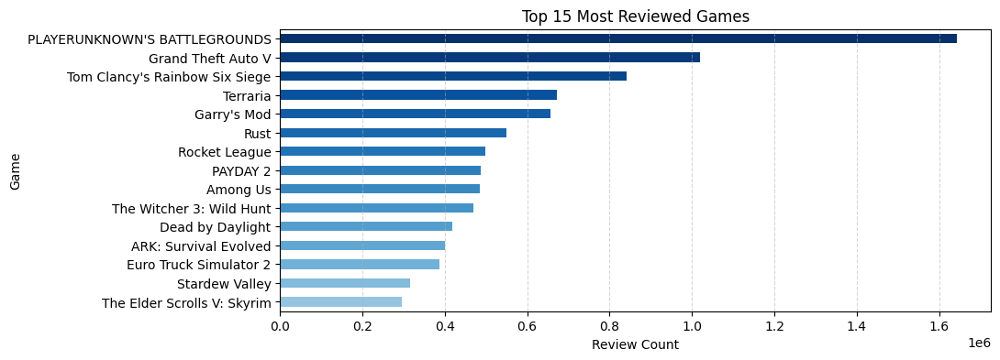


Top 5 Reviewed Apps


,count
app_name,
PLAYERUNKNOWN'S BATTLEGROUNDS,1644255
Grand Theft Auto V,1019114
Tom Clancy's Rainbow Six Siege,841918
Terraria,672810
Garry's Mod,655514


In [22]:
# @title Top 15 Reviewed Games

app_counts = df['app_name'].value_counts()  # Count reviews per game
colors = plt.cm.Blues(np.linspace(0.4, 1, 15))  # Create a green color map
sorted_app_counts = app_counts.sort_values() # Sort app counts in descending order by number of reviews
top_15_app_counts = sorted_app_counts[-15:]  # Take the top 15 values (most reviewed games)
# Plot horizontal bar chart
top_15_app_counts.plot.barh(xlabel='Review Count', ylabel='Game', title='Top 15 Most Reviewed Games', color=colors, figsize=(10, 4))
plt.grid(axis='x', linestyle='--', alpha=0.5)
plt.show()

print("\nTop 5 Reviewed Apps")
top_15_app_counts.tail()[::-1]

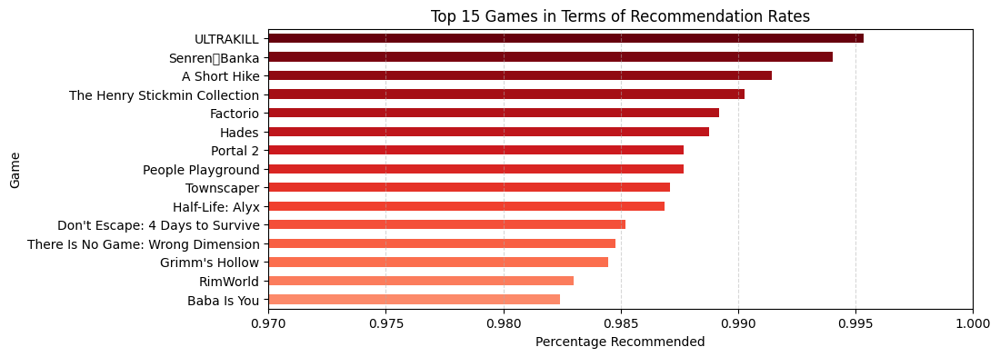

In [23]:
# @title Top 15 Games with Highest Recommendation Rates
# Proportion of recommended games
import warnings
warnings.filterwarnings("ignore", category=UserWarning, module="IPython.core.pylabtools")

proportion_positive = df[df['recommended'] == True].groupby('app_name')['recommended'].sum() / df.groupby('app_name')['recommended'].count()
proportion_positive = proportion_positive.sort_values() # sort the proportions
new_proportion_positive = proportion_positive[-15:] # take the best 15
# Plot a bar chart
colors = plt.cm.Reds(np.linspace(0.4, 1, 15)) # create a red-ish colormap that excludes the lightest colors
new_proportion_positive.plot.barh(xlabel='Percentage Recommended', ylabel='Game', title='Top 15 Games in Terms of Recommendation Rates', color=colors, figsize=(10,4), xlim=(0.97,1))
plt.grid(axis='x', alpha=0.5, linestyle='--')
plt.show()

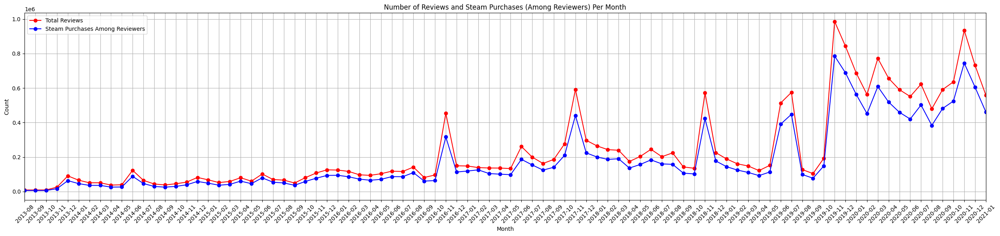

In [24]:
# @title Number of Reviews per Month and Steam Purchase Counts of Reviewers

# Group by month and year for total reviews
monthly_reviews = df.groupby(df['datetime_created'].dt.to_period("M")).size().reset_index()
monthly_reviews.columns = ['Month', 'Review Count']

# Group by month and year for steam_purchase
monthly_steam_purchases = df[df['steam_purchase'] == True].groupby(df['datetime_created'].dt.to_period("M")).size().reset_index()
monthly_steam_purchases.columns = ['Month', 'Steam Purchase Count']

# Convert 'Month' to string for plotting and alignment
monthly_reviews['Month'] = monthly_reviews['Month'].astype(str)
monthly_steam_purchases['Month'] = monthly_steam_purchases['Month'].astype(str)

# Plot the monthly review counts
plt.figure(figsize=(25, 6))
# Plot total reviews
plt.plot(monthly_reviews['Month'], monthly_reviews['Review Count'], marker='o', linestyle='-', color='red', label='Total Reviews')
# Plot steam purchases
plt.plot(monthly_steam_purchases['Month'], monthly_steam_purchases['Steam Purchase Count'], marker='o', linestyle='-', color='blue', label='Steam Purchases Among Reviewers')
plt.xticks(rotation=45)
plt.title('Number of Reviews and Steam Purchases (Among Reviewers) Per Month')
plt.xlabel('Month')
plt.ylabel('Count')
plt.xlim(['2013-08', '2021-01'])
plt.legend()  # add legend to distinguish lines
plt.grid()
plt.tight_layout()
plt.show()

**Comments**: this line plot shows monthly trends for the total number of reviews (red) and Steam purchases among the reviewers (blue) over time. Both follow very similar patterns and suggest a strong correlation. From 2013 to 2021 there has been an overall increase in reviews and purchases. This could reflect the growing popularity of Steam and the increasing number of users on the platform, as well as an expanding library of games available. There are noticeable peaks in reviews and purchases around specific times, particularly in late 2016, late 2017, early 2019, and late 2019. These peaks could correspond to Steam sales events, such as holiday sales or other promotions, which often encourage purchases and engagement. During the pandemic, especially during the 2020 lockdowns, there has been an increase in gaming activity since people spent more time at home. This could explain the elevated levels in both purchases and reviews around that time.

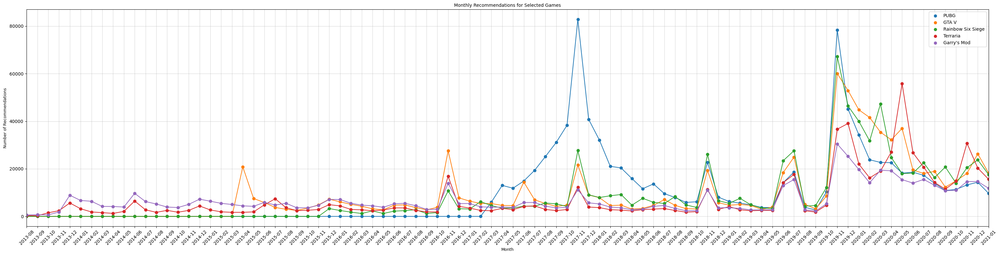

In [26]:
# @title Popularity evolution of the Top 5 most recommended games

# Find the 5 most recommended games
app_counts = df[df['recommended']==True].groupby('app_name')['recommended'].sum()
sorted_app_counts = app_counts.sort_values()
most_recommended_games = sorted_app_counts[-5:][::-1]  # Top 5 games

# Most recommended games: get all the reviews that recommended these games
game1 = df[(df['app_name'] == most_recommended_games.index[0]) & (df['recommended'] == True)]
game2 = df[(df['app_name']== most_recommended_games.index[1]) & (df['recommended'] == True)]
game3 = df[(df['app_name']== most_recommended_games.index[2]) & (df['recommended'] == True)]
game4 = df[(df['app_name']== most_recommended_games.index[3]) & (df['recommended'] == True)]
game5 = df[(df['app_name']== most_recommended_games.index[4]) & (df['recommended'] == True)]

# Monthly recommendation counts for each game
monthly_counts_game1 = get_monthly_recommendations(game1)
monthly_counts_game2 = get_monthly_recommendations(game2)
monthly_counts_game3 = get_monthly_recommendations(game3)
monthly_counts_game4 = get_monthly_recommendations(game4)
monthly_counts_game5 = get_monthly_recommendations(game5)

# Create data frame of monthly data
monthly_data = pd.DataFrame({
    "PUBG": monthly_counts_game1,
    "GTA V": monthly_counts_game2,
    "Rainbow Six Siege": monthly_counts_game3,
    "Terraria": monthly_counts_game4,
    "Garry's Mod": monthly_counts_game5
})

monthly_data = monthly_data.fillna(0).reset_index()  # Fill NaN and reset index
monthly_data.rename(columns={'index': 'Month'}, inplace=True)  # rename the index column to 'Month'

plt.figure(figsize=(31, 8))

# Set the timestamp_created as the x-axis
for game in monthly_data.columns[1:]:  # skip the 'timestamp_created' column
    plt.scatter(monthly_data['datetime_created'].astype(str), monthly_data[game], label=game)
    plt.plot(monthly_data['datetime_created'].astype(str), monthly_data[game], linestyle='-', marker='o')

# Format the plot
plt.xticks(rotation=45)  # rotate x-axis labels for better readability
plt.title('Monthly Recommendations for Selected Games', fontsize=10)
plt.xlabel('Month', fontsize=9)
plt.ylabel('Number of Recommendations', fontsize=9)
plt.legend()
plt.grid(alpha=0.5)
plt.xlim(['2013-08','2021-01'])
plt.tight_layout()
plt.show()

**Comments**: Most games experience a significant spike shortly after release or during major updates, events, or promotions. After these peaks, there is often a gradual decline but not a complete drop, indicating that popular games maintain a long-term fanbase. There are moments during which game popularity rises across multiple fandoms at the same time, indicating that perhaps the popularity of some games induces an increase in popularity in neighboring game communities. There is a notable spike in early 2020 across several games, which aligns with the start of the Covid pandemic.

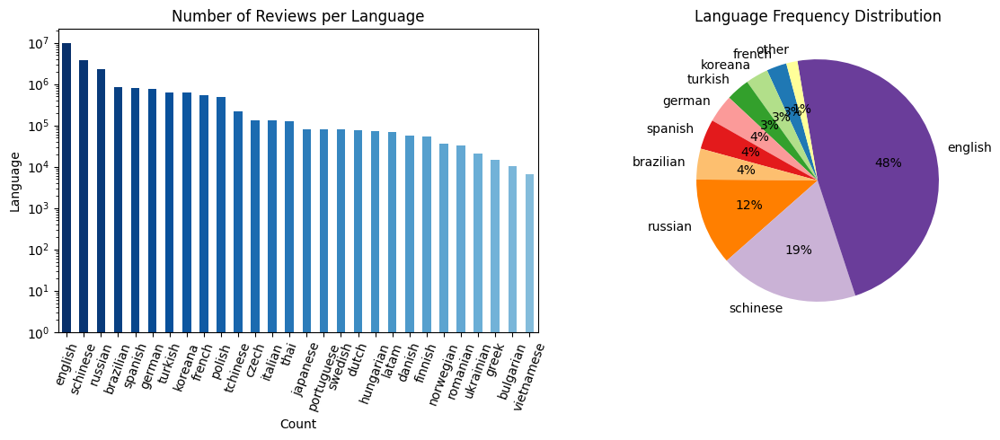

In [27]:
# @title Language Frequencies

language_counts = df['language'].value_counts() # Language counts
sorted_language_counts = language_counts.sort_values()
new_language_counts = sorted_language_counts[-9:]  # Top 9 most frequent languages
new_language_counts['other'] = language_counts[-9:].sum()  #sum of all other languages as "other"

colors = plt.cm.Blues(np.linspace(0.4, 1, 30)[::-1]) # create a blue-ish colormap that excludes the lightest colors
# Generate specific colors for the pie chart (e.g., from a sequential color map)
pie_colors = plt.cm.Paired(np.linspace(0.1, 0.9, 10))  # 'Paired' gives more distinct colors

# Create a figure with 1 row and 2 columns of subplots
fig, axes = plt.subplots(1, 2, figsize=(23, 5.5))

# Bar chart
df.language.value_counts().plot.bar(ax=axes[0], color=colors, xlabel='Count', ylabel='Language', title='Number of Reviews per Language', figsize=(12,5), log=True)
axes[0].tick_params(axis='x', rotation=70)

# Pie chart
axes[1].pie(new_language_counts, labels=new_language_counts.index, autopct='%1.0f%%', startangle=105, colors=pie_colors)
axes[1].set_title("Language Frequency Distribution")

plt.tight_layout()
plt.show()

Some other information we can draw from the dataset is to identify the most active users (in particular, author IDs) in terms of number of reviews written, playtime and number of games owned. Since some authors have published more than one review, there will be multiple records in the dataset featuring their user ID. Finally, we can analyze the relationship between the number of comments left on a review and the number of votes.

In [28]:
# @title Users that wrote most reviews
print("Users with the highest review counts:")

# Top 10 users by number of reviews
top_reviewers = df.groupby('author.steamid')['review_id'].count().sort_values(ascending=False).head(10)
top_reviewers_df = top_reviewers.reset_index()  # Convert to DataFrame and reset index (turn indices back to a column)
top_reviewers_df.columns = ['author.steamid', 'review counts']  # Rename columns
top_reviewers_df

Users with the highest review counts:


,author.steamid,review counts
0,76561198062813911,148
1,76561198315585536,131
2,76561198192166873,106
3,76561198239163744,106
4,76561198045381877,102
5,76561198064946151,99
6,76561198013146396,98
7,76561198027973295,96
8,76561197969749884,88
9,76561197989746995,85


In [29]:
# @title Users that own most games
print("Users with highest number of games owned:")

# Top 10 users by number of games owned
top_reviewers = df.groupby('author.steamid')['author.num_games_owned'].count().sort_values(ascending=False).head(10)
top_reviewers_df = top_reviewers.reset_index()  # Convert to DataFrame and reset index (turn indices back to a column)
top_reviewers_df.columns = ['author.steamid', 'owned games counts']  # Rename columns
top_reviewers_df

Users with highest number of games owned:


,author.steamid,owned games counts
0,76561198062813911,148
1,76561198315585536,131
2,76561198192166873,106
3,76561198239163744,106
4,76561198045381877,102
5,76561198064946151,99
6,76561198013146396,98
7,76561198027973295,96
8,76561197969749884,88
9,76561197989746995,85


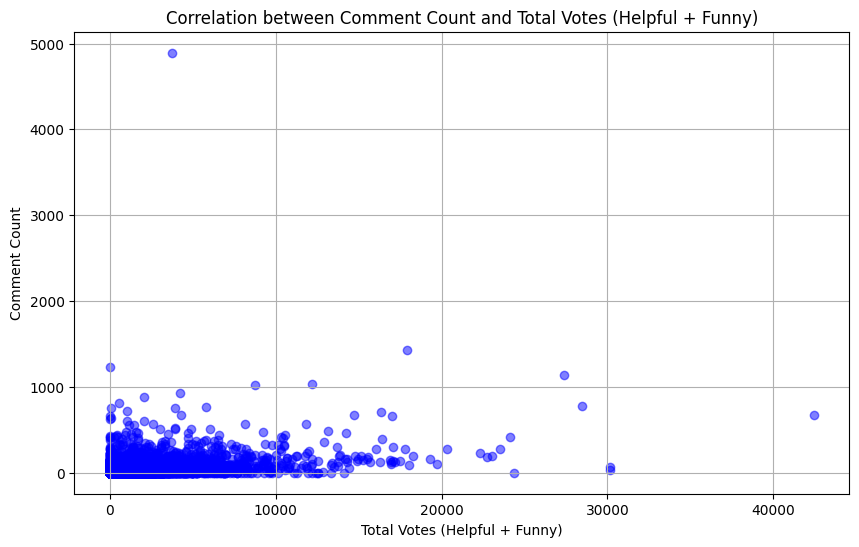

In [30]:
# Create a pandas series for the sum of votes_helpful and votes_funny (eliminating outliers over 1e9)
total_votes = df[(df['votes_helpful']<1e9) & (df['votes_funny']<1e9)]['votes_helpful'] + df[(df['votes_helpful']<1e9) & (df['votes_funny']<1e9)]['votes_funny']

# Create a new DataFrame combining the columns review_id, comment_count, and total_votes
votes_and_comments = pd.concat([df[(df['votes_helpful']<1e9) & (df['votes_funny']<1e9)][['review_id', 'comment_count']], total_votes.rename('total_votes')], axis=1)

# Plot the scatter plot
plt.figure(figsize=(10, 6))
plt.scatter(votes_and_comments['total_votes'].astype(int), votes_and_comments['comment_count'].astype(int), alpha=0.5, color='blue')
plt.title("Correlation between Comment Count and Total Votes (Helpful + Funny)")
plt.xlabel("Total Votes (Helpful + Funny)")
plt.ylabel("Comment Count")
plt.grid(True)
plt.show()

**Comments**: this scatter plot shows the relationship between the total votes (```votes_helpful```+```votes_funny```). Most data points are clustered in the lower-left part of the plot, suggesting that most reviews receive relatively few votes and few comments. There are a few outliers with very high comment counts, some reaching up to around 5000, while their total votes remain relatively low. This implies that certain topics might trigger more discussions or debates despite not receiving as many votes, which could indicate a slight disconnect between what drives people to vote and what inspires them to comment. There does not seem to be a strong or consistent correlation between total votes and comment count. In fact, past a certain threshold the range of comment counts seems to remain low, suggesting that additional votes may not lead to proportionately higher comment engagement. The distribution also shows that very high total votes (above 15000) are relatively rare, indicating that few entries achieve such high levels of popularity.


# Research Question 2

<h2 style="display: inline;">[RQ 2]</h2><span style="font-size: 18px; font-style: italic;">Let's explore the dataset by analyzing the distribution of reviews across different applications.</span>

### Identify which applications have the highest and lowest number of reviews.

The following code generates two different bar plots. The first plot displays the applications with the 5 highest numbers of reviews, sorted in descending order. The second plot shows the applications with the 5 lowest numbers of reviews, sorted in ascending order.

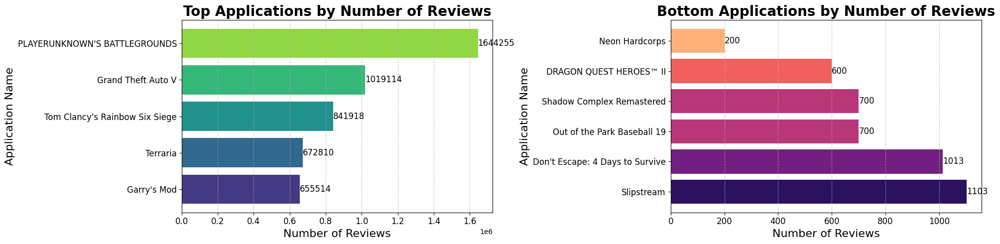

In [31]:
# Group the DataFrame by 'app_id' and count the number of 'review_id' for each app
review_counts = df.groupby('app_id').agg(
    app_name=('app_name', 'last'),  # Keep the last 'app_name' for each 'app_id'
    review_count=('review_id', 'count')  # Count the number of reviews for each app
)

# Convert the grouped data back into a DataFrame
review_counts = review_counts.reset_index()

# Identify the top five applications by reviews
min_top_review_count = pd.Series(review_counts['review_count'].unique()).nlargest(5).min()
top_applications = review_counts[review_counts['review_count'] >= min_top_review_count]

# Sort top applications in descending order
top_applications = top_applications.sort_values('review_count', ascending=True)

# Identify the bottom five applications by reviews
max_bottom_review_count = pd.Series(review_counts['review_count'].unique()).nsmallest(5).max()
bottom_applications = review_counts[review_counts['review_count'] <= max_bottom_review_count]

# Sort bottom applications in ascending order
bottom_applications = bottom_applications.sort_values('review_count', ascending=False)

# Create a color mapping for review counts for both top and bottom applications
top_unique_counts = top_applications['review_count'].unique()
bottom_unique_counts = bottom_applications['review_count'].unique()

top_colors = sns.color_palette('viridis', len(top_unique_counts))  # Generate a color palette for top applications
bottom_colors = sns.color_palette('magma', len(bottom_unique_counts))  # Generate a different color palette for bottom applications

top_count_color_mapping = {count: top_colors[i] for i, count in enumerate(top_unique_counts)}
bottom_count_color_mapping = {count: bottom_colors[i] for i, count in enumerate(bottom_unique_counts)}

# Create a combined plot with enhanced visualization
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(20, 5))

# Top Applications Plot
top_applications['color'] = top_applications['review_count'].map(top_count_color_mapping)  # Map colors for top applications
axes[0].barh(top_applications['app_name'], top_applications['review_count'], color=top_applications['color'])
axes[0].set_title('Top Applications by Number of Reviews', fontsize=20, weight='bold')
axes[0].set_xlabel('Number of Reviews', fontsize=16)
axes[0].set_ylabel('Application Name', fontsize=16)
axes[0].tick_params(labelsize=12)
axes[0].grid(axis='x', linestyle='--', alpha=0.7)

# Add data labels on top of bars for better insight
for index, value in enumerate(top_applications['review_count']):
    axes[0].text(value, index, f'{value}', va='center', fontsize=12)

# Bottom Applications Plot
bottom_applications['color'] = bottom_applications['review_count'].map(bottom_count_color_mapping)  # Map colors for bottom applications
axes[1].barh(bottom_applications['app_name'], bottom_applications['review_count'], color=bottom_applications['color'])
axes[1].set_title('Bottom Applications by Number of Reviews', fontsize=20, weight='bold')
axes[1].set_xlabel('Number of Reviews', fontsize=16)
axes[1].set_ylabel('Application Name', fontsize=16)
axes[1].tick_params(labelsize=12)
axes[1].grid(axis='x', linestyle='--', alpha=0.7)

# Add data labels on top of bars for better insight
for index, value in enumerate(bottom_applications['review_count']):
    axes[1].text(value, index, f'{value}', va='center', fontsize=12)

# Adjust layout
plt.tight_layout()
plt.show()

### Plot the number of reviews for each application in descending order. What insights can you draw from the plot?

The following code generates a bar plot showing the number of reviews for each application, sorted in descending order.

In [32]:
def integer_formatter(x, pos):
    """
    Format the x-axis tick labels as integers.

    Parameters:
    - x (float): The tick value to be formatted. This is the position on the x-axis
      where the label will be displayed.
    - pos (int): The position index of the tick label. While this parameter is
      required by the formatter function's signature, it is not used in this function.

    Returns:
    - str: The formatted tick label as an integer (string format).
    """
    return f'{int(x)}'

# Sort the review counts in descending order
sorted_review_counts = review_counts.sort_values('review_count', ascending=False)

# Define the path for the custom font. The chinesefont dataset is provided on Kaggle for the recognition of Chinese characters.
font_path = 'simsun.ttc'
# Create font properties for rendering text
font_prop = font_manager.FontProperties(fname=font_path)

# Set the figure size and background
plt.figure(figsize=(80, 150), dpi=80, facecolor='w')

# Create a bar plot for the review counts
ax = sns.barplot(x='review_count', y='app_name', data=sorted_review_counts)
plt.xscale('log')  # Use a logarithmic scale for the x-axis to effectively plot smaller values, which are significantly smaller compared to the largest value.
plt.gca().xaxis.set_major_formatter(FuncFormatter(integer_formatter))  # Format x-axis ticks

# Annotate each bar with its height (review count)
for p in ax.patches:
    ax.annotate(f'{int(p.get_width())}',
                (p.get_width() + 1, p.get_y() + p.get_height() / 2),  # Add lateral space for the label
                ha='left', va='center',
                fontsize=40, color='black')

# Adjust tick labels for readability
plt.xticks(fontsize=50)
plt.yticks(fontproperties=font_prop, fontsize=40)
plt.xlabel('Review Count', weight='bold', fontsize=70)
plt.ylabel('Application Name', weight='bold', fontsize=70)
plt.title('Review Count per Application', weight='bold', fontsize=90)

# Adjust layout to prevent overlap
plt.tight_layout()
plt.show()

Given the challenges in identifying clear trends from this descriptive plot, we should consider utilizing additional significant visualizations to enhance our analysis. By exploring these alternative plots, we can gain a more comprehensive understanding of the data and uncover patterns that may not be readily apparent in the initial representation.

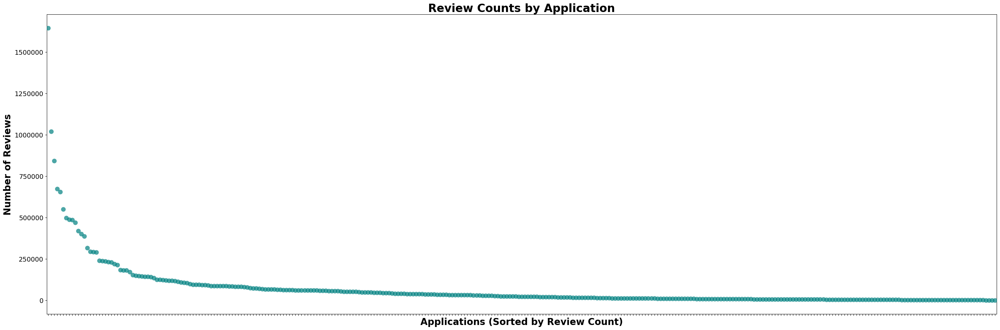

In [33]:
# Sort the review counts in descending order
sorted_review_counts = review_counts.sort_values('review_count', ascending=False)

# Define the path to the custom font file for Chinese characters
font_path = 'simsun.ttc'
font_prop = font_manager.FontProperties(fname=font_path)  # Create font properties

# Set the figure size for better visibility
plt.figure(figsize=(30, 10))  # Adjust the figure size as needed

# Create a strip plot to show the distribution of review counts
sns.stripplot(x='app_name', y='review_count', data=sorted_review_counts,
               size=10, color='teal', alpha=0.7, jitter=True)

# Hide x-ticks while maintaining their positions
plt.tick_params(axis='x', labelbottom=False)

# Format y-axis labels using the integer formatter
plt.gca().yaxis.set_major_formatter(FuncFormatter(integer_formatter))
plt.yticks(fontsize=14)  # Font size for y-ticks

# Label axes with bold formatting and increased font sizes
plt.xlabel('Applications (Sorted by Review Count)', weight='bold', fontsize=20)
plt.ylabel('Number of Reviews', weight='bold', fontsize=20)

# Set the title with increased font size for better visibility
plt.title('Review Counts by Application', weight='bold', fontsize=24)

# Adjust the layout to prevent overlap of elements
plt.tight_layout()

# Show the plot
plt.show()

This plot displays the distribution of `review_count` across various applications, ordered in descending order by the number of reviews each application has received. The distribution follows a **long-tail pattern**, which is characteristic of a **power-law distribution** commonly observed in digital engagement metrics, where a small subset of items garners the majority of user attention and interaction.

The graph exhibits a **pronounced concentration of reviews** on the left side, which tapers off into a **long tail** on the right. This suggests that while a few applications receive a disproportionately large number of reviews, the vast majority of applications accumulate far fewer, resulting in a markedly skewed distribution. Key observations include the following:

1. **High Engagement Among a Small Set of Popular Applications**
   - The leftmost portion of the plot is dominated by a small group of applications with exceptionally high review counts, some of which exceed $1.5$ *million* reviews. This segment highlights that a limited number of applications capture a significant share of user engagement. These high-review applications are likely to be widely popular, reflecting strong user interest, frequent use, and consistent feedback from a large audience base.

2. **Rapid Decline in Review Counts After Top Applications**
   - Moving slightly to the right from the peak, there is a steep decline in review counts, indicating that after the top applications, user engagement drops sharply. This swift decrease suggests that while a handful of applications enjoy substantial user interactions, the next tier experiences a considerable reduction in engagement levels. This rapid drop-off is characteristic of power-law distributions, where engagement diminishes quickly as one moves away from the most popular items.

3. **The Long Tail: Limited Engagement for Most Applications**
   - The plot's right side features a **long tail** where the majority of applications reside. These applications attract comparatively low review counts, which signifies limited user engagement. This portion of the distribution likely comprises niche or lesser-known applications with smaller, specialized audiences. While these applications may serve unique user needs or interests, they do not generate widespread attention or feedback on the scale of the top-performing applications. This **long-tail distribution** of review counts underscores a highly uneven engagement landscape, where a few popular applications receive a dominant share of user feedback, while the rest capture only minimal attention. For stakeholders, this pattern indicates that user engagement is **concentrated among a small number of highly popular applications**, while the majority are used infrequently and may cater to more specialized or limited audiences.

Understanding this distribution has important implications for **product development** and **marketing strategies**:
   - **For developers**: Reaching the top tier of applications in terms of user engagement can be challenging but offers significant rewards in terms of visibility and feedback. Applications aiming to achieve widespread popularity must prioritize features, usability, and marketing efforts that align with broad user preferences.
   - **For marketers**: Focusing on niche applications may be viable for capturing targeted user segments, albeit with lower levels of interaction. Alternatively, substantial marketing efforts might be required to elevate an application's position within the high-engagement segment, especially in a crowded digital marketplace.

Overall, this distribution provides insight into the competitive dynamics within app ecosystems, highlighting the disparity in user engagement levels across applications and the challenges for new or niche applications in achieving similar levels of interaction.

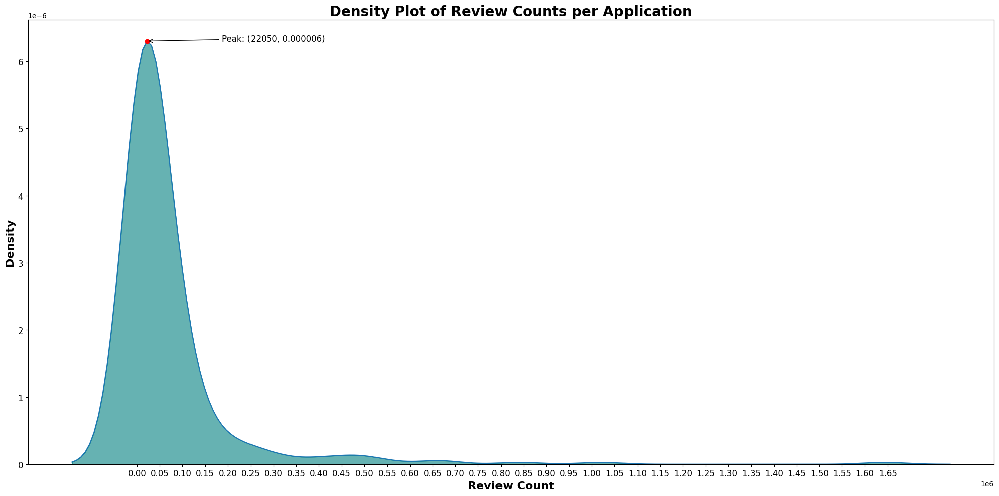

In [34]:
# Sort the review counts in descending order
sorted_review_counts = review_counts.sort_values('review_count', ascending=False)

# Define the path to the custom font file for Chinese characters
font_path = 'simsun.ttc'
font_prop = font_manager.FontProperties(fname=font_path)  # Create font properties

# Set the figure size for better visibility
plt.figure(figsize=(20, 10))  # Size adjusted for density plot

# Create a density plot (KDE plot) for review counts
sns.kdeplot(data=sorted_review_counts['review_count'], fill=True, color='teal', alpha=0.6)

# Find the peak of the density plot
x_values = sorted_review_counts['review_count']
kde = sns.kdeplot(data=x_values).get_lines()[0].get_data()
x_peak = kde[0][kde[1].argmax()]  # x-value of the peak
y_peak = kde[1].max()  # y-value of the peak

# Highlight the peak on the plot
plt.plot(x_peak, y_peak, 'ro')  # Red dot at the peak

# Annotate the peak with its coordinates
plt.annotate(f'Peak: ({int(x_peak)}, {y_peak:.6f})',
             xy=(x_peak, y_peak),
             xytext=(x_peak + 0.1 * max(x_values), y_peak),
             arrowprops=dict(facecolor='black', arrowstyle='->'),
             fontsize=12, color='black')

plt.xticks(np.arange(0, sorted_review_counts['review_count'].max() + 50000, 50000), fontsize=12)
plt.yticks(fontsize=12)

# Label axes with bold formatting and increased font sizes
plt.xlabel('Review Count', weight='bold', fontsize=16)
plt.ylabel('Density', weight='bold', fontsize=16)

# Set the title with increased font size for clarity
plt.title('Density Plot of Review Counts per Application', weight='bold', fontsize=20)

# Adjust the layout to prevent overlap of elements
plt.tight_layout()

# Show the plot
plt.show()

This density plot provides additional insight into the distribution of `review_count` across applications, supporting the findings from the previous graph. Here, the x-axis represents review counts, while the y-axis indicates the density, or relative frequency, of applications at each review count level. Key observations include the following:

- **Most Frequent Review Counts**: The highest density is observed around **$22050$ reviews**, which represents the most common level of user engagement across applications. This concentration suggests that a significant number of applications achieve this moderate level of user interaction, indicating a typical range of engagement for many apps.

- **Low Frequency at Higher Review Counts**: As review counts increase, density drops off sharply, forming a long tail. This decrease highlights that applications with very high review counts are increasingly rare. The plot extends to the right, reaching up to over **1.6 million reviews**, but only a few applications fall within this high-engagement range, emphasizing that these are rare outliers.

This distribution confirms a skewed pattern where the majority of applications receive modest engagement, while only a small number achieve very high review counts. This long-tail distribution reinforces the observation from the previous graph: although there are numerous applications, only a select few capture a substantial share of user reviews, a common trend in digital ecosystems.

### For the top 5 applications by number of reviews, how many reviews came from users who purchased the application versus those who received it for free? Provide a percentage breakdown and highlight any similarities.

This code performs an analysis of the top five applications ranked by the number of reviews. It aggregates the total purchases and free usage for each application and computes the corresponding percentages relative to the total review count. This information is then visualized in a bar plot, providing a clear comparison of the sources of reviews. Each bar is annotated with its exact average value, with color coding used to highlight minimum and maximum values for both metrics: red for the minimum and green for the maximum. Finally, a detailed summary of the usage statistics, including review counts, total purchases, total free usage and their respective percentages, is printed to the console for further insight.

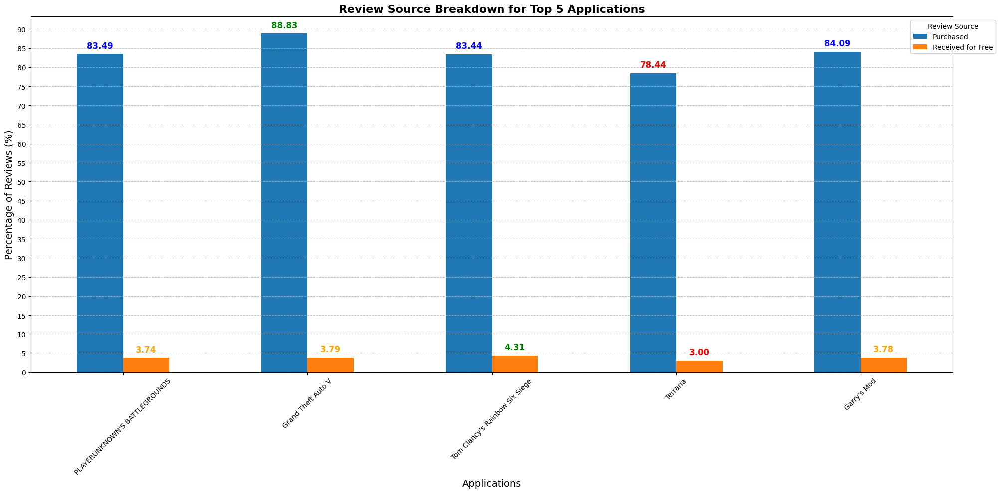


Detailed Usage Information:
                         app_name  review_count  total_purchases  \
4   PLAYERUNKNOWN'S BATTLEGROUNDS       1644255          1372721   
2              Grand Theft Auto V       1019114           905286   
3  Tom Clancy's Rainbow Six Siege        841918           702505   
1                        Terraria        672810           527757   
0                     Garry's Mod        655514           551242   

   total_free_usage  purchase_percentage  free_usage_percentage  
4             61443            83.485895               3.736829  
2             38624            88.830690               3.789959  
3             36300            83.441024               4.311584  
1             20154            78.440719               2.995496  
0             24765            84.093093               3.777951  


In [35]:
# Select rows for the top 5 applications based on review count
top_five_apps = df[df['app_id'].isin(top_applications['app_id'])]

# Aggregate data: count total purchases and free usage for each app_id
app_usage_counts = top_five_apps.groupby('app_id').agg(
    app_name=('app_name', 'last'),  # Keep the last 'app_name' for each 'app_id'
    total_purchases=('steam_purchase', 'sum'),  # Total purchases from reviewers
    total_free_usage=('received_for_free', 'sum')  # Total free usage from reviewers
)

# Merge with review counts to compute percentages
final_app_usage = app_usage_counts.merge(review_counts[['app_id', 'review_count']], on='app_id')
final_app_usage['purchase_percentage'] = final_app_usage['total_purchases'] / final_app_usage['review_count'] * 100
final_app_usage['free_usage_percentage'] = final_app_usage['total_free_usage'] / final_app_usage['review_count'] * 100

# Sort data by review count in descending order
sorted_final_app_usage = final_app_usage.sort_values(['review_count'], ascending=False)

# Prepare data for visualization
usage_data = sorted_final_app_usage[['app_name', 'purchase_percentage', 'free_usage_percentage']].set_index('app_name')

# Create bar plot for review percentages
fig, ax = plt.subplots(figsize=(20, 10))
usage_data.plot(kind='bar', stacked=False, ax=ax, color=['#1f77b4', '#ff7f0e'])  # Plot the data

# Add titles and labels
plt.title('Review Source Breakdown for Top 5 Applications', fontsize=16, weight='bold')
plt.xlabel('Applications', fontsize=14)
plt.ylabel('Percentage of Reviews (%)', fontsize=14)
plt.xticks(rotation=45)  # Rotate x-axis labels
ax.set_yticks(range(0, 91, 5))  # Set y-axis ticks every 5 units
plt.legend(title='Review Source', labels=['Purchased', 'Received for Free'], bbox_to_anchor=(1.05, 1)) # Legend
plt.grid(axis='y', linestyle='--', alpha=0.7)  # Add grid lines

# Annotate each bar with exact values and customize min/max labels.
for i, container in enumerate(ax.containers):
    for bar in container:
        height = bar.get_height()

        # Determine color based on the average value for both metrics
        if i == 0:  # First column
            color = 'red' if height == sorted_final_app_usage['purchase_percentage'].min() else 'green' if height == sorted_final_app_usage['purchase_percentage'].max() else 'blue'
        elif i == 1:  # Second column
            color = 'red' if height == sorted_final_app_usage['free_usage_percentage'].min() else 'green' if height == sorted_final_app_usage['free_usage_percentage'].max() else 'orange'
        ax.text(
                bar.get_x() + bar.get_width() / 2, height + 1, f"{height:.2f}",  # Position above the bar
                ha="center", va="bottom", fontsize=12, color=color, weight='bold'  # Vertical rotation
            )

plt.tight_layout()  # Adjust layout
plt.show()  # Display the plot

# Output detailed usage information
detailed_usage = sorted_final_app_usage[['app_name', 'review_count', 'total_purchases', 'total_free_usage', 'purchase_percentage',
                                         'free_usage_percentage']]
print("\nDetailed Usage Information:")
print(detailed_usage)


The plot illustrates that the **percentage of reviews for purchased games** ranges from **$78.44$%** to **$88.83$%**, while the **percentage of reviews for games received for free** varies between **$3$%** and **$4.31$%**. This indicates a **significant disparity** in user feedback based on the acquisition method, with the vast majority of reviews coming from users who purchased the games.

Additionally, the data reveals that the percentages are relatively consistent across the top five applications, suggesting that the behavior of reviewers is similar regardless of the specific application. Notably, *Terraria* stands out as having the lowest percentages for both metrics, indicating that it has a smaller proportion of reviews from both purchased and free users compared to the other top applications. This could suggest either a less engaged user base or potentially a difference in the marketing or distribution strategies employed for
*Terraria* compared to its peers.

Overall, the analysis highlights the strong tendency of users to leave reviews for games they have purchased, while the low percentage of reviews for games received for free may reflect lower engagement or differing motivations for providing feedback in those cases.

To deepen our analysis, we present a scatter plot that examines the relationship between the percentage of reviews for purchased games and those received for free among the top five applications.

This plot allows us to:A

1. **Assess Correlation**: Identify any trends between the two review percentages, revealing whether higher purchase review rates correspond to higher or lower free game review rates.

2. **Detect Outliers**: Highlight applications that deviate from expected patterns, prompting further investigation.

3. **Understand Variability**: Visualize how review percentages differ across applications, offering insights into user engagement.

Overall, this scatter plot complements the bar plot by providing a clearer picture of user behavior regarding game purchases versus free offerings.


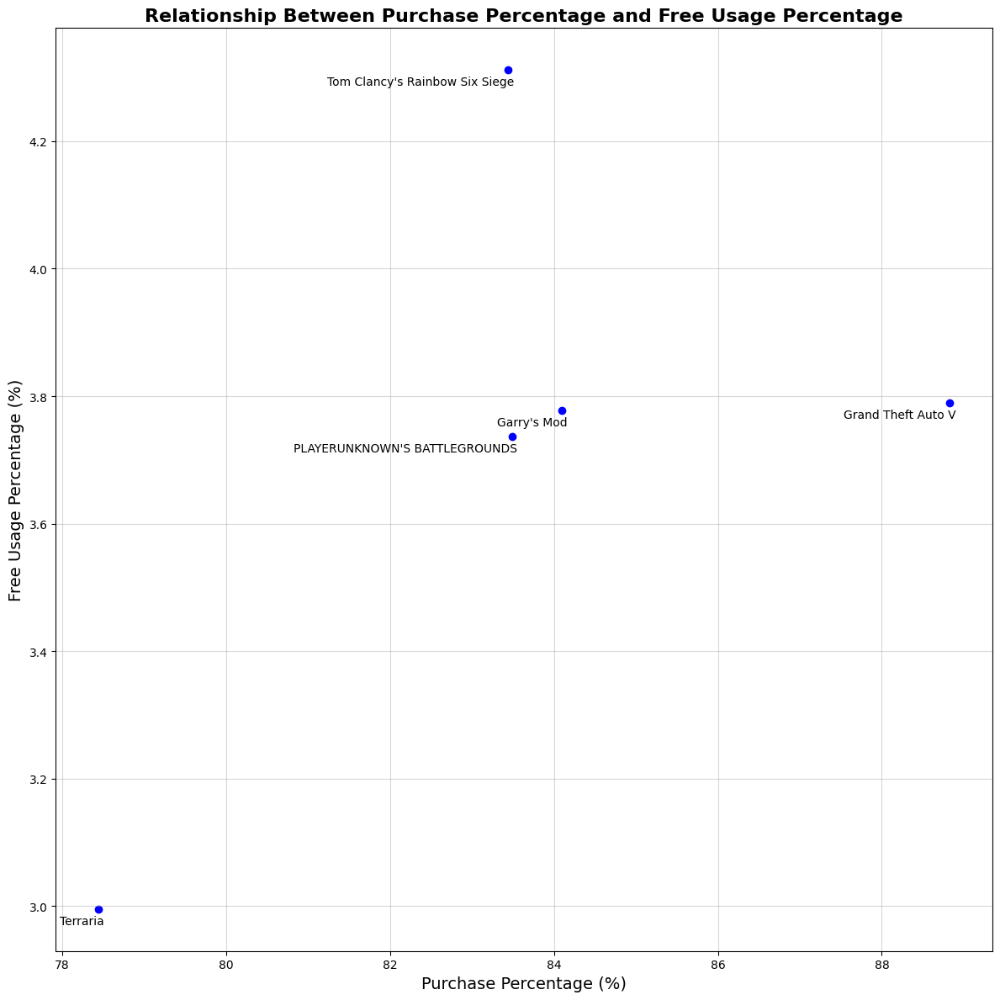

In [36]:
# Prepare data for the scatter plot
x = sorted_final_app_usage['purchase_percentage']  # Purchase percentages for x-axis
y = sorted_final_app_usage['free_usage_percentage']  # Free usage percentages for y-axis
labels = sorted_final_app_usage['app_name']  # App names for labeling points

# Create scatter plot
plt.figure(figsize=(12, 12))  # Increase figure size for better spacing
plt.scatter(x, y, color='blue')  # Plot the scatter points

# Add labels for each point with improved positioning
for i, label in enumerate(labels):
    # Calculate offsets based on the value and position
    offset_x = 5  # Move slightly to the right
    offset_y = -5  # Move slightly down

    # Adjust annotation positioning to prevent overlap
    plt.annotate(label,
                 (x.iloc[i], y.iloc[i]),
                 fontsize=10,
                 ha='right',  # Align text to the left
                 va='top',   # Align text to the top
                 xytext=(offset_x, offset_y),  # Add offset
                 textcoords='offset points')  # Use offset points for positioning

# Add titles and labels
plt.title('Relationship Between Purchase Percentage and Free Usage Percentage', fontsize=16, weight='bold')  # Title
plt.xlabel('Purchase Percentage (%)', fontsize=14)  # X-axis label
plt.ylabel('Free Usage Percentage (%)', fontsize=14)  # Y-axis label
plt.grid(alpha=0.5)  # Add grid for better readability

# Show the plot
plt.tight_layout()  # Adjust layout to prevent overlap
plt.show()  # Display the scatter plot

This scatter plot examines the relationship between the **purchase percentage** and **free usage percentage** for a selection of popular games. Each point represents a different game, plotting how often it is purchased directly versus accessed for free. The free usage percentage likely reflects promotional events, free weekends, or trial periods that allow users to try the game without purchasing. Key observations include the following:

1. **High Free Usage and High Purchase Percentage**:
   - **Tom Clancy's Rainbow Six Siege** stands out with the highest free usage percentage. Its purchase percentage, however, is slightly lower than other games in the high-purchase category, suggesting that the game relies significantly on free access promotions to attract users. This strategy may be effective in converting free users into paying customers over time.
   - **Grand Theft Auto V** and **Garry's Mod** also show relatively high free usage percentages with high purchase percentages. This combination suggests a successful strategy that blends high sales with regular free access events, likely designed to sustain interest and reach a broad audience. Their placement on the plot indicates that these games balance direct sales with promotional access, maximizing engagement and popularity.

2. **Moderate Free Usage and Purchase Percentage**:
   - **PLAYERUNKNOWN'S BATTLEGROUNDS** has a purchase percentage of $83.49$*%* and a free usage rate of $3.74$*%*. This suggests a balanced approach, relying slightly less on free promotions than games like *Tom Clancy's Rainbow Six Siege*, but still engaging users through limited free access opportunities. Its strategy may involve occasional free events to complement its strong direct purchase base.

3. **Low Free Usage and Low Purchase Percentage**:
   - **Terraria** shows both the lowest purchase percentage and the lowest free usage percentage). This indicates that Terraria relies less on free access promotions compared to the other games. Its low free usage suggests fewer promotional events or trials, possibly reflecting a strategy focused on a consistent, niche audience that is more inclined to purchase the game directly without needing incentives from free trials or events.

The plot suggests a **positive correlation** between purchase percentage and free usage percentage, where games with higher purchase percentages also tend to have higher free usage rates. This pattern could indicate that games which are popular and frequently purchased are also more likely to use free access strategically, allowing new players to experience the game before committing to a purchase.

This trend highlights **free usage as an effective marketing tool**: games like *Garry's Mod* and *Grand Theft Auto V* use free access periods not only to expand their reach but also to reinforce their appeal, converting new users into paying customers. The insights from this plot can help game developers and marketers find an optimal balance between direct sales and free access events to maximize both engagement and revenue.

### Which applications have the most and the least user recommendations? Summarize your findings.

The following code generates two different bar plots. The first plot displays the applications with the 5 highest numbers of recommendations, sorted in descending order. The second plot shows the applications with the 5 lowest numbers of recommendations, sorted in ascending order.

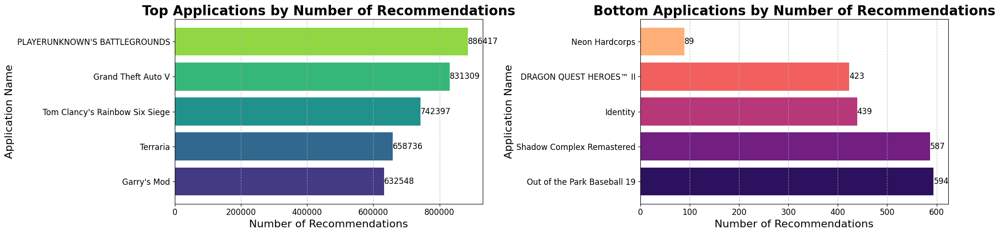

In [37]:
# Group the DataFrame by 'app_id' and aggregate the data
true_recommendations = df.groupby('app_id').agg(
    app_name=('app_name', 'last'),  # Retain the most recent 'app_name' for each unique 'app_id'.
    recommendations_count=('recommended', 'sum')  # Count the total number of recommendations (both True and False).
)

# Convert the grouped data back into a DataFrame
true_recommendations = true_recommendations.reset_index()

# Find the minimum number of recommendations among the top 5 unique counts
max_recommendations = pd.Series(true_recommendations['recommendations_count'].unique()).nlargest(5).min()

# Filter applications with recommendations count greater than or equal to max_recommendations
top_rec_applications = true_recommendations[true_recommendations['recommendations_count'] >= max_recommendations]

# Sort top applications in ascending order based on recommendations count
top_rec_applications = top_rec_applications.sort_values('recommendations_count', ascending=True)

# Find the maximum number of recommendations among the bottom 5 unique counts
min_recommendations = pd.Series(true_recommendations['recommendations_count'].unique()).nsmallest(5).max()

# Filter applications with recommendations count less than or equal to min_recommendations
bottom_rec_applications = true_recommendations[true_recommendations['recommendations_count'] <= min_recommendations]

# Sort bottom applications in descending order based on recommendations count
bottom_rec_applications = bottom_rec_applications.sort_values('recommendations_count', ascending=False)

# Create a color mapping for review counts for both top and bottom applications
top_rec_unique_counts = top_rec_applications['recommendations_count'].unique()  # Get unique counts for top applications
bottom_rec_unique_counts = bottom_rec_applications['recommendations_count'].unique()  # Get unique counts for bottom applications

# Generate a color palette for top applications using the 'viridis' colormap
top_colors = sns.color_palette('viridis', len(top_rec_unique_counts))
# Generate a different color palette for bottom applications using the 'magma' colormap
bottom_colors = sns.color_palette('magma', len(bottom_rec_unique_counts))

# Create a dictionary to map counts to colors for top applications
top_count_color_mapping = {count: top_colors[i] for i, count in enumerate(top_rec_unique_counts)}
# Create a dictionary to map counts to colors for bottom applications
bottom_count_color_mapping = {count: bottom_colors[i] for i, count in enumerate(bottom_rec_unique_counts)}

# Create a combined plot with enhanced visualization
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(20, 5))  # Create subplots for top and bottom applications

# Top Applications Plot
top_rec_applications['color'] = top_rec_applications['recommendations_count'].map(top_count_color_mapping)  # Map colors for top applications
axes[0].barh(top_rec_applications['app_name'], top_rec_applications['recommendations_count'], color=top_rec_applications['color'])  # Create horizontal bar plot
axes[0].set_title('Top Applications by Number of Recommendations', fontsize=20, weight='bold')  # Set title for the plot
axes[0].set_xlabel('Number of Recommendations', fontsize=16)  # Set x-axis label
axes[0].set_ylabel('Application Name', fontsize=16)  # Set y-axis label
axes[0].tick_params(labelsize=12)  # Set size for tick labels
axes[0].grid(axis='x', linestyle='--', alpha=0.7)  # Add grid lines for better readability

# Add data labels on top of bars for better insight
for index, value in enumerate(top_rec_applications['recommendations_count']):
    axes[0].text(value, index, f'{value}', va='center', fontsize=12)  # Display the recommendation count on the bars

# Bottom Applications Plot
bottom_rec_applications['color'] = bottom_rec_applications['recommendations_count'].map(bottom_count_color_mapping)  # Map colors for bottom applications
axes[1].barh(bottom_rec_applications['app_name'], bottom_rec_applications['recommendations_count'], color=bottom_rec_applications['color'])  # Create horizontal bar plot
axes[1].set_title('Bottom Applications by Number of Recommendations', fontsize=20, weight='bold')  # Set title for the plot
axes[1].set_xlabel('Number of Recommendations', fontsize=16)  # Set x-axis label
axes[1].set_ylabel('Application Name', fontsize=16)  # Set y-axis label
axes[1].tick_params(labelsize=12)  # Set size for tick labels
axes[1].grid(axis='x', linestyle='--', alpha=0.7)  # Add grid lines for better readability

# Add data labels on top of bars for better insight
for index, value in enumerate(bottom_rec_applications['recommendations_count']):
    axes[1].text(value, index, f'{value}', va='center', fontsize=12)  # Display the recommendation count on the bars

# Adjust layout to prevent overlapping of elements
plt.tight_layout()
plt.show()

### Is there a correlation between the number of recommendations and the applications' review scores? Use a statistical test to confirm the significance of the relationship.

#### Choice of Review Score

In our analysis, we selected the `weighted_vote_score` column as the primary metric for computing applications' review scores. This metric is a normalized score that accounts for the number of helpful votes each review receives. The review score for each application is then derived by calculating the mean `weighted_vote_score` across all reviews for that application.

This approach emphasizes reviews that have been marked as helpful by the community, providing a more accurate and representative measure of the app's quality from users' perspectives. Since helpful votes reflect community engagement and consensus, the `weighted_vote_score` serves as a robust indicator of an app's perceived quality.

As a result, `review_score` is a value between $0$, indicating very poor review quality, and $1$, indicating the highest possible review quality.

In [38]:
# Computation of applications' review scores
applications_review_scores = df.groupby('app_id').agg(review_score = ('weighted_vote_score','mean'))
# Display the review scores of a few applications
applications_review_scores.head()

,review_score
app_id,
70,0.162398
240,0.182699
420,0.172643
620,0.128700
2870,0.380447


#### Distribution Analysis of `review_score` and `recommendations_count`

To determine the appropriate correlation coefficient for further analysis, we first examined the frequency distribution of the two variables `review_score`, our selected review score, and `recommendations_count`, the count of recommendations for each application.
We visualized these distributions in histograms, comparing each to the theoretical Normal Distribution.

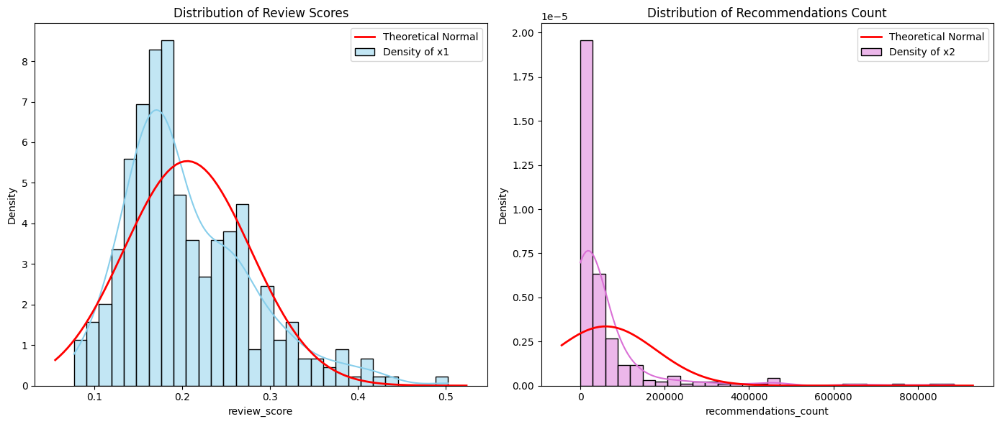

In [39]:
x1 = applications_review_scores['review_score']
x2 = true_recommendations['recommendations_count']

# Set the figure size for the plots
plt.figure(figsize=(14, 6))

# Histogram and theoretical distribution for x1 (review_score)
plt.subplot(1, 2, 1)
sns.histplot(x1, kde=True, stat="density", color='skyblue', bins=30, label="Density of x1")  # Plot the histogram and KDE
mean1, std1 = np.mean(x1), np.std(x1)  # Calculate mean and standard deviation for x1
xmin, xmax = plt.xlim()  # Get the current x-axis limits
x = np.linspace(xmin, xmax, 100)  # Generate x values for the normal distribution
p = stats.norm.pdf(x, mean1, std1)  # Calculate the normal distribution
plt.plot(x, p, 'r', linewidth=2, label="Theoretical Normal")  # Plot the theoretical normal distribution
plt.title('Distribution of Review Scores')  # Title for the first subplot
plt.legend()  # Show legend for the first subplot

# Histogram and theoretical distribution for x2 (recommendations_count)
plt.subplot(1, 2, 2)
sns.histplot(x2, kde=True, stat="density", color='orchid', bins=30, label="Density of x2")  # Plot the histogram and KDE
mean2, std2 = np.mean(x2), np.std(x2)  # Calculate mean and standard deviation for x2
xmin, xmax = plt.xlim()  # Get the current x-axis limits
x = np.linspace(xmin, xmax, 100)  # Generate x values for the normal distribution
p = stats.norm.pdf(x, mean2, std2)  # Calculate the normal distribution
plt.plot(x, p, 'r', linewidth=2, label="Theoretical Normal")  # Plot the theoretical normal distribution
plt.title('Distribution of Recommendations Count')  # Title for the second subplot
plt.legend()  # Show legend for the second subplot

plt.tight_layout()  # Adjust the layout to prevent overlap
plt.show()

##### `review_score` Distribution
The histogram of the `review_score` reveals a significant right skew (positive skewness). This means that there is a high concentration of scores clustered towards the lower end of the scale, while there exists a long tail extending towards higher scores. Such an asymmetry indicates that the majority of reviews receive low helpful vote scores, with only a few reviews achieving much higher scores.

This observed skewness suggests that the `review_score` does not conform to a normal distribution. Typically, a normal distribution would exhibit a symmetrical bell-shaped curve; however, the plotted distribution shows a marked deviation from this pattern. Consequently, the frequency distribution of `review_score` aligns poorly with the theoretical expectations of a normal distribution, reinforcing the notion that it is indeed non-normally distributed.

##### `recommendations_count` Distribution
In a similar vein, the distribution of `recommendations_count` also exhibits a pronounced right skew. Most applications tend to have a low count of recommendations, while only a select few accumulate exceptionally high counts. This asymmetry, like that seen in `review_score`, further indicates that `recommendations_count` is not normally distributed.

Both distributions reflect a common characteristic in many real-world datasets, where extreme values or outliers can significantly influence the distribution shape, leading to skewness.

##### Implications for Correlation Analysis
Given that neither `review_score` nor `recommendations_count` adheres to the assumptions of normality, applying the Pearson correlation coefficient would be inappropriate for analyzing the relationship between these two variables. The Pearson correlation coefficient is designed to measure linear relationships under the assumption that both variables follow a normal distribution. When this assumption is violated, it can result in misleading or inaccurate interpretations of the correlation.

To accurately assess the relationship between `review_score` and `recommendations_count`, we will explore alternative correlation measures that do not rely on the assumption of normality. Specifically, we will consider the Spearman and Kendall correlation coefficients. These methods are based on rank-ordering the data rather than their raw values, making them more robust in the face of non-normal and skewed distributions. Thus, they provide a more reliable approach for understanding the correlation between our variables in this context.

When analyzing the relationship between `review_score` and `recommendations_count` in a dataset consisting of approximately $22$ *million* rows, the choice between the Spearman and Kendall correlation coefficients is significant. Each method has its strengths, particularly in the context of large datasets and non-normal distributions.

- **Spearman Correlation Coefficient:** The Spearman correlation coefficient measures the strength and direction of the monotonic relationship between two variables. It does this by ranking the data and assessing the correlation between these ranks. The advantages of using Spearman include:
 - **Robustness**: Spearman is less sensitive to outliers than Pearson correlation because it relies on ranks rather than actual data values. This can be especially important in a large dataset where extreme values may disproportionately affect the correlation.
 - **Computational Efficiency**: For large datasets, Spearman's correlation can be computed quickly, as it mainly involves sorting the data and calculating rank differences.

Given its efficiency and robustness, Spearman correlation is often favored for larger datasets, especially when the data exhibits skewness or outliers.

- **Kendall Correlation Coefficient:** The Kendall correlation coefficient, also known as Kendall's tau, measures the strength of the relationship between two variables by considering the ordinal ranks. It evaluates how often pairs of observations agree versus disagree. The benefits of using Kendall include:
 - **Interpretability**: Kendall's tau provides a more intuitive understanding of the correlation in terms of the proportion of concordant and discordant pairs.
 - **Sensitivity to Sample Size**: Kendall's tau tends to produce more conservative estimates of correlation strength, which can be beneficial when dealing with large datasets that may have many small effect sizes.

However, Kendall's correlation is generally computationally more intensive than Spearman's, especially as the size of the dataset increases.

Given the size of the dataset (approximately $22$ *million* rows), the **Spearman correlation coefficient** is likely the better choice. Its computational efficiency and robustness to outliers make it well-suited for large, non-normally distributed data. While Kendall's tau offers valuable interpretative insights, the additional computational burden may not be justified in this case.

Thus, we will proceed with the Spearman correlation to analyze the relationship between `review_score` and `recommendations_count` in our dataset.


#### Correlation Analysis

We will assess the relationship between `review_score` and `recommendations_count` using the **Spearman correlation coefficient**, along with its *statistical significance* via the **p-value**.

The computed p-value will test our *null hypothesis (H0)*, which asserts that there is no correlation between `review_score` and `recommendations_count`, indicating that any observed association is due to random variation. We have set the significance level at $0.05$, a standard threshold that balances the risk of *Type I errors (false positives)* while allowing for the detection of meaningful correlations. A p-value below this level will lead us to reject H0, suggesting a statistically significant correlation.

Interpreting the results, a significant correlation would imply that higher review scores may correspond to increased recommendations or vice versa, offering actionable insights for app development and marketing strategies. Conversely, failing to reject H0 would indicate a weak or nonexistent relationship, necessitating a reassessment of our assumptions regarding user engagement.

In [40]:
# Calculate Spearman correlation coefficient and p-value
correlation_coef, correlation_p_value = stats.spearmanr(x1, x2)

# Set significance level
alpha_level = 0.05

# Display the results in a more detailed format
print(f"Spearman correlation coefficient: {correlation_coef:.4f}")
print(f"P-value for testing non-correlation (H0: no correlation): {correlation_p_value:.4f}")

# Determine statistical significance
if correlation_p_value < alpha_level:
    print(f"The result is statistically significant at alpha = {alpha_level}.")
    print("Conclusion: There is sufficient evidence to reject the null hypothesis (H0) of no correlation.")
else:
    print(f"The result is not statistically significant at alpha = {alpha_level}.")
    print("Conclusion: There is insufficient evidence to reject the null hypothesis (H0) of no correlation.")

Spearman correlation coefficient: -0.6255
P-value for testing non-correlation (H0: no correlation): 0.0000
The result is statistically significant at alpha = 0.05.
Conclusion: There is sufficient evidence to reject the null hypothesis (H0) of no correlation.


#### Interpretation of Spearman Correlation Results

The Spearman correlation analysis resulted in a coefficient of **$-0.6259$** and a p-value of **$0.0000$**. These findings offer significant insights into the relationship between `review_score` and `recommendations_count`.

1. **Spearman Correlation Coefficient**:
   - The calculated Spearman correlation coefficient of **$-0.6259$** indicates a **moderate to strong negative correlation** between `review_score` and `recommendations_count`. This suggests that, generally, as the `review_score` increases, the `recommendations_count` tends to decrease.
   - The magnitude of this coefficient implies that the relationship is not trivial; a coefficient of this size often reflects meaningful behavioral trends. Specifically, it indicates that higher-rated apps may not be favored in terms of recommendations, potentially pointing to an inverse relationship in user preferences or marketing strategies.

2. **Statistical Significance**:
   - The p-value of **$0.0000$**, being much less than the significance threshold of **$0.05$**, leads us to confidently **reject the null hypothesis (*H0*)**, which posited that there is no correlation between the two variables.
   - This *near-zero p-value* indicates **very strong evidence against *H0***, suggesting that the correlation observed is not a result of random variation but rather reflects a systematic relationship within our dataset of approximately $22$ *million* records.

3. **User Engagement and Market Dynamics**:
   - The significant negative correlation raises several critical considerations:
     - **User Engagement Dynamics**: It may indicate that higher review scores do not guarantee increased visibility or recommendations, challenging the assumption that better-reviewed apps are more likely to be recommended. This could be due to a variety of factors, including algorithmic biases in recommendation systems, where apps with lower scores might receive more attention due to trending status or other promotional activities.
     - **Market Behavior**: There could be external factors influencing these metrics, such as market saturation, where well-rated apps are overshadowed by a large number of alternatives, leading to fewer recommendations despite high ratings.
     - **Target Audience Expectations**: Users may have differing expectations based on the scores, and the nature of the recommendations may lead users towards apps with lower scores but higher engagement metrics (e.g., active user base or innovative features).

4. **Future Research Directions**:
   - While this analysis shows a significant correlation, it is essential to remember that correlation does not imply causation. To fully understand the dynamics at play, further investigation is needed. Potential avenues for further research could include:
     - **Multivariate Analysis**: Exploring additional variables such as app age, marketing spend, user demographics, or specific app categories to understand their influence on both `review_score` and `recommendations_count`.
     - **Causal Relationships**: Conducting experiments or using longitudinal data to investigate whether changes in `review_score` lead to changes in `recommendations_count`, or vice versa.
     - **Qualitative Insights**: Gathering user feedback or qualitative data on why certain apps are recommended over others, despite their review scores.

In conclusion, the Spearman correlation analysis reveals a noteworthy and statistically significant negative relationship between `review_score` and `recommendations_count`. This finding not only prompts a reevaluation of assumptions about user engagement but also encourages a deeper investigation into the underlying mechanisms affecting these metrics in the app ecosystem.

# Research Question 3

<h2 style="display: inline;">[RQ 3]</h2><span style="font-size: 18px; font-style: italic;">

*Understanding when users are most active in submitting reviews can help identify peak engagement periods.*
   - Plot the number of reviews submitted each month and describe any trends.

   - Identify any seasonal patterns or trends in review activity. Explain any seasonal impact you notice.

   - Determine if certain times of the year have higher engagement rates. Describe noticeable peaks in user activity.

   - What is the most common time of day users write reviews? For example, users might typically write reviews at 17:44. Explain how this time distribution could influence your analysis.

   - Create a function that accepts a list of time intervals and plots the number of reviews for each interval.
   
   - Use the function to plot the number of reviews for the following time intervals:

| Initial Time | Final Time |
|--------------|------------|
| 00:00:00     | 02:59:59   |
| 03:00:00     | 05:59:59   |
| 06:00:00     | 10:59:59   |
| 11:00:00     | 13:59:59   |
| 14:00:00     | 16:59:59   |
| 17:00:00     | 19:59:59   |
| 20:00:00     | 23:59:59   |

   - Summarize your findings from the time interval analysis.
</span>

- We start with setting the style of the plots. Then, we extract the year and month information from the `timestamp_created` column.

In [41]:
# Set the style of the plots
sns.set_theme(style="ticks", palette="muted", context="notebook")

In [43]:
# Extract Year and Month from the transformed 'timestamp_created' column
df['year_month'] = df['datetime_created'].dt.to_period('M')

# Grouping by year-month to count reviews submitted each month
monthly_reviews = df.groupby('year_month').size()

- Now we plot the number of reviews submitted for each month.

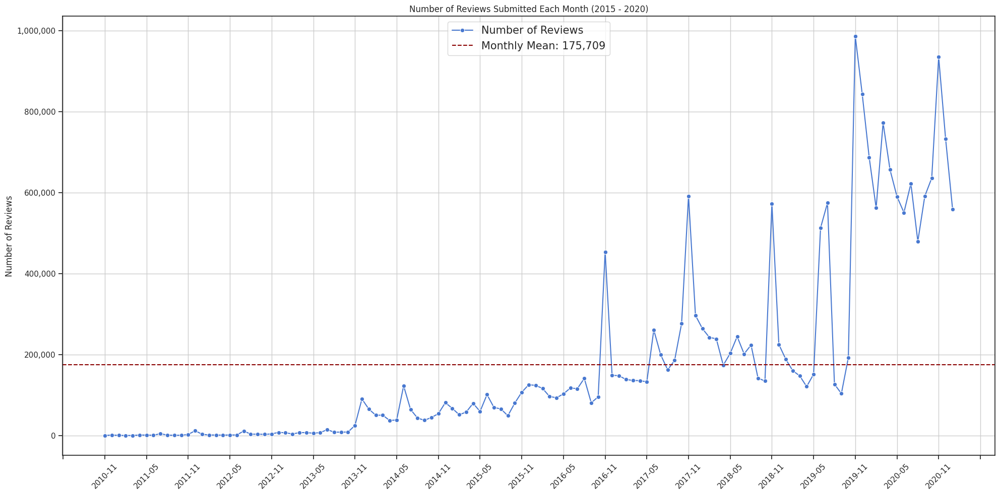


Summary Statistics of Monthly Reviews:
count       123.00
mean     175709.38
std      227626.98
min         555.00
25%        8841.00
50%       96892.00
75%      200823.00
max      986433.00
dtype: float64
Month with the most reviews: 2019-11
Month with the least reviews: 2010-11


In [44]:
plt.figure(figsize=(20, 10))

monthly_reviews_df = monthly_reviews.reset_index(name='count')  # Convert to DataFrame
monthly_reviews_df['year_month'] = monthly_reviews_df['year_month'].astype(str)  # Convert to string
mean_reviews = monthly_reviews_df['count'].mean()  # Calculate the mean number of reviews

sns.lineplot(data=monthly_reviews_df, x='year_month', y='count' ,marker='o',label='Number of Reviews')
plt.axhline(y=mean_reviews, color='darkred', linestyle='--', label=f'Monthly Mean: {mean_reviews:,.0f}')  # Adding the mean line in a proper format
plt.title('Number of Reviews Submitted Each Month (2015 - 2020)')
plt.xlabel('')
plt.ylabel('Number of Reviews')
plt.xticks(rotation=45)

# Set the major ticks locator to show every 6 months
plt.gca().xaxis.set_major_locator(plt.MultipleLocator(6))

# Improve the format of the y-axis
plt.gca().yaxis.set_major_formatter(mtick.FuncFormatter(lambda x, _: '{:,.0f}'.format(x)))

# Add a grid
plt.grid()
plt.tight_layout()

# Set the legend
plt.legend(loc='upper center', prop={'size': 15})

plt.show()

# Describe the monthly reviews
month_reviews_table = monthly_reviews.describe()
# Improve the table by rounding the values
month_reviews_table = month_reviews_table.round(2)
print("\nSummary Statistics of Monthly Reviews:")
print(month_reviews_table)

# Get the month with the most reviews and least reviews
max_month = monthly_reviews.idxmax()
min_month = monthly_reviews.idxmin()
mean_reviews = monthly_reviews.mean()
print(f'Month with the most reviews: {max_month}')
print(f'Month with the least reviews: {min_month}')

The line plot shows the number of reviews submitted each month from 2015 to 2020. The data points are marked to highlight each month’s review count clearly. Additionally, we add a horizontal dashed line representing the mean number of monthly reviews, which helps in identifying periods with above-average or below-average review activity.

- There appears to be an overall increase in the number of reviews submitted over the years, especially from 2015 onwards. This could indicate growing popularity and engagement with the platform or an increase in the number of users and games. We can notice consistent peaks around the end of the year, particularly in November and December. One possible explanation could be that during these months *Steam Autumn Sale* and *Winter Sale* take place. Such events typically encourage higher user engagement, leading to an increase in reviews. For example, in November 2019, the number of submitted reviews was more than 5 times greater than the mean value.

- After Christmas holidays there is a noticeable reduction in the following months, users might take a break after the holiday season. The number of submitted reviews generally restarts to increase around May with mid-year peaks in June and July. This can be linked to the *Steam Summer Sale*. These local maxima can also be associated to the common game releases during this period. Most of the sharp peaks are well above the mean, indicating that they are not just random variations but likely related to specific factors or seasonal influences.

- Since user engagement is highest during Winter and Summer, the company can leverage this information by strategically planning updates, promotions and discounts.

---

- Now we analyze during which season the steam reviews were submitted.

In [45]:
def get_season(month: int) -> str:
    """
    Determine the season for a given month.

    Parameters:
    ----------
    month : int
        The month as an integer, where 1 = January, 2 = February, ..., 12 = December.

    Returns:
    -------
    str
        The season corresponding to the provided month, as one of
        'Winter', 'Spring', 'Summer', or 'Fall'.

    Notes:
    ------
    - The function assigns months to seasons based on the following rules:
        - Winter: December (12), January (1), February (2)
        - Spring: March (3), April (4), May (5)
        - Summer: June (6), July (7), August (8)
        - Fall: September (9), October (10), November (11)
    - This approach is based on meteorological seasons, where seasons are divided evenly into three months each.

    Example:
    -------
    >>> get_season(5)
    'Spring'
    >>> get_season(12)
    'Winter'
    """
    if month in [12, 1, 2]:
        return 'Winter'
    elif month in [3, 4, 5]:
        return 'Spring'
    elif month in [6, 7, 8]:
        return 'Summer'
    else:
        return 'Fall'

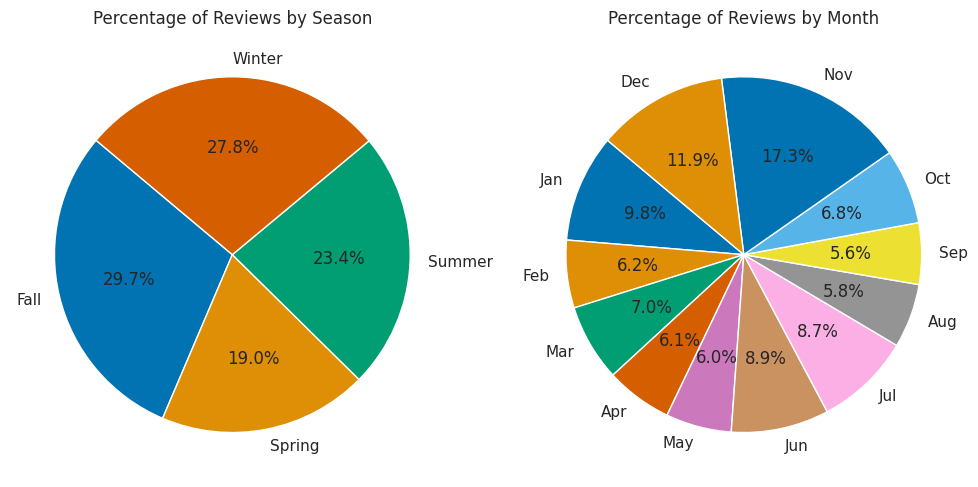

In [48]:
# Get the number of reviews per season
seasonal_reviews = df.groupby(df['datetime_created'].dt.month.apply(get_season),observed=False).size()
# Calculate the mean number of reviews per season
mean_s_reviews = seasonal_reviews.mean()
# Pie chart of reviews by season
plt.figure(figsize=(10, 6))
plt.subplot(1, 2, 1)
plt.pie(seasonal_reviews, labels=seasonal_reviews.index, autopct='%1.1f%%', startangle=140,
        colors=sns.color_palette("colorblind")) # This ensures that the colors are colorblind-friendly
plt.title('Percentage of Reviews by Season')


# Group by month
monthly_reviews = df.groupby(df['datetime_created'].dt.month).size()

# Display the month name
monthly_reviews.index = monthly_reviews.index.map(lambda x: calendar.month_abbr[x])

# Plot the number of reviews per month with a pie chart
plt.subplot(1, 2, 2)
plt.pie(monthly_reviews, labels=monthly_reviews.index, autopct='%1.1f%%', startangle=140, colors=sns.color_palette("colorblind"))
plt.title('Percentage of Reviews by Month')
plt.tight_layout()
plt.show()

-  The pie chart on the left displays the distribution of reviews submitted by season while the pie chart on the right breaks down review submissions by individual month. The `colorblind`palette is used to ensure a better visualization for everybody. The highest engagement periods for review submissions are in Fall (particularly November) and Winter (December). This trend suggests that users are more active in providing reviews during holiday periods and in cooler months. Again, understanding these trends can help the company schedule updates, new releases, or marketing campaigns during high engagement periods. By timing these efforts with high-activity months, the company can maximize user interaction and review collection.

### What is the most common time of day users write reviews? For example, users might typically write reviews at 17:44. Explain how this time distribution could influence your analysis.Create a function that accepts a list of time intervals and plots the number of reviews for each interval. Use the function to plot the number of reviews for the following time intervals:

- We decide to round review submission times to 30-minute intervals in order to provide a balance between data precision and usability. It allows us to perform a more interpretable, task-focused and computationally efficient analysis. For example, distinguishing between two reviews submitted at 12:09 and 12:13 would not help us evaluating user behavior. Through our approach both times are rounded down to 12:00, making the analysis less complex.

In [49]:
# Round the timestamp_created column to the nearest half-hour
df['hour_minute'] = df['datetime_created'].dt.floor('30min').dt.strftime('%H:%M')

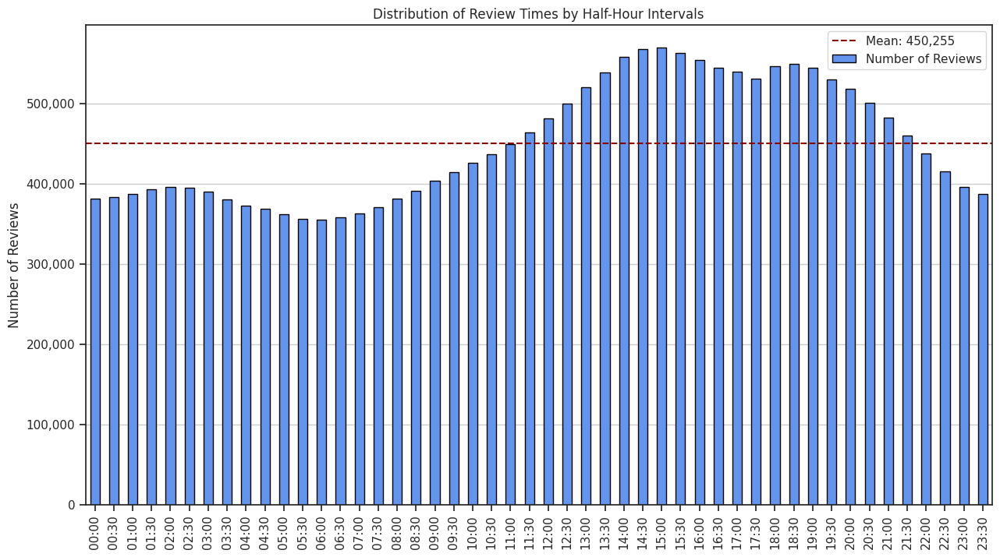

,proportion
hour_minute,
15:00,2.64%
14:30,2.63%
15:30,2.6%
14:00,2.58%
16:00,2.56%


In [50]:
# Plot the distribution of review times by half-hour intervals in chronological order
plt.figure(figsize=(15, 8))
df['hour_minute'].value_counts().sort_index().plot(kind='bar', color='cornflowerblue', label='Number of Reviews',edgecolor='black',linewidth=1)
plt.xticks(rotation=90)
plt.title('Distribution of Review Times by Half-Hour Intervals')
plt.ylabel('Number of Reviews')
plt.xlabel('')
plt.grid(axis='y')
# Adding the mean line
mean_reviews = df['hour_minute'].value_counts().mean()

plt.axhline(y=mean_reviews, color='darkred', linestyle='--', label=f'Mean: {mean_reviews:,.0f}')
# Readable format for the y-axis
plt.gca().yaxis.set_major_formatter(mtick.FuncFormatter(lambda x, _: '{:,.0f}'.format(x)))
# Adding the legend
plt.legend(loc='upper right')
plt.show()

# Compute the percentage of reviews in each half-hour interval for the top 5 most common intervals
# Add the percentage symbol to the values and round to 2 decimal places
top_5_intervals = df['hour_minute'].value_counts().head(5).index
percentage_reviews = df['hour_minute'].value_counts(normalize=True).loc[top_5_intervals] * 100
percentage_reviews = percentage_reviews.round(2).astype(str) + '%'
percentage_reviews

- The chart illustrates the distribution of review submissions by half-hour intervals throughout the day. Each bar indicates the number of reviews submitted in a specific 30-minute interval. The highest number of reviews is submitted between 2:00 PM and 4:00 PM. This suggests that gamers are most active during the early afternoon. As expected, users are least active during 03:00 - 05:00 AM. This reduction in review submissions reasonably describes natural cycles of the day. Understanding this cycle can provide insights into when users are most active, *Steam* can leverage this information by proposing review requests or promotional banners. The time when the review was submitted might influence the sentiment of reviews. For example, reviews submitted during high engagement periods might reflect different sentiment patterns than those submitted late at night. By considering this distribution, analysts are able to control for potential time-based biases in sentiment analysis.

### - Create a function that accepts a list of time intervals and plots the number of reviews for each interval.
   - Use the function to plot the number of reviews for the following time intervals:

| Initial Time | Final Time |
|--------------|------------|
| 00:00:00     | 02:59:59   |
| 03:00:00     | 05:59:59   |
| 06:00:00     | 10:59:59   |
| 11:00:00     | 13:59:59   |
| 14:00:00     | 16:59:59   |
| 17:00:00     | 19:59:59   |
| 20:00:00     | 23:59:59   |

   - Summarize your findings from the time interval analysis.

In [53]:
def plot_time_intervals(time_intervals: list) -> dict:
    """
    Plot the number of reviews for each specified time interval and return counts.

    Parameters:
    ----------
    time_intervals : list of tuples
        A list of tuples where each tuple represents a time interval.
        Each tuple contains two strings: the start and end times in 'HH:MM:SS' format.

    Returns:
    -------
    dict
        A dictionary with each time interval as a key (formatted as 'start - end')
        and the corresponding count of reviews as the value.

    Example:
    -------
    >>> plot_time_intervals([("00:00:00", "02:59:59"), ("03:00:00", "05:59:59")])

    - This will plot the number of reviews within each specified time interval.
    - It also returns a dictionary with the review counts for each interval.

    Notes:
    ------
    - Converts time intervals to `datetime.time` objects for efficient comparison.
    - Uses a single loop to apply boolean masks to the DataFrame for each interval,
      avoiding repeated filtering operations for improved performance.
    - The plot displays each time interval on the x-axis with corresponding review counts,
      and an average line is added to highlight the mean number of reviews.
    - The y-axis format is adjusted for readability, displaying review counts with commas.

    Plot Style:
    -----------
    - The plot uses Seaborn's 'colorblind' palette for accessibility.
    - An average line (in red) is added to indicate the mean review count across intervals.

    """
    # Convert time intervals to datetime.time objects outside the loop for efficiency
    interval_times = [(pd.to_datetime(start).time(), pd.to_datetime(end).time()) for start, end in time_intervals]
    interval_counts = {}
    import matplotlib.ticker as mtick
    import seaborn as sns
    import matplotlib.pyplot as plt
    # Use a single loop to create boolean masks and count reviews in each interval
    for (start, end), label in zip(interval_times, [f'{start} - {end}' for start, end in time_intervals]):
        interval_mask = (df['datetime_created'].dt.time >= start) & (df['datetime_created'].dt.time <= end)
        interval_counts[label] = interval_mask.sum()  # Faster to sum the boolean mask than filtering the DataFrame

    # Plotting the number of reviews for each interval
    plt.figure(figsize=(16, 8))
    sns.barplot(x=list(interval_counts.keys()), y=list(interval_counts.values()), palette='colorblind', hue=list(interval_counts.keys()),
                legend=False, edgecolor='black', linewidth=1)
    plt.title('Number of Reviews by Time Interval')
    plt.xlabel('Time Intervals')
    plt.ylabel('Number of Reviews')
    plt.gca().yaxis.set_major_formatter(mtick.FuncFormatter(lambda x, _: '{:,.0f}'.format(x)))
    plt.xticks(rotation=45)

    # Adding the mean line
    mean_reviews = sum(interval_counts.values()) / len(interval_counts)
    plt.axhline(y=mean_reviews, color='darkred', linestyle='--', label=f'Mean: {mean_reviews:,.0f}')
    plt.legend(loc='upper right')
    plt.tight_layout()
    plt.show()

    return interval_counts

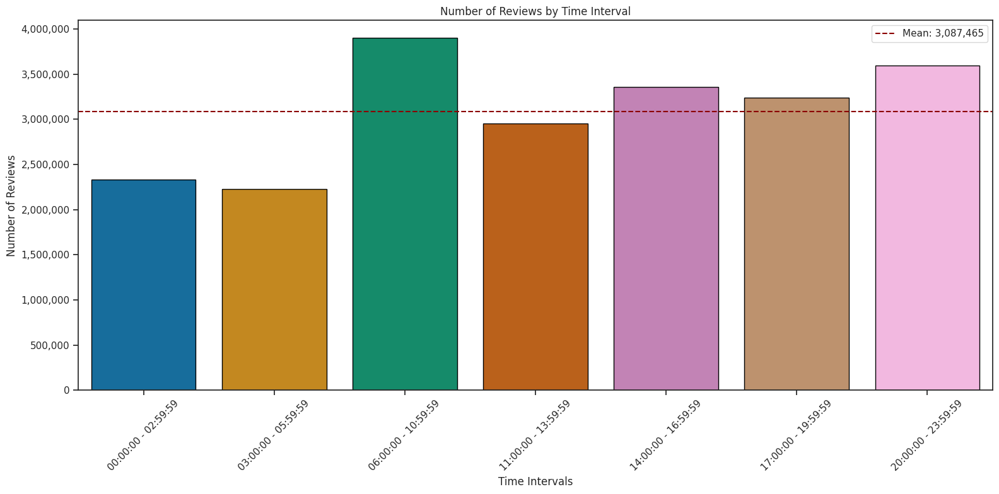

{'00:00:00 - 02:59:59': 2335400,
 '03:00:00 - 05:59:59': 2229359,
 '06:00:00 - 10:59:59': 3900393,
 '11:00:00 - 13:59:59': 2953857,
 '14:00:00 - 16:59:59': 3356934,
 '17:00:00 - 19:59:59': 3239952,
 '20:00:00 - 23:59:59': 3596359}

In [54]:
# Define the time intervals
time_intervals = [
    ('00:00:00', '02:59:59'),
    ('03:00:00', '05:59:59'),
    ('06:00:00', '10:59:59'),
    ('11:00:00', '13:59:59'),
    ('14:00:00', '16:59:59'),
    ('17:00:00', '19:59:59'),
    ('20:00:00', '23:59:59')
]

# Plot time intervals
plot_time_intervals(time_intervals)

- The bar chart displays the frequency of review submissions for each time interval, the frequency is represented by the height of the bars. The intervals with most reviews are `06:00:00 - 10:59:59` and `20:00:00 - 23:59:59`. However, the width of these time ranges must be considered. As the previous analysis showed, the densest interval is the one `14:00:00 - 16:59:59`. Finally, the bar chart shows that there is a low activity overnight: review submissions drop significantly in the early morning hours (`00:00 - 05:59`), which aligns with typical user inactivity during sleeping hours. We have the same results from our previous analysis: the company can time the review notifications by leveraging the information on user engagement.

# Research Question 4

<h2 style="display: inline;">[RQ 4]</h2><span style="font-size: 18px; font-style: italic;">

*Investigating whether users who spend more time using an application give higher or lower ratings.*

   - Analyze the relationship between the amount of time a user has spent on an application and their review score.

   - Do more experienced users (who have used the application longer) tend to give higher or lower ratings? Comment on any trends you observe.

   - Plot the distribution of review scores based on different user experience levels (e.g., new users vs. veteran users). Is there a statistical difference in the score distributions? Use an appropriate statistical test to validate your hypothesis.
   
   - Ask an LLM tool (ChatGPT, Claude AI, etc.) to interpret the statistical results of the analysis and provide potential explanations for the trends. Does the LLM suggest additional factors that could explain why users who spend more time on the app give higher or lower ratings? How can you validate the interpretations provided by the LLM?
</span>

- First of all, we check if there are any missing values in the features of interest.

In [55]:
# columns with missing values and the number of missing values
missing_values = df.isnull().sum()
missing_values = missing_values[missing_values > 0]
print("\nColumns with Missing Values:")
print(missing_values)


Columns with Missing Values:
review                            33574
author.playtime_forever               2
author.playtime_last_two_weeks        2
author.playtime_at_review         25654
author.last_played                    2
author.last_played_datetime           2
dtype: int64


- Since the number of missing values in time spent on the application at review is minimal, we can opt to remove these rows from the analysis (*listwise deletion*). We ensure that only complete data is used and avoids introducing any assumptions. Therefore, this removal will not influence our analysis. Finally, we create a copy of the DataFrame to retain the original data, enhancing reproducibility and debugging.

In [56]:
df_new = df.dropna(subset=['author.playtime_at_review', 'recommended']).loc[:,:] # Remove missing values, .loc[:,:] is used to avoid the SettingWithCopyWarning

In [57]:
# Convert the time spent on reviews from minutes to hours
df_new['time_spent_h'] = df_new['author.playtime_at_review'] / 60

- We define the score (rating) of a review with a binary variable (0 for negative review and 1 for positive review), this binary variable is based on the *recommended* feature available. This is due to the fact that we believe that the `recommended` feature is the only one linked to the rating of the review among the features available.

In [58]:
# Get a numeric binary column for the review score
df_new['review_score'] = df_new['recommended'].astype(int)

In [59]:
# Divide the time spent on reviews into bins
df_new['bins-time'] = pd.cut(df_new['time_spent_h'],
                             bins=[0, 10, 40, 80,150,
                            df_new['time_spent_h'].max()],
                            labels=['[0-10]', '(10-40]', '(40-80]', '(80-150]', '150+'])  # right closed intervals
bin_counts = df_new['bins-time'].value_counts().sort_index()

- We consider five different time bins to analyze the amount of time played at the time of review by users.

bins-time
[0-10]      85.337765
(10-40]     91.126784
(40-80]     90.164544
(80-150]    88.613509
150+        82.507117
Name: positive_percentage, dtype: float64


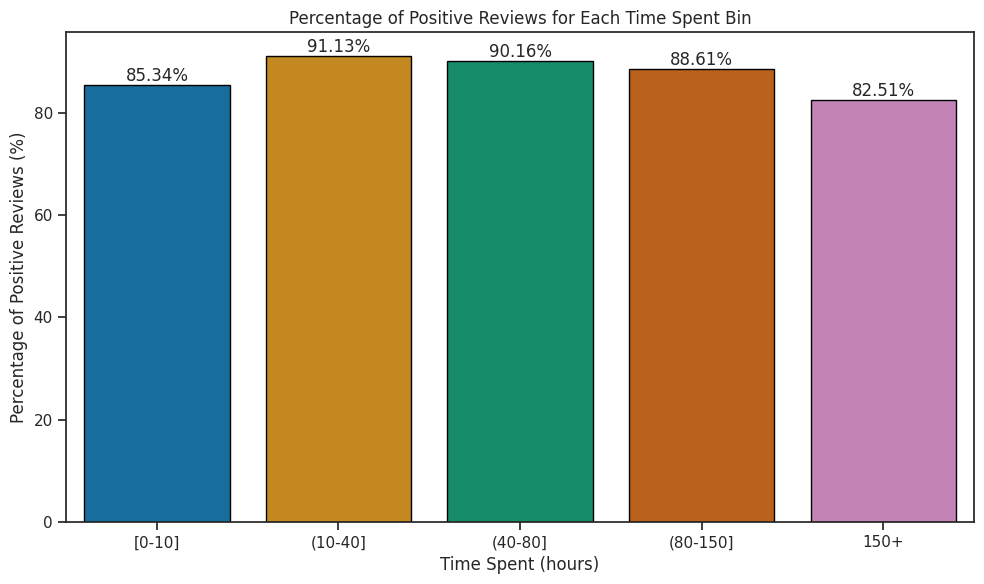

In [60]:
# Compute the mean of positive reviews for each time spent bin
df_new['positive_percentage'] = df_new['review_score'] * 100
bin_means = df_new.groupby('bins-time',observed=False)['positive_percentage'].mean()
print(bin_means)
# Barplot of the mean of positive reviews for each time bin, use seaborn
plt.figure(figsize=(10, 6))
plt.title('Percentage of Positive Reviews for Each Time Spent Bin')
sns.barplot(x=bin_means.index, y=bin_means.values, hue = bin_means.index,palette="colorblind",label='Percentage of Positive Reviews',edgecolor='black',linewidth=1)
# Annotate the bars with the exact percentage value
for i, mean in enumerate(bin_means):
    plt.text(i, mean, f'{mean:.2f}%', ha='center', va='bottom')
plt.xticks(rotation=0)
plt.xlabel('Time Spent (hours)')
plt.ylabel('Percentage of Positive Reviews (%)')
plt.tight_layout()
plt.show()

- The bar chart shows how the percentage of positive reviews changes based on how long users have spent on the app.

- Users with 10-40 hours on the app: This group has the highest percentage of positive reviews (`91.13%`), followed closely by users with 40-80 hours (`90.16%`). It seems that people who have used the app for a moderate amount of time tend to be the happiest. They’ve spent enough time to get familiar with it but maybe not long enough to run into too many issues.

- Users with 0-10 hours: People who are new to the app (0-10 hours) give slightly fewer positive reviews (`85.34%`). This could be because they are still figuring things out and might feel some frustration or find that the app does not meet their initial expectations.

- Users with 150+ hours: For people who have spent over 150 hours, the percentage of positive reviews drops further (`82.51%`). This suggests that long-term users may be more critical, possibly because they’ve encountered more limitations or issues over time.

In [61]:
# Summary statistics for the time spent on reviews based on positive and negative reviews
positive_time_stats = df_new[df_new['review_score'] == 1]['time_spent_h'].describe()
negative_time_stats = df_new[df_new['review_score'] == 0]['time_spent_h'].describe()
time_stats = pd.concat([positive_time_stats, negative_time_stats], axis=1)
time_stats.columns = ['Positive Reviews', 'Negative Reviews']
time_stats.loc['coeff_var'] = time_stats.loc['std'] / time_stats.loc['mean'] * 100
time_stats = round(time_stats, 2)
print("\nSummary Statistics for Time Spent on Reviews Based on Review Score:")
print(time_stats)


Summary Statistics for Time Spent on Reviews Based on Review Score:
           Positive Reviews  Negative Reviews
count           18870665.00        2715935.00
mean                 139.49            202.54
std                  388.95            460.65
min                    0.02              0.02
25%                    9.65              6.37
50%                   30.83             37.30
75%                  107.02            194.83
max                53801.72          37715.55
coeff_var            278.83            227.44


- Users who leave negative reviews tend to spend more time on the app, which could indicate that prolonged exposure might lead to frustration or higher expectations that are unmet. Both positive and negative review distributions are right-skewed, meaning a small group of users spends an exceptionally high amount of time on the app, which may disproportionately impact the average time spent. The larger IQR and standard deviation for negative reviews suggest that users who leave negative feedback have more diverse time-spent patterns, possibly due to varying reasons for dissatisfaction. Users with moderate engagement tend to leave positive reviews, while prolonged use is associated with higher criticism. This could suggest areas for improvement to maintain satisfaction among long-term users.

---

### Plot the distribution of review scores based on different user experience levels (e.g., new users vs. veteran users). Is there a statistical difference in the score distributions? Use an appropriate statistical test to validate your hypothesis.

- We distinguish between two groups of users: `Novice` and `Veteran` gamers. We define the two levels by considering the amount of time spent on the application by the user, as we believe that is a true indicator of the user experience. By using the 75th percentile as the threshold, we are defining `Veteran` users as those who fall within the top 25% of time spent on the application. Using a statistical measure like the third quartile avoids arbitrary definitions (e.g., choosing a fixed number of hours) and instead relies on the distribution of the data.

In [62]:
# Define the threshold as the 75th percentile of the time spent on the application
threshold = df_new['time_spent_h'].quantile(0.75)
# Define user experience: Veteran if the time spent on the application is greater than the threshold otherwise Novice
df_new['user_experience'] = np.where(df_new['time_spent_h'] >= threshold, 'Veteran', 'Novice')

In [63]:
# Compute the percentage of positive reviews for each user experience group
vet_percentage = df_new[df_new['user_experience'] == 'Veteran']['review_score'].value_counts(normalize=True)
nov_percentage = df_new[df_new['user_experience'] == 'Novice']['review_score'].value_counts(normalize=True)

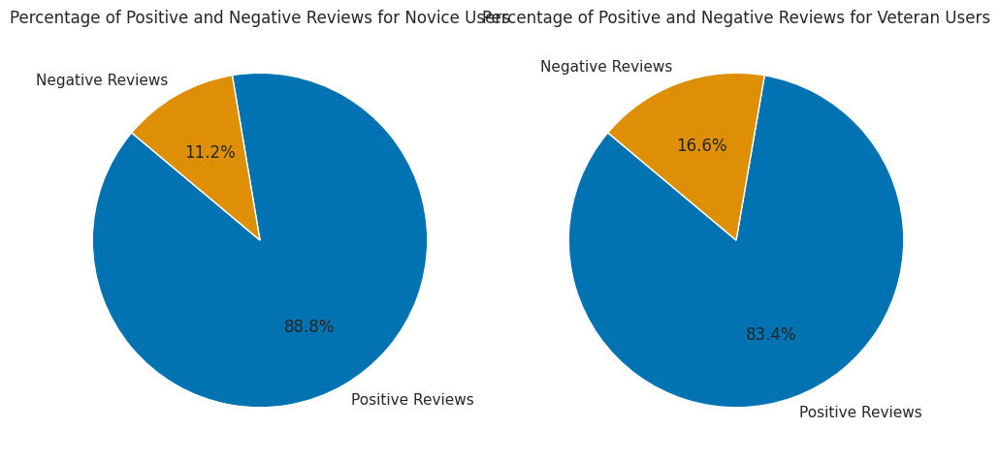

In [64]:
# Plot pie chart for veteran users
# The pie chart displays the percentage of positive reviews

plt.figure(figsize=(10, 6))
plt.subplot(1, 2, 1)
plt.pie(nov_percentage,
        labels=['Positive Reviews', 'Negative Reviews'], autopct='%1.1f%%', startangle=140, colors=sns.color_palette("colorblind"))
plt.title('Percentage of Positive and Negative Reviews for Novice Users')


plt.subplot(1, 2, 2)
plt.pie(vet_percentage,
        labels=['Positive Reviews', 'Negative Reviews'], autopct='%1.1f%%', startangle=140, colors=sns.color_palette("colorblind"))
plt.title('Percentage of Positive and Negative Reviews for Veteran Users')
plt.ylabel('')

plt.tight_layout()
plt.show()

- This side-by-side pie chart compares the percentage of positive and negative reviews given by two groups of users: Novice Users and Veteran Users. Novice Users (`88.8%` positive reviews) generally have a more favorable impression of the app than Veteran Users (`83.4%` positive reviews). It follows that users with less experience tend to submit more positive reviews when compared with more expert users. Novice users often start with a positive impression, which may be influenced by the novelty of the app or the excitement of exploring new features. As users spend more time on the app, they may become more aware of its limitations or areas that could be improved, leading to a gradual increase in negative reviews among veteran users. Now, this difference could be due to randomness or could be a statistically significant difference. We implement a test of hypotheses to answer the question.

---

**We implement a `Z-test`**.

The **Z-test for proportions** is a statistical test used to determine if there is a significant difference between the proportions of two independent groups. It is commonly applied when comparing two binary (yes/no, success/failure) outcomes, such as the proportion of positive reviews between two user groups (e.g., novice vs. veteran users).
It relies on the following assumptions:

- **The data is binary**.
    - The outcomes we are analyzing are binary. Thus, this condition is met. In particular, we assume that the data consists of observations from two Bernoulli distributions.

- **The two samples are independent**.
    - We have two distinct groups, `novice users` and `veteran users`,  where each group’s reviews are independent of the other. In other words, the two Bernoulli distributions are indipendent.

- **The samples are random**.
    - Although Steam reviews are not strictly a random sample due to the self-selection of reviewers, the large and diverse user base, continuous data collection, and balanced representation of different user experiences help approximate a random sample. Thus, while acknowledging some limitations, we can reasonably assume that the reviews reflect a representative sample of user opinions for the purposes of our analysis. This means that the observations are identically and indipendently distributed (*iid*).

- **The sample sizes are large enough to ensure normality**.
    - This condition is satisfied as given the large volume of reviews on Steam, it is reasonable to assume that the sample sizes for both novice and veteran users are sufficiently large to meet the requirements of the Z-test. Therefore, we can confidently apply the Z-test to determine if there is a statistically significant difference in proportions of positive reviews between the two user groups. This assumption allows us to apply the `Central Limit Theorem`.

In [65]:
# Count the number of positive reviews for each user experience group
# and the total number of reviews for each group
# The number of successes in each group is the sum of positive reviews (review_score = 1)
# The total number of reviews in each group is the count of reviews for each user experience

vet_successes = df_new[df_new['user_experience'] == 'Veteran']['review_score'].sum()
nov_successes = df_new[df_new['user_experience'] == 'Novice']['review_score'].sum()
vet_total = df_new['user_experience'].value_counts()['Veteran']
nov_total = df_new['user_experience'].value_counts()['Novice']
counts = np.array([vet_successes, nov_successes]) # Number of successes in each group
nobs = np.array([vet_total, nov_total]) # Number of observations in each group

In [66]:
# Perform the Z-test
stat, pval = proportions_ztest(counts, nobs)
# Set the significance level
alpha = 0.001
print(f"Z-test statistic: {stat:.2f}")
print(f"P-value: {pval:.4f}")
# Compare the p-value to the significance level
if pval < alpha:
    print("The difference in proportions of positive reviews is statistically significant")
else:
    print("The difference in proportions of positive reviews is not statistically significant")

Z-test statistic: -324.72
P-value: 0.0000
The difference in proportions of positive reviews is statistically significant


### Ask an LLM tool (ChatGPT, Claude AI, etc.) to interpret the statistical results of the analysis and provide potential explanations for the trends. Does the LLM suggest additional factors that could explain why users who spend more time on the app give higher or lower ratings? How can you validate the interpretations provided by the LLM?

### Interpretation of Statistical Results

The Z-test results show:
- **Z-test statistic**: -324.72
- **P-value**: 0.0000

Since the p-value is significantly lower than the significance level (α = 0.001), we reject the null hypothesis. This indicates a statistically significant difference in the proportions of positive reviews between novice and veteran users.

### Potential Explanations for the Trends

Based on the statistically significant difference in positive review proportions between novice and veteran users, here are some potential explanations for why this difference might exist:

1. **Familiarity and Experience Effects**:
   - **Novice users** may start with a more positive outlook, reflecting initial excitement and the novelty of using the app. Their limited experience may prevent them from encountering limitations or frustrations that could lead to lower ratings.
   - **Veteran users**, who have spent more time on the app, may become more critical as they notice issues or limitations with prolonged use. This familiarity with the app might also lead to higher expectations that, if unmet, could result in more negative reviews. More experienced users may use more advanced features or encounter less-common aspects of the app that affect their satisfaction.

2. **Satisfaction Plateau**:
   - Veteran users may have already derived the maximum value or novelty from the app, and their satisfaction could plateau or decline over time. This phenomenon might contribute to lower positive review proportions among more experienced users.

3. **Selection Bias**:
   - There may be a selection effect where users who remain long-term (veterans) are more critical or have specific preferences that make them harder to satisfy, compared to newer users who might churn early if they’re dissatisfied.

4. **Update or Feature Fatigue**:
   - Veteran users are more likely to experience multiple app updates or feature changes. If they feel that updates are not meeting their needs or are detracting from the experience, this could lead to a lower proportion of positive reviews.

---

To validate these interpretations, we can use a combination of quantitative and qualitative analyses to examine whether the proposed explanations hold true.

---

### 1. **Familiarity and Experience Effects**

**Validation Methods**:
   - **Feature Usage Analysis**:
      - Analyze feature usage patterns for novice and veteran users. Identify if veteran users engage more with advanced features or areas of the app that might not be commonly used by novices. If advanced or less-common features correlate with lower satisfaction, this could support the idea that familiarity exposes users to more potential frustrations.
   - **Sentiment Analysis Over Time**:
      - Track changes in sentiment within reviews as users move from novice to veteran status. If sentiment decreases over time, this could indicate that increased familiarity brings out more critical feedback. Natural Language Processing (NLP) tools can be used to identify trends in user sentiment across different stages of experience.
   - **Survey or Feedback Collection**:
      - Collect feedback from users at different experience levels, asking about specific frustrations or unmet expectations as they become more familiar with the app. This can provide qualitative insights into whether familiarity impacts their perceptions.

---

### 2. **Satisfaction Plateau**

**Validation Methods**:
   - **Longitudinal Review Score Analysis**:
      - Examine the review scores for individual users over time. If users’ ratings stabilize or decline after a certain period, it could indicate a satisfaction plateau. Comparing the ratings of veteran users to their initial review scores can provide insight into this trend.
   - **Churn Analysis**:
      - Identify if users are more likely to stop using the app after a certain point. If user churn increases after a period of extensive use, it could suggest that satisfaction plateaus or declines, leading users to lose interest.
   - **Cohort Analysis**:
      - Divide users into cohorts based on when they joined or started using the app. Track satisfaction trends within each cohort over time to see if satisfaction plateaus after a certain usage duration or experience level.

---

### 3. **Selection Bias**

**Validation Methods**:
   - **Comparison of Long-Term vs. Short-Term Users**:
      - Compare characteristics of long-term users (veterans) with those of short-term users who churn early. If veterans have higher standards or specific preferences, this could explain the selection bias.
   - **Survey Users on Retention Motivations**:
      - Conduct a survey to understand why some users remain on the app long-term while others leave. If long-term users cite higher standards or specific needs, this could support the hypothesis that veteran users are harder to satisfy.
   - **Propensity Score Matching**:
      - Use propensity score matching to compare novice users with similar profiles to veterans. This technique can help determine if selection bias impacts satisfaction, by controlling for potential confounding factors.

---

### 4. **Update or Feature Fatigue**

**Validation Methods**:
   - **Correlation with App Updates**:
      - Analyze review scores and sentiment around the time of major app updates. If negative feedback spikes after updates, this could indicate feature fatigue or dissatisfaction with changes.
   - **Time-Series Analysis of Review Sentiment**:
      - Conduct a time-series analysis of review sentiment, noting any dips in satisfaction following significant updates. This can help determine if updates or feature changes correlate with increased negative reviews among veteran users.
   - **In-Depth User Interviews**:
      - Conduct interviews with veteran users to gather qualitative feedback on how they perceive updates and feature changes. This can provide insights into whether they feel fatigued or frustrated with frequent updates or changes that disrupt their experience.

---

### Summary of Validation Approaches

Each proposed explanation can be validated through a combination of **quantitative data analysis** (e.g., sentiment analysis, cohort analysis, time-series analysis) and **qualitative methods** (e.g., user surveys, interviews). These methods allow us to test whether the observed differences in review patterns align with specific factors related to user experience, satisfaction plateau, selection effects, and update fatigue.

By systematically exploring each interpretation with these validation techniques, we can strengthen the accuracy of your insights and gain a deeper understanding of the factors influencing user satisfaction across different experience levels.


# Research Question 5

<h2 style="display: inline;">[RQ 5]</h2> <span style="font-size: 18px; font-style: italic;">It is interesting to explore the top reviewers to gain insight into their demographic location, the quality of their reviews, and the applications they tend to review most frequently.</span>

### Determine the ten reviewers with the highest number of reviews in the dataset.


The following codes represent the ten reviwers with the highest number of reviews in the dataset, obtained by grouping the dataset based on the number of reviews and the id of each author.

In [67]:
# grouping all the authors based on the maximum number of reviews per each author.
user_reviews = df.groupby('author.steamid').agg({'author.num_reviews': 'max'}).reset_index()
# sorting the reviews in descending order
top_10_reviewers = user_reviews.sort_values(by='author.num_reviews', ascending=False).head(10)
# the top_10_reviewers represent the
print(top_10_reviewers)
# describing the first ten reviewers to see the distribution
print(round(top_10_reviewers['author.num_reviews'].describe(),2))

            author.steamid  author.num_reviews
2409169  76561198062813911                 148
7571900  76561198315585536                 131
6348755  76561198239163744                 106
5773563  76561198192166873                 106
1849199  76561198045381877                 102
2478679  76561198064946151                  99
960101   76561198013146396                  98
1329539  76561198027973295                  96
128759   76561197969749884                  88
425671   76561197989746995                  85
count     10.00
mean     105.90
std       19.39
min       85.00
25%       96.50
50%      100.50
75%      106.00
max      148.00
Name: author.num_reviews, dtype: float64


The `top_10_reviewers['author.num_reviews'].describe(),2'` code appears to summarize the dataset. The count shows the total number of entries, which are 10.
The mean represents the average value of the dataset, suggesting that, on average, the entries are clustered around 106.
The dataset of the first 10 reviewers (`print(top_10_reviewers`) shows that there arent any evident outliers.
The standard deviation measures the amount of variation or dispersion in the dataset. A standard deviation of 19.39 indicates that, on average, the values deviate from the mean (105.90) by approximately this amount.
The median (100.50) is lower than the mean, suggesting a right skew in the data distribution, where a few higher values may be inflating the mean.
The interquartile range (IQR), which is the difference between the 75th percentile and 25th percentile (106.00 - 96.50 = 9.50), suggests that the middle half of the data is relatively close together, showing less variability in the central portion of the dataset.

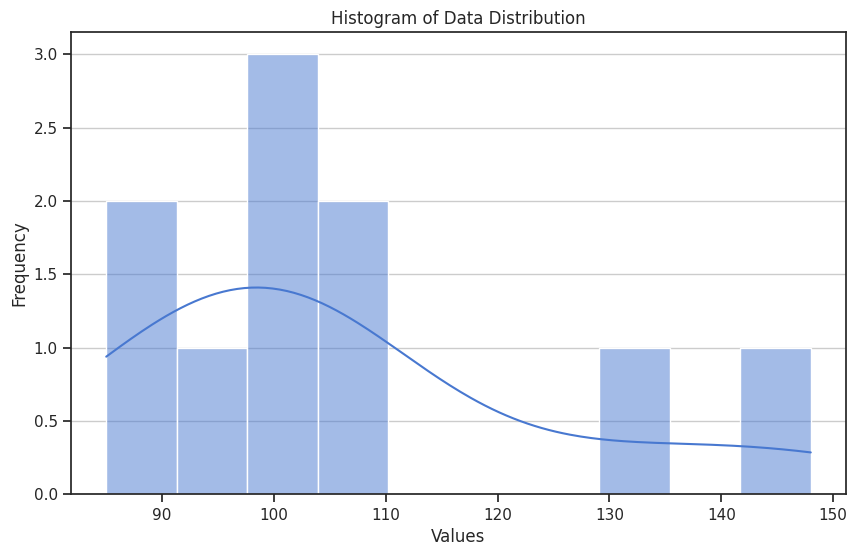

In [68]:
# selecting the reviews of the top reviewers
top = top_10_reviewers['author.num_reviews']
# Creating a new figure for plotting with specified dimensions
plt.figure(figsize=(10, 6))# Width of 10 inches and height of 6 inches
# Creating the histogram with the specified dataset
sns.histplot(top, bins=10, kde=True)
# Setting titles and grid
plt.title('Histogram of Data Distribution')
plt.xlabel('Values')
plt.ylabel('Frequency')
plt.grid(axis='y')
plt.show()

This plot is a histogram with a KDE (Kernel Density Estimate) line overlayed showing the distribution of the reviews among all the top 10 reviewers.
Each bar shows the frequency of values within specific intervals.
Distribution Shape:

Most data points are centered around 90 to 110, with the highest frequency around 100.
There are fewer values in the higher range (130-150).
KDE Line: The blue curve represents a smooth approximation of the data distribution.

It peaks around the 90-100 range, following the pattern of the histogram, but gradually decreases as values increase.
The KDE suggests that the data may be right-skewed, with a higher concentration on the left side.

Overall, the histogram shows that the dataset is not evenly distributed, with a higher frequency of values in the lower range (around 90-110) and fewer values at the upper end (130-150).











### What is the percentage of each language used by these top 10 reviewers when submitting a review?

The percentage was calculated grouping all the occurrences by the languages and count each of them, and then dividing it for the sum of all the count. Everything multiplied by 100.


In [69]:
top_users = top_10_reviewers['author.steamid'] # these are the top users
# counting the language for each time each author appears

# making the list for the top 10 reviews
list_ids = list(top_10_reviewers['author.steamid'])
# filtering the first dataframe to get the data for the specific list of users
filtered = df[df['author.steamid'].isin(list_ids)]
# group author.steamid and language and count the occurrences
occurrences = filtered.groupby(['author.steamid', 'language']).size().reset_index(name = 'count')
# sorting by count
occurrences.sort_values(by = 'count', ascending = False)
# these are the top ten reviewers
print(occurrences)

# Calculating the percentages
lan = occurrences.groupby(['language']).agg({'count':'sum'})

percentage = (lan / sum(lan['count']))* 100
print(percentage)

       author.steamid  language  count
0   76561197969749884   english     88
1   76561197989746995   english      2
2   76561197989746995  schinese     83
3   76561198013146396   english      1
4   76561198013146396   russian     97
5   76561198027973295   russian     96
6   76561198045381877   english    102
7   76561198062813911   english    148
8   76561198064946151   english     99
9   76561198192166873  schinese    106
10  76561198239163744   russian    106
11  76561198315585536   english    131
              count
language           
english   53.918791
russian   28.234183
schinese  17.847025


Since half of the reviews left by the reviewers are in english we may suppose that majority of the people live in english speaking countries. Other considerations regarding the language:

Steam, being a Western-based platform, may attract more English speakers due to its origin and the languages spoken in the regions where it is most popular.
Cultural Influence: The prevalence of English reviews could reflect the cultural dominance of English-speaking countries (like the U.S. and the U.K.) in the gaming industry, suggesting that trends and dialogues in gaming are often shaped by these regions.
English-speaking users may form a significant portion of Steam's user base, indicating that game developers may prioritize English localization in their games to cater to this demographic.

### Let's examine whether other users found the reviews from these top 10 reviewers helpful or if they were simply spamming. Calculate the average number of valuable votes these reviewers received for their submitted reviews. Elaborate on the results you see.

      author.steamid  author.num_reviews  votes_helpful
9  76561198315585536                 131           6522
7  76561198192166873                 106           4149
0  76561197969749884                  88           2309
1  76561197989746995                  85           1810
3  76561198027973295                  96           1133
8  76561198239163744                 106            810
6  76561198064946151                  99            398
4  76561198045381877                 102            231
5  76561198062813911                 148            132
2  76561198013146396                  98             95


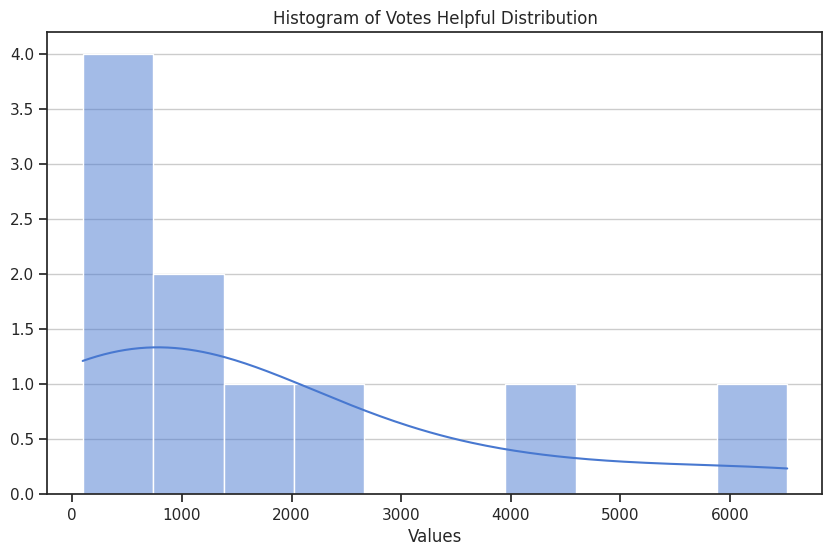

In [70]:
users = filtered.groupby('author.steamid').agg({'author.num_reviews':'max', 'votes_helpful':'sum'}).reset_index()

# Showing all the reviewers that found the review helpful
top_users = users.sort_values(by = 'votes_helpful', ascending= False).head(10)
print(top_users)
# Displying a plot for the votes helpful variable.
top_10 = top_users['votes_helpful']
# setting the size of the plot
plt.figure(figsize=(10, 6))
sns.histplot(top_10, bins=10, kde=True)
# setting the titles
plt.title('Histogram of Votes Helpful Distribution')
plt.xlabel('Values')
plt.ylabel('')
plt.grid(axis='y')
plt.show()

### Observations
We obtained an highly Skewed Distribution:

The `author.steamid 76561198315585536` has the highest number of helpful votes (6562), which is significantly more than the others. This suggests that a small number of reviewers are contributing reviews that the community finds very helpful.
The votes decrease rapidly to the bottom one `author.steamid 76561198013146396`, indicating a steep drop-off.
Top Reviewers:
The top three reviewers (`author.steamid 76561198315585536`, `author.steamid 76561198192166873`, `author.steamid 76561197969749884`) have received substantially more helpful votes (6562, 4162, and 2309 respectively) compared to the others.
These top reviewers may have established themselves as reliable or valuable sources of information in the community, gaining a reputation that leads to more helpful votes.
The data suggests a "long tail" effect: only a few reviewers receive a large number of helpful votes, while the majority receive relatively few. This kind of distribution is common in user-generated content, where a few top contributors are much more popular or well-regarded than the rest.

Reviews with a high number of helpful votes likely received more interaction overall, which implies that they’re either detailed, insightful, or address topics that resonate with readers.
The high number of votes could be a reflection of both quality and visibility; the more a review is seen and interacted with, the more likely it is to be marked as helpful.

In [71]:
# calculating how helpful are these votes

helpfulness_data = top_users['votes_helpful'] / top_users['author.num_reviews']
helpfulness_data

# these rates are all high indicating that the review were helpful.
# indeed even if we look at how many comments we have under each review

,0
9,49.786260
7,39.141509
0,26.238636
1,21.294118
3,11.802083
8,7.641509
6,4.020202
4,2.264706
5,0.891892
2,0.969388


In [72]:
# Analyzing the reviewers with the highest number of helpful votes
print(occurrences[occurrences['author.steamid'] == 76561198315585536]['language'].values[0])
print(occurrences[occurrences['author.steamid'] == 76561198192166873]['language'].values[0])
print(occurrences[occurrences['author.steamid'] == 76561197969749884]['language'].values[0])

# analysing the comments

comments_count = filtered.groupby('author.steamid').agg({'votes_helpful':'sum', 'author.num_reviews':'max', 'comment_count':'sum'}).reset_index()
comments_count.sort_values(by= 'comment_count', ascending= False)
print(comments_count)
if comments_count['votes_helpful'].mean() < 5:
    observation = "The reviewers appear to be providing less helpful content, possibly indicating spamming."
elif comments_count['votes_helpful'].mean() < 10:
    observation = "The reviewers have received moderate helpful votes, suggesting mixed reception."
else:
    observation = "The reviewers are providing valuable reviews, evidenced by a high number of helpful votes."

print('The mean is ', comments_count['votes_helpful'].mean(), '.' ,observation)



english
schinese
english
      author.steamid  votes_helpful  author.num_reviews  comment_count
0  76561197969749884           2309                  88            134
1  76561197989746995           1810                  85             95
2  76561198013146396             95                  98              2
3  76561198027973295           1133                  96            182
4  76561198045381877            231                 102             10
5  76561198062813911            132                 148              8
6  76561198064946151            398                  99             35
7  76561198192166873           4149                 106             30
8  76561198239163744            810                 106             22
9  76561198315585536           6522                 131            158
The mean is  1758.9 . The reviewers are providing valuable reviews, evidenced by a high number of helpful votes.


The review with the highest number of helpful votes is the `author.steamid 76561198315585536`, which language corresponds to english, this highlights that the most frequently viewed and voted reviews tend to be those written in English, likely due to its status as a widely recognized language.
The reviewers with the most helpful votes seem to be those who have made a noticeable impact. They could be influential voices in the community, and their reviews likely spark discussions or address frequently asked questions, leading to a higher interaction rate.
Interpretation of Helpfulness:

### Observation for the comments_count

Reviewers with higher helpful votes (e.g., 6562, 4162, 2309) also have a relatively high number of reviews. This suggests that being active and posting multiple reviews may contribute to accumulating more helpful votes.
Reviewers with a high comment count tend to have received higher helpful votes, suggesting that more interaction and visibility likely increase the perceived helpfulness of reviews. On the other hand the reviewers with lower helpful votes often have fewer comments and reviews. This could indicate that they are less engaged or visible within the community, resulting in fewer helpful votes.

There are instances where the number of reviews and comments is low, but the helpful votes are relatively high (example, 4162 votes with only 30 comments). This could indicate that the quality of the reviews matters as well, as some reviews might stand out despite lower engagement through comments






Considerations regarding the reviews
* The 54% of the highest reviewers have written the review in english
* The reviews seemed helpful and also showed engagement from the other reviewers/players
* By calculating the helpfulness rate we saw that they were helpful


In [73]:
reviews = filtered.groupby('app_name').agg({'author.steamid':'count'}).reset_index()
reviews.rename(columns={'author.steamid': 'review_count'}, inplace=True)
reviews.sort_values(by = 'review_count', ascending = False)
# these are the most reviewed games among the top 10 reviewers.

,app_name,review_count
230,Tomb Raider,10
82,Fallout 4,10
229,Tom Clancy's Rainbow Six Siege,9
59,Dead by Daylight,9
93,Garry's Mod,9
...,...,...
259,X-Blades,1
258,X Rebirth,1
28,Bomber Crew,1
31,Budget Cuts,1


### Create a plot showing the distribution of the number of reviews each application received from the top 10 reviewers, arranged in descending order.

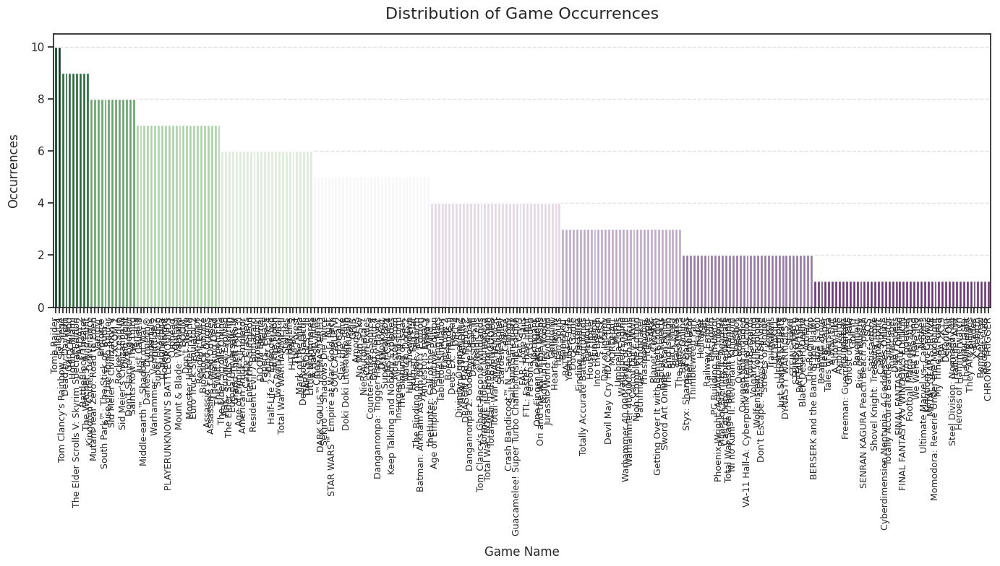

In [74]:
# Sorting the dataframe by occurrences to make the plot easier to read
df_sorted = reviews.sort_values(by='review_count', ascending=False)

# Defining the color palette
colors = sns.color_palette("PRGn", as_cmap=True)(df_sorted['review_count'] / df_sorted['review_count'].max())

# Setting up the plot characteristics
plt.figure(figsize=(14, 8))
sns.barplot(
    x=df_sorted['app_name'],
    y=df_sorted['review_count'],
    palette=colors
)

# Labeling the plot
plt.xticks(rotation=90, fontsize=9)
plt.xlabel("Game Name", fontsize=12, labelpad=10)
plt.ylabel("Occurrences", fontsize=12, labelpad=10)
plt.title("Distribution of Game Occurrences", fontsize=16, pad=15)
plt.grid(axis='y', linestyle='--', alpha=0.6)

# Showing the plot
plt.tight_layout()
plt.show()

Interpretation of the Figure:
The resulting bar plot shows each game on the x-axis and the number of occurrences (review count) on the y-axis.
Games with the most reviews are shown at the start, with taller bars and more intense colors. This highlights which games are the most reviewed or popular among the dataset. While games with fewer reviews are shown towards the end of the plot, with shorter bars and lighter colors. This provides a clear comparison of game popularity or visibility based on review count.
A few games appear with the highest frequency, reaching up to 14 occurrences. These could be highly popular or influential games in the dataset.
The chart shows a skewed distribution where only a small number of games are highly frequent, while most games have fewer occurrences. This pattern is typical in popularity distributions where a few titles dominate.



# Research Question 6

<h2 style="display: inline;">[RQ 6]</h2> <span style="font-size: 18px; font-style: italic;">Let's investigate the behavior of specific groups, specifically focusing on English and Spanish reviewers.</span>

### Which group is more likely to edit or update their review after submitting it? “English or Spanish!”?

The following code generates a bar plot that shows the percentage of edited or updated reviews for each language. This percentage is calculated based on the number of edited or updated reviews relative to the total number of reviews written in that language. The languages are displayed in descending order, with English and Spanish reviews highlighted in red. The English group is identified as the group most likely to edit or update their reviews compared to the Spanish group.

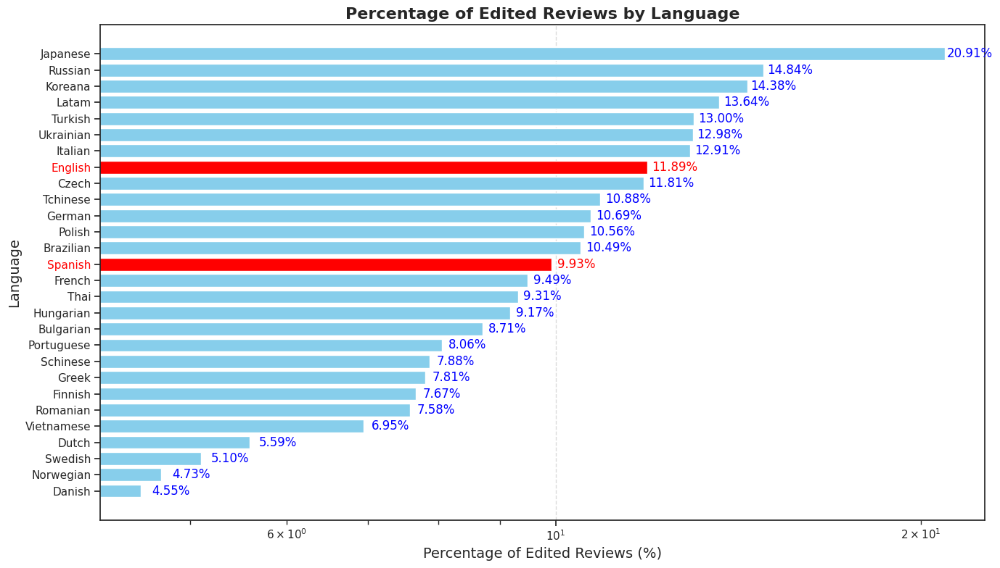

In [75]:
# Filter reviews that have been edited (created before they were updated)
edited_reviews = df[df['datetime_created'] < df['datetime_updated']]

# Group by language to count the number of edited reviews
edit_count_by_language = edited_reviews.groupby('language').agg(edit_count=('review_id', 'count'))

# Count total reviews by language and add it to the group DataFrame
total_reviews_by_language = df.groupby('language').agg(total_reviews=('review_id', 'count'))['total_reviews']
edit_count_by_language['total_reviews'] = total_reviews_by_language

# Calculate the percentage of edited reviews
edit_count_by_language['edit_percentage'] = (edit_count_by_language['edit_count'] / edit_count_by_language['total_reviews']) * 100

# Sort the DataFrame by edit percentage in descending order
edit_count_by_language = edit_count_by_language.sort_values(['edit_percentage'], ascending=False)

# Create horizontal bar chart
plt.figure(figsize=(14, 8))

# Set colors based on the language
bar_colors = ['red' if lang.lower() in ['english', 'spanish'] else 'skyblue' for lang in edit_count_by_language.index]
bars = plt.barh(edit_count_by_language.index, edit_count_by_language['edit_percentage'], color=bar_colors)

# Set labels and title for the chart
plt.xlabel('Percentage of Edited Reviews (%)', fontsize=14)
plt.ylabel('Language', fontsize=14)
plt.title('Percentage of Edited Reviews by Language', fontsize=16, weight='bold')
plt.gca().invert_yaxis()  # Invert the y-axis for better visual representation

# Set x-axis to logarithmic scale
plt.xscale('log')
plt.grid(axis='x', linestyle='--', alpha=0.7)

# Add percentage labels on the bars
for index, percentage in enumerate(edit_count_by_language['edit_percentage']):
    text_color = 'blue'  # Default text color
    if edit_count_by_language.index[index].lower() in ['english', 'spanish']:
        text_color = 'red'  # Change text color to red for specific languages
    plt.text(percentage + 0.1, index, f"{percentage:.2f}%", color=text_color, va='center')  # Offset text position

# Capitalize the first letter of each language name for y-tick labels
y_tick_labels = [lang.capitalize() for lang in edit_count_by_language.index]
plt.gca().set_yticks(np.arange(len(y_tick_labels)))  # Set the position of y-ticks
plt.gca().set_yticklabels(y_tick_labels)  # Set the updated tick labels

# Change the color of y-tick labels for specific languages
for tick_label in plt.gca().get_yticklabels():
    if tick_label.get_text() in ['English', 'Spanish']:
        tick_label.set_color('red')  # Change color to red

# Show the chart with tight layout
plt.tight_layout()
plt.show()

### Provide the average number of games that reviewers from each group have on their Steam accounts and the average number of games for which they write reviews. What can you say about the number you just calculated?

#### Descriptive Statistics

Before proceeding with the analysis, relevant statistics for the number of games owned and the number of reviews will be presented. This preliminary step provides insight for the `author.num_games_owned` and `author.num_reviews columns`, including any potential anomalies or outliers that could affect the reliability of subsequent analyses. To ensure accurate statistics, we’ll first remove duplicate entries based on unique author Steam IDs. This step isolates individual users, preventing duplicate data points from skewing our results.

In [76]:
# Removing duplicates to get unique authors
unique_author = df.drop_duplicates(['author.steamid'])

# Descriptive statistics for author.num_games_owned
games_owned_stats = unique_author['author.num_games_owned'].describe()

# Descriptive statistics for author.num_reviews
reviews_stats = unique_author['author.num_reviews'].describe()

# Converting statistics to a more readable format
games_owned_stats_formatted = {
    'Count': f"{int(games_owned_stats['count']):,}".replace(',', ' '),
    'Mean': f"{games_owned_stats['mean']:.2f}",
    'Std': f"{games_owned_stats['std']:.2f}",
    'Min': f"{int(games_owned_stats['min']):,}".replace(',', ' '),
    '1st quartile': f"{int(games_owned_stats['25%']):,}".replace(',', ' '),
    'Median': f"{int(games_owned_stats['50%']):,}".replace(',', ' '),
    '3rd quartile': f"{int(games_owned_stats['75%']):,}".replace(',', ' '),
    'Max': f"{int(games_owned_stats['max']):,}".replace(',', ' ')
}

reviews_stats_formatted = {
    'Count': f"{int(reviews_stats['count']):,}".replace(',', ' '),
    'Mean': f"{reviews_stats['mean']:.2f}",
    'Std': f"{reviews_stats['std']:.2f}",
    'Min': f"{int(reviews_stats['min']):,}".replace(',', ' '),
    '1st quartile': f"{int(reviews_stats['25%']):,}".replace(',', ' '),
    'Median': f"{int(reviews_stats['50%']):,}".replace(',', ' '),
    '3rd quartile': f"{int(reviews_stats['75%']):,}".replace(',', ' '),
    'Max': f"{int(reviews_stats['max']):,}".replace(',', ' ')
}

# Displaying the statistics
print("Descriptive Statistics for Number of Games Owned:")
for stat, value in games_owned_stats_formatted.items():
    print(f"{stat}: {value}")

print("\nDescriptive Statistics for Number of Reviews:")
for stat, value in reviews_stats_formatted.items():
    print(f"{stat}: {value}")

Descriptive Statistics for Number of Games Owned:
Count: 12 406 560
Mean: 1772556.28
Std: 2792023439.88
Min: 0
1st quartile: 13
Median: 38
3rd quartile: 96
Max: 4 398 046 511 619

Descriptive Statistics for Number of Reviews:
Count: 12 406 560
Mean: 1.74
Std: 1.82
Min: 1
1st quartile: 1
Median: 1
3rd quartile: 2
Max: 148


The descriptive statistics highlight significant asymmetry in both the number of games owned and the number of reviews per author. This skewness, seen in the large disparity between minimum and maximum values, points to the presence of extreme values, or outliers. Outliers can heavily impact statistical analysis, especially when calculating averages, as they tend to raise the mean and misrepresent the central tendency of the data.

In our dataset, a small subset of users with exceptionally high values for games owned or reviews can skew the average upward, potentially mischaracterizing the "typical" user experience. This effect is especially relevant here, as our goal is to calculate a meaningful mean. In skewed distributions, the average may not accurately reflect the general behavior of most users, as it can be disproportionately influenced by these extreme values. This calls for careful interpretation of the mean, as well as consideration of additional measures, such as the median, to provide a more balanced view of the data.

#### Outlier Analysis with Boxplots for the Number of Games Owned

The following visualizations are designed to highlight the distribution and skewness in the number of games owned by authors, with a focus on identifying and isolating outliers. To achieve this, we’ll progressively zoom into lower value ranges:
- **Boxplot 1**: Shows all values to illustrate the scale of extreme outliers.
- **Boxplot 2**: Focuses on values below $10^{12}$ to explore high outliers in greater detail.
- **Boxplot 3**: Limits values to below $200$, to reveal the typical range without extreme outliers.
Finally, key descriptive statistics (quartiles and range without outliers) will be displayed on the third boxplot to summarize the non-outlier distribution.

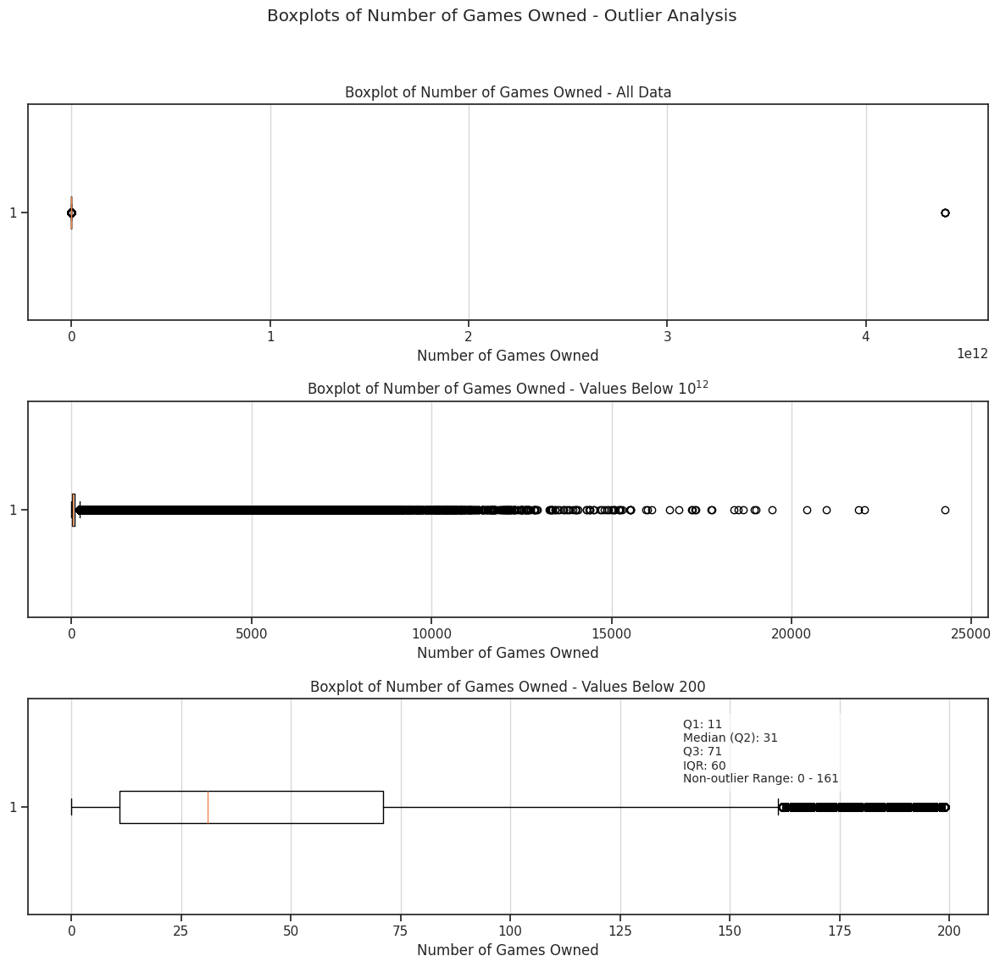

In [77]:
# Data for outliers
data_all = unique_author['author.num_games_owned']
data_below_10e12 = unique_author[unique_author['author.num_games_owned'] < 10**12]['author.num_games_owned']
data_below_200 = unique_author[unique_author['author.num_games_owned'] < 200]['author.num_games_owned']

# Quartile calculations for third boxplot
Q1 = data_below_200.quantile(0.25)
Q2 = data_below_200.median()  # Median
Q3 = data_below_200.quantile(0.75)
IQR = Q3 - Q1
minimum = max(0, Q1 - 1.5 * IQR)
maximum = int(Q3 + 1.5 * IQR)

# Creating subplots for boxplots
fig, axes = plt.subplots(3, 1, figsize=(12, 12))
fig.suptitle('Boxplots of Number of Games Owned - Outlier Analysis')

# Boxplot 1: All values
axes[0].boxplot(data_all, vert=False)
axes[0].set_title('Boxplot of Number of Games Owned - All Data')
axes[0].set_xlabel('Number of Games Owned')
axes[0].grid(axis='x', alpha=0.75)

# Boxplot 2: Values below 10^12
axes[1].boxplot(data_below_10e12, vert=False)
axes[1].set_title('Boxplot of Number of Games Owned - Values Below $10^{12}$')
axes[1].set_xlabel('Number of Games Owned')
axes[1].grid(axis='x', alpha=0.75)

# Boxplot 3: Values below 200 with statistics annotation
axes[2].boxplot(data_below_200, vert=False)
axes[2].set_title('Boxplot of Number of Games Owned - Values Below 200')
axes[2].set_xlabel('Number of Games Owned')
axes[2].grid(axis='x', alpha=0.75)

# Adding statistics to the third plot
stats_text = (f"Q1: {Q1:.0f}\n"
              f"Median (Q2): {Q2:.0f}\n"
              f"Q3: {Q3:.0f}\n"
              f"IQR: {IQR:.0f}\n"
              f"Non-outlier Range: {minimum:.0f} - {maximum:.0f}")
axes[2].text(max(data_below_200) * 0.7, 1.1, stats_text, ha='left', va='bottom',
             fontsize=10, bbox=dict(facecolor='white', alpha=0.6))

plt.tight_layout(rect=[0, 0.03, 1, 0.95])  # Adjust layout to fit title
plt.show()

For the third boxplot, we compute key descriptive statistics for values under $200$ to summarize the typical distribution without the influence of extreme outliers. This includes:
- First Quartile (Q1): 25th percentile;
- Median (Q2): 50th percentile, representing the central value;
- Third Quartile (Q3): 75th percentile;
- Interquartile Range (IQR): Difference between Q3 and Q1;
- Non-Outlier Range: Calculated as $[Q1 - 1.5 \cdot IQR, Q3 + 1.5 \cdot IQR]$

The boxplot identifies values outside the range $[0,161]$ as outliers. Although the median indicates a potential imbalance in the data, which could affect the precision of the average, removing all outliers (i.e., values greater than $161$) results in a more symmetric distribution. This adjustment enhances the accuracy and reliability of the average analysis.

To demonstrate this, we will remove the outliers and compute the relevant statistics, then compare these with the previous results.

In [78]:
games_owned_count = unique_author[unique_author['author.num_games_owned']<=161][['author.steamid', 'author.num_games_owned']]
games_owned_not_outliers_stats = games_owned_count['author.num_games_owned'].describe()

games_owned_stats_not_outliers_formatted = {
    'Count': f"{int(games_owned_not_outliers_stats['count']):,}".replace(',', ' '),
    'Mean': f"{games_owned_not_outliers_stats['mean']:.2f}",
    'Std': f"{games_owned_not_outliers_stats['std']:.2f}",
    'Min': f"{int(games_owned_not_outliers_stats['min']):,}".replace(',', ' '),
    '1st quartile': f"{int(games_owned_not_outliers_stats['25%']):,}".replace(',', ' '),
    'Median': f"{int(games_owned_not_outliers_stats['50%']):,}".replace(',', ' '),
    '3rd quartile': f"{int(games_owned_not_outliers_stats['75%']):,}".replace(',', ' '),
    'Max': f"{int(games_owned_not_outliers_stats['max']):,}".replace(',', ' ')
}

# Displaying the statistics
print("Descriptive Statistics for Number of Games Owned Without Outliers:")
for stat, value in games_owned_stats_not_outliers_formatted.items():
    print(f"{stat}: {value}")

Descriptive Statistics for Number of Games Owned Without Outliers:
Count: 10 682 352
Mean: 42.67
Std: 40.09
Min: 0
1st quartile: 11
Median: 29
3rd quartile: 64
Max: 161


These statistics reveal a more balanced and representative distribution of game ownership among users, particularly when compared to the previous analysis that included outliers. The initial mean, which was significantly inflated to $1 772 556.28$, was heavily influenced by a small group of users, specifically, $5$ users, each owning an exceptionally large number of games, surpassing $4 \cdot 10^{12}$. Removing these extreme values has substantially reduced the standard deviation, from $2 792 023 439.59$ to $40.09$, indicating a less variable and more stable dataset.

By eliminating these outliers, we gain a clearer view of typical user behavior. The adjusted mean of $42.67$ provides a more realistic understanding of game ownership patterns among the majority of users. This refined dataset not only allows for more accurate insights into typical game ownership but also enhances the reliability of any further analysis conducted on this data.

Moreover, the reliability of this analysis is underscored by the substantial portion of users on which it is based, especially in relation to the overall population size. The exact figures supporting this assertion are provided by the following code:

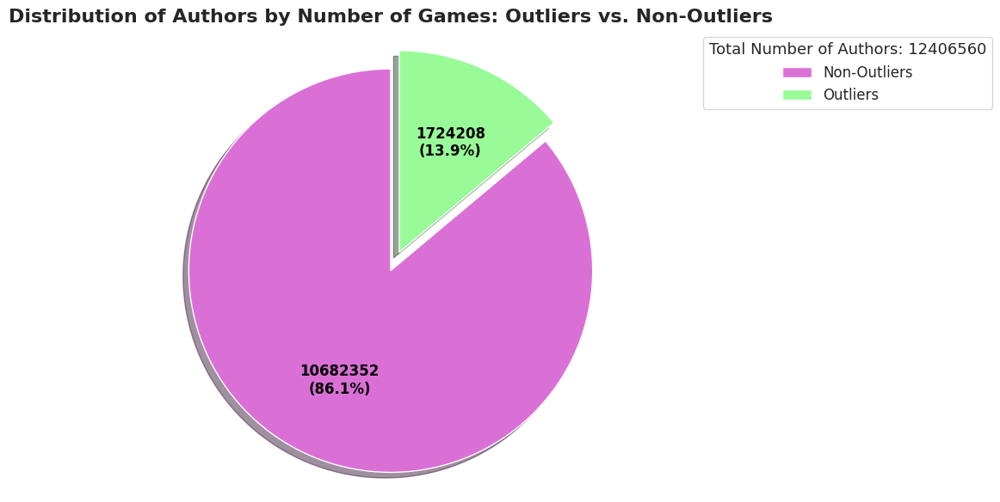

In [79]:
# Counts of authors
authors_count = unique_author.shape[0]
authors_not_outliers_count = unique_author[unique_author['author.num_games_owned'] <= 161].shape[0]
authors_outliers_count = unique_author[unique_author['author.num_games_owned'] > 161].shape[0]

# Data for the pie chart
labels = ['Non-Outliers', 'Outliers']
sizes = [authors_not_outliers_count, authors_outliers_count]
colors = ['orchid', '#98fb98']
explode = (0.1, 0)  # explode the 1st slice (Not Outliers)

# Create pie chart
plt.figure(figsize=(12, 6))
wedges, texts, autotexts = plt.pie(sizes, explode=explode, labels=labels, colors=colors,
                                    autopct=lambda p: f'{int(p * authors_count / 100)}\n({p:.1f}%)',
                                    startangle=90, shadow=True)

# Customize the aesthetics
plt.setp(autotexts, size=12, weight="bold", color="black")  # Customize percentage text
plt.setp(texts, color='white')  # Customize label text

# Add title
plt.title("Distribution of Authors by Number of Games: Outliers vs. Non-Outliers", fontsize=16, weight='bold')

# Add legend, adjusted to the right
plt.legend(title=f'Total Number of Authors: {authors_count}',
           title_fontsize='13', fontsize='12', loc='upper right', bbox_to_anchor=(1.5, 1),
           frameon=True)

plt.axis('equal')
plt.tight_layout()  # Adjust layout to prevent clipping
plt.show()

#### Outlier Analysis with Boxplots for the Number of Reviews

The following visualizations are designed to highlight the distribution and skewness in the number of reviews by authors, with a focus on identifying and isolating outliers. To achieve this, we will progressively zoom into lower value ranges:

1. **Boxplot 1**: Shows all values to illustrate the scale of extreme outliers.
2. **Boxplot 2**: Focuses on values below $10$ to reveal the typical range without extreme outliers.

Finally, key descriptive statistics (quartiles and range without outliers) will be displayed on the second boxplot to summarize the non-outlier distribution.

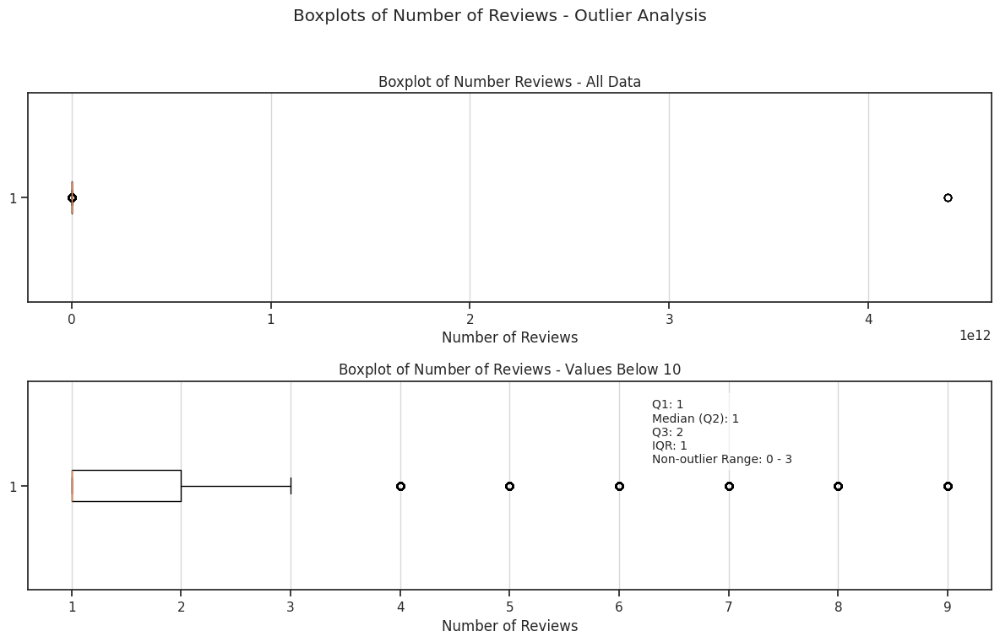

In [80]:
import matplotlib.pyplot as plt

# Data for outliers
data_r_all = unique_author['author.num_reviews']
data_below_10 = unique_author[unique_author['author.num_reviews'] < 10]['author.num_reviews']

# Quartile calculations for third boxplot
Q1_r = data_below_10.quantile(0.25)
Q2_r = data_below_10.median()  # Median
Q3_r = data_below_10.quantile(0.75)
IQR_r = Q3_r - Q1_r
minimum_r = max(0, Q1_r - 1.5 * IQR_r)
maximum_r = int(Q3_r + 1.5 * IQR_r)

# Creating subplots for boxplots
fig, axes = plt.subplots(2, 1, figsize=(12, 8))
fig.suptitle('Boxplots of Number of Reviews - Outlier Analysis')

# Boxplot 1: All values
axes[0].boxplot(data_all, vert=False)
axes[0].set_title('Boxplot of Number Reviews - All Data')
axes[0].set_xlabel('Number of Reviews')
axes[0].grid(axis='x', alpha=0.75)

# Boxplot 2: Values below 10
axes[1].boxplot(data_below_10, vert=False)
axes[1].set_title('Boxplot of Number of Reviews - Values Below $10$')
axes[1].set_xlabel('Number of Reviews')
axes[1].grid(axis='x', alpha=0.75)

# Adding statistics to the third plot
stats_text = (f"Q1: {Q1_r:.0f}\n"
              f"Median (Q2): {Q2_r:.0f}\n"
              f"Q3: {Q3_r:.0f}\n"
              f"IQR: {IQR_r:.0f}\n"
              f"Non-outlier Range: {minimum_r:.0f} - {maximum_r:.0f}")
axes[1].text(max(data_below_10) * 0.7, 1.1, stats_text, ha='left', va='bottom',
             fontsize=10, bbox=dict(facecolor='white', alpha=0.6))

plt.tight_layout(rect=[0, 0.03, 1, 0.95])  # Adjust layout to fit title
plt.show()

For the second boxplot, we compute key descriptive statistics for values under $10$ to summarize the typical distribution without the influence of extreme outliers, similar to the approach taken in the previous analysis.

The boxplot identifies values outside the range $[1, 3]$ as outliers. Although the median suggests a potential imbalance in the data, which could impact the precision of the average, removing all outliers (i.e., values greater than $4$) leads to a more symmetric distribution. This adjustment improves the accuracy and reliability of the average analysis.

To demonstrate this, we will remove the identified outliers, compute the relevant statistics for the adjusted dataset and compare these results with the previous findings, as we did in the earlier analysis.

In [81]:
# We filter authors with review counts less than or equal to 3, without checking for counts greater than or equal to 1.
# This simplification is based on our statistical analysis, which found that the minimum value in the 'author.num_reviews' column is 1.
# Therefore, by selecting only rows with values <= 3, we are automatically working within the range [1, 3].
author_reviews_count = unique_author[unique_author['author.num_reviews']<=3][['author.steamid', 'author.num_reviews']]
author_reviews_not_outliers_stats = author_reviews_count['author.num_reviews'].describe()

author_reviews_stats_not_outliers_formatted = {
    'Count': f"{int(author_reviews_not_outliers_stats['count']):,}".replace(',', ' '),
    'Mean': f"{author_reviews_not_outliers_stats['mean']:.2f}",
    'Std': f"{author_reviews_not_outliers_stats['std']:.2f}",
    'Min': f"{int(author_reviews_not_outliers_stats['min']):,}".replace(',', ' '),
    '1st quartile': f"{int(author_reviews_not_outliers_stats['25%']):,}".replace(',', ' '),
    'Median': f"{int(author_reviews_not_outliers_stats['50%']):,}".replace(',', ' '),
    '3rd quartile': f"{int(author_reviews_not_outliers_stats['75%']):,}".replace(',', ' '),
    'Max': f"{int(author_reviews_not_outliers_stats['max']):,}".replace(',', ' ')
}

# Displaying the statistics
print("Descriptive Statistics for Number of Reviews Without Outliers:")
for stat, value in author_reviews_stats_not_outliers_formatted.items():
    print(f"{stat}: {value}")

Descriptive Statistics for Number of Reviews Without Outliers:
Count: 11 362 131
Mean: 1.33
Std: 0.61
Min: 1
1st quartile: 1
Median: 1
3rd quartile: 2
Max: 3


These statistics highlight a more balanced and representative distribution of game ownership among users. Notably, the standard deviation has decreased significantly, from $1.82$ to $0.61$, indicating reduced variability. While the mean only slightly decreases from $1.77$ to $1.33$, this improvement reflects the minimized impact of extreme outliers.

The data are now more balanced: although the median remains at $1$ with and without outliers, the range is reduced from $[1, 148]$ to $[1, 3]$. This narrower interval improves the accuracy of the mean, which, though still not fully central, now represents the data more reliably than before.

Furthermore, the robustness of this analysis is supported by the substantial number of users included, which strengthens the validity of these insights relative to the overall population. The exact figures supporting this conclusion can be seen in the following code:

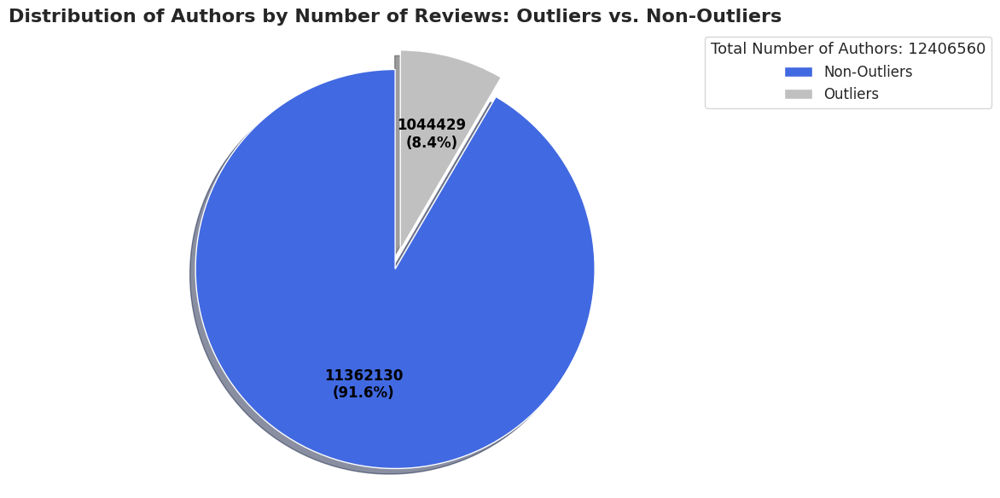

In [82]:
# Counts of authors
author_reviews_count = unique_author.shape[0]
author_reviews_not_outliers_count = unique_author[unique_author['author.num_reviews'] <= 3].shape[0]
author_reviews_outliers_count = unique_author[unique_author['author.num_reviews'] > 3].shape[0]

# Data for the pie chart
labels = ['Non-Outliers', 'Outliers']
sizes = [author_reviews_not_outliers_count, author_reviews_outliers_count]
colors = ['#4169e1', '#c0c0c0']
explode = (0.1, 0)  # explode the 1st slice (Not Outliers)

# Create pie chart
plt.figure(figsize=(12, 6))
wedges, texts, autotexts = plt.pie(sizes, explode=explode, labels=labels, colors=colors,
                                    autopct=lambda p: f'{int(p * author_reviews_count / 100)}\n({p:.1f}%)',
                                    startangle=90, shadow=True)

# Customize the aesthetics
plt.setp(autotexts, size=12, weight="bold", color="black")  # Customize percentage text
plt.setp(texts, color='white')  # Customize label text

# Add title
plt.title('Distribution of Authors by Number of Reviews: Outliers vs. Non-Outliers', fontsize=16, weight='bold')

# Add legend, adjusted to the right
plt.legend(title=f'Total Number of Authors: {authors_count}',
           title_fontsize='13', fontsize='12', loc='upper right', bbox_to_anchor=(1.5, 1),
           frameon=True)

plt.axis('equal')
plt.tight_layout()  # Adjust layout to prevent clipping
plt.show()

#### Computation of the average number of games that reviewers from each group have on their Steam accounts and the average number of games for which they write reviews

This code filters a dataset to focus on authors who own $161$ or fewer games and have written $3$ or fewer reviews, based on ***prior outlier analysis***. It then groups the filtered data by language to calculate the **average number of games owned** and the **average number of reviews** *for each language*. Next, a bar plot is created to visually represent the average number of games owned and reviews per language. Each bar is annotated with its exact average value, with color coding used to highlight minimum and maximum values for both metrics: red for the minimum and green for the maximum.

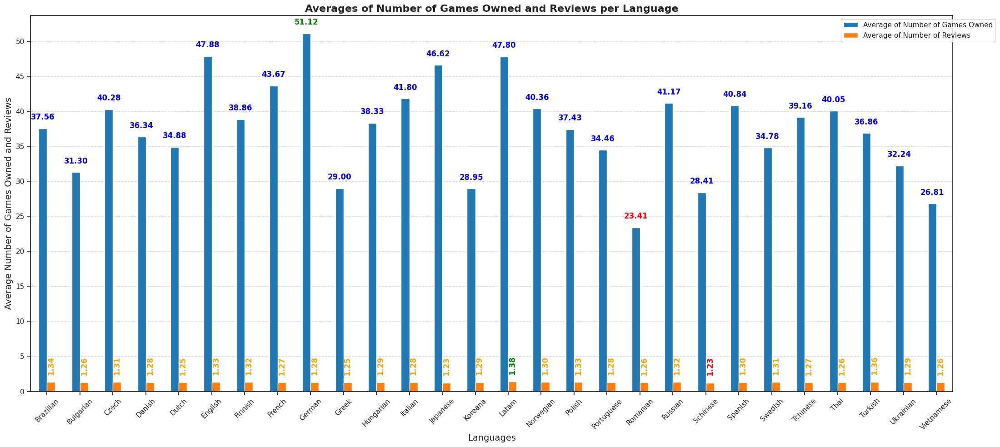

In [83]:
# Filter the dataset to include only authors with owned games <= 161 and reviews <= 3.
# These limits are based on prior outlier analysis that identified values above 161 and 3 as outliers in the respective columns.
unique_author = unique_author[(unique_author['author.num_games_owned'] <= 161) & (unique_author['author.num_reviews'] <= 3)]

# Group by language and calculate the average number of games owned and reviews for each language.
# The resulting DataFrame will include columns with average values for both metrics.
avg_per_language = unique_author.groupby('language').agg(
    avg_number_games_owned=('author.num_games_owned', 'mean'),
    avg_number_reviews=('author.num_reviews', 'mean')
).reset_index()

avg_per_language['language'] = avg_per_language['language'].str.capitalize()
avg_per_language.set_index('language', inplace=True)

# Create a bar plot to display the average number of games owned and reviews for each language.
fig, ax = plt.subplots(figsize=(22, 10))
bars = avg_per_language.plot(kind='bar', stacked=False, ax=ax, color=['#1f77b4', '#ff7f0e'])  # Plot the data

# Add titles and labels for clarity.
plt.title("Averages of Number of Games Owned and Reviews per Language", fontsize=16, weight="bold")
plt.xlabel("Languages", fontsize=14)
plt.ylabel("Average Number of Games Owned and Reviews", fontsize=14)
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
ax.set_yticks(range(0, 55, 5))  # Set y-axis ticks at intervals of 5 units for clearer scaling
plt.legend(labels=["Average of Number of Games Owned", "Average of Number of Reviews"], bbox_to_anchor=(1.05, 1))  # Customize the legend
plt.grid(axis="y", linestyle="--", alpha=0.7)  # Add horizontal grid lines for easier comparison across bars

# Annotate each bar with exact values and customize min/max labels.
for i, container in enumerate(ax.containers):
    for bar in container:
        height = bar.get_height()

        # Determine color based on the average value for both metrics
        if i == 0:  # First column (blu)
            color = 'red' if height == avg_per_language['avg_number_games_owned'].min() else 'green' if height == avg_per_language['avg_number_games_owned'].max() else 'blue'
            ax.text(
                bar.get_x() + bar.get_width() / 2, height + 1, f"{height:.2f}",
                ha="center", va="bottom", fontsize=12, color=color, weight='bold'
            )
        elif i == 1:  # Second column (arancione)
            color = 'red' if height == avg_per_language['avg_number_reviews'].min() else 'green' if height == avg_per_language['avg_number_reviews'].max() else 'orange'
            ax.text(
                bar.get_x() + bar.get_width() / 2, height + 1, f"{height:.2f}",  # Position above the bar
                ha="center", va="bottom", rotation=90, fontsize=12, color=color, weight='bold'  # Vertical rotation
            )

plt.tight_layout()  # Adjust layout to fit everything cleanly
plt.show()  # Display the plot

The barplot highlights these key observations:

1. **Variation in Game Ownership**: There is a **notable variation** in the *average number of games owned* across languages, with values ranging from **$23.41$** to **$51.12$**. **German**, **English**, and **Latam** speakers tend to own the most games, indicating potentially higher purchasing activity or interest among these language groups.

2. **Consistency in Review Counts**: The *average number of reviews* per language is *considerably lower* and **more consistent**, ranging from **$1.23$** to **$1.38$** reviews on average. This consistency suggests that, regardless of game ownership, users across languages have **similar reviewing behaviors**.

3. **Disparity Between Games Owned and Reviews**: A **significant ga**p exists between the average number of games owned and the number of reviews, emphasizing that, while users purchase many games, they only review a small fraction. This disparity is consistent across all language groups, hinting at a general trend where users are **less inclined to review** most of their owned games.

To conduct a more precise analysis, we also provide a **scatter plot** to examine the relationship between the number of games owned and the number of reviews across languages. This will help us better understand if there are any correlations or patterns that were not immediately apparent in the barplot.

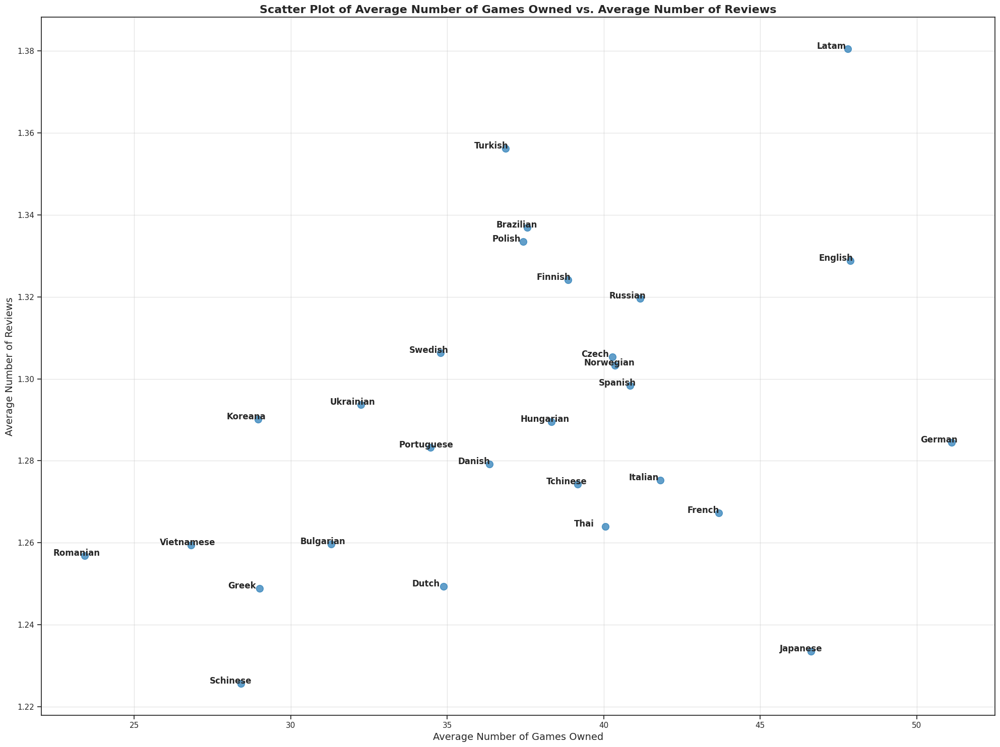

In [84]:
avg_per_language = unique_author.groupby('language').agg(
    avg_number_games_owned=('author.num_games_owned', 'mean'),
    avg_number_reviews=('author.num_reviews', 'mean')
).reset_index()
avg_per_language['language'] = avg_per_language['language'].str.capitalize()
# Create a scatter plot to display the average number of games owned against the average number of reviews for each language.
plt.figure(figsize=(20, 15))
plt.scatter(avg_per_language['avg_number_games_owned'], avg_per_language['avg_number_reviews'], color='#1f77b4', s=100, alpha=0.7)

# Add titles and labels for clarity.
plt.title("Scatter Plot of Average Number of Games Owned vs. Average Number of Reviews", fontsize=16, weight="bold")
plt.xlabel("Average Number of Games Owned", fontsize=14)
plt.ylabel("Average Number of Reviews", fontsize=14)

# Annotate each point with the corresponding language.
for i in range(avg_per_language.shape[0]):
    plt.annotate(avg_per_language['language'][i],  # Capitalize the language name
                 (avg_per_language['avg_number_games_owned'][i]-1, avg_per_language['avg_number_reviews'][i]),
                 fontsize=12, ha='left', weight = 'bold')

plt.grid(alpha=0.5)
plt.tight_layout()  # Adjust layout to fit everything cleanly
plt.show()  # Display the plot

This scatter plot is an in-depth visualization of the **relationship between the average number of games owned** and the **average number of reviews** submitted by users across different language groups. Each data point corresponds to a unique language group, with the point's position indicating the overall gaming engagement (in terms of games owned) and review activity for that group. By examining the clustering and spread of these points, we can discern general trends in user behavior as it relates to gaming ownership and engagement through reviews.

The plot reveals a **moderate positive correlation** between the average number of games owned and the average number of reviews submitted by users. This trend suggests that language groups with a higher average number of games owned also tend to have more engaged users in terms of reviewing games. This positive correlation is visible in the upward slant of the points, indicating that higher values on the x-axis (more games owned) are often associated with higher values on the y-axis (more reviews submitted). However, the degree of correlation varies across different language groups, reflecting cultural differences in gaming engagement and review behavior.

1. **High Ownership and High Review Activity**:
   - Language groups such as **Latam**, **English**, and **German** are located in the upper-right section of the plot, indicating both a high average number of games owned and a high average number of reviews. Users within these language groups appear to be heavily invested in gaming, as indicated by their high ownership, and also show a strong tendency to actively review games. This cluster suggests that these language groups may have a particularly strong culture of engagement around gaming, where users are motivated not only to buy games but also to share their gaming experiences and opinions publicly through reviews. The elevated review activity among these groups might indicate a culturally rooted inclination to interact with and influence the gaming community.

2. **Moderate Ownership and Moderate Review Activity**:
   - Language groups like **Finnish**, **Swedish**, and **Portuguese** occupy the middle range of the plot, with moderate values for both average games owned and average reviews. This suggests a balanced level of gaming and engagement where users from these groups own a fair number of games and contribute a moderate number of reviews. This mid-range cluster suggests a consistent but not intense engagement pattern, where gaming is an active hobby but does not reach the levels of review intensity seen in high-ownership groups. These language groups likely have users who enjoy gaming as a regular activity but may not feel as compelled to frequently review each game they own, possibly reflecting a more casual approach to sharing feedback.

3. **Low Ownership and Low Review Activity**:
   - In the lower-left corner, language groups like **Schinese**, **Romanian**, and **Vietnamese** exhibit both low average game ownership and low average review activity. This placement could indicate that users from these language groups are generally less engaged in gaming overall or may not actively participate in reviewing games. Several factors could explain this trend, such as economic constraints, cultural differences in consumer behavior, or a lack of emphasis on written feedback within these communities. This segment represents a less engaged user base, where gaming may be less central to users’ social or entertainment activities, leading to both limited game purchasing and reduced inclination to leave reviews.

4. **Outliers**:
   - **Japanese** users exhibit a unique behavior pattern: they have a high average number of games owned but a relatively low average number of reviews, deviating from the general trend of high ownership being associated with high review activity. This suggests that while Japanese users may be frequent purchasers of games, they tend to participate less in review activity. This pattern might stem from cultural differences in online engagement, where users may be less inclined to share public opinions or might engage with games in ways that don’t involve community feedback. This outlier behavior highlights a distinct approach to gaming, where purchasing decisions are not necessarily linked to engagement in the form of public reviews.

In general, the plot indicates a **positive trend** between game ownership and review activity, suggesting that as users own more games, they are more likely to leave reviews, particularly among groups with strong cultural inclinations toward community engagement. However, distinct **regional and cultural clusters** with specific behaviors emerge, highlighting the differences in how language groups approach gaming engagement. This information could be valuable for businesses looking to **tailor engagement strategies** to each audience, as certain groups may be more receptive to incentivized reviewing or other interactive content. For instance, strategies encouraging reviews might be particularly effective in highly engaged groups (like Latam or English users), while groups like Japanese users may require different approaches that do not heavily rely on review incentives.


# Research Question 7

<h2 style="display: inline;">[RQ 7]</h2> <span style="font-size: 18px; font-style: italic;"> Certainly, calculating probabilities and conducting statistical tests are essential skills for any data scientist. Let's calculate some intriguing figures.</span>

In [4]:
# df was modified in previous exercises, so I apply data cleaning to df2 to use it here
import pandas as pd

# Convert timestamps in the 'timestamp_created', 'timestamp_updated', and 'author.last_played' columns from seconds to pandas datetime objects.
# This transformation allows for easier manipulation and analysis of date and time information in the dataset.
df2['datetime_created'] = pd.to_datetime(df2['timestamp_created'], unit='s')
df2['datetime_updated'] = pd.to_datetime(df2['timestamp_updated'], unit='s')
df2['author.last_played_datetime'] = pd.to_datetime(df2['author.last_played'], unit='s')

# Clean data due to inconsistencies
# Group the DataFrame by 'author.steamid' to get the maximum number of games owned per author
number_games = df2.groupby('author.steamid').agg(num_games_owned=('author.num_games_owned','max'))
# Perform a join to add 'num_games_owned' from number_games to the main DataFrame df
df2 = df2.merge(number_games, on='author.steamid', how='left')
# Replace the 'author.num_games_owned' column with values from the 'num_games_owned' column
df2['author.num_games_owned'] = df2['num_games_owned']
# Drop the temporary column 'num_games_owned' if it is no longer needed
df2 = df2.drop(columns=['num_games_owned'])

# Calculate the number of reviews per author
number_reviews = (df2[['author.steamid','review_id']].drop_duplicates(subset=['author.steamid','review_id'])).groupby('author.steamid').agg(num_reviews = ('review_id','count'))
# Perform a join to add 'num_reviews' from number_reviews to the main DataFrame df
df2 = df2.merge(number_reviews, on='author.steamid', how='left')
# Replace the 'author.num_reviews' column with values from the 'num_reviews' column
df2['author.num_reviews'] = df2['num_reviews']
# Drop the temporary column 'num_reviews' if it is no longer needed
df2 = df2.drop(columns=['num_reviews'])

# Eliminate duplicates
column_to_exclude = 'review_id' # Define the column to exclude from duplicates check
columns_to_include = [col for col in df2.columns if col != column_to_exclude] # List of columns to include in the duplicates check
df2.drop_duplicates(subset=columns_to_include, inplace=True) # Drop duplicates

### 1. What is the probability of submitting a review and receiving at least one helpful vote from other users?

Let us define the event $A=\{\text{submitting a review and receiving at least one helpful vote}\}$, which could be equivalently expressed in terms of the random variable ```votes_helpful``` as $A=\{\text{votes_helpful}\geq1\}$.

Using a frequentist approach, where probability can be interpreted as the relative frequency of an event occurring in repeated experiments or samples (in our case, review records), we can find the probability of $A$ by computing the following ratio:

$\mathbb{P}(A) = \frac{\text{number of reviews with at least one helpful vote}}{\text{total number of reviews}}$

We find the number of reviews by counting the rows for which ```votes_helpful```$\geq1$, and divide them by the total number of rows, since each row corresponds to a review. The total number of rows is given by ```df2.shape[0]```, and the rows for which ```votes_helpful```$\geq1$ is valid are ```df2[df2['votes_helpful']>=1].shape[0]```.

In [5]:
print("Probability of submitting a review and receiving at least one helpful vote from other users:")
some_helpful_vote = df2[df2['votes_helpful']>=1].shape[0] / df2.shape[0]
print(some_helpful_vote)

Probability of submitting a review and receiving at least one helpful vote from other users:
0.2810172414223894


### 2. What is the probability of submitting a review and receiving at least one helpful vote from other users, given that you don't recommend the app?

We can recall the definition of event $A$ from the previous point, $A=\{\text{votes_helpful}\geq1\}$, and define another event $B=\{\text{recommended==False}\}$ We want to know the probability of submitting a review and receiving at least one helpful vote from other users, if the app was not recommended, which can be interpreted as the probability of $A$ conditioned by the assumption that $B$ happened: $\mathbb{P}(A|B)$.

Following the definition of conditional probability, this is equal to: $\mathbb{P}(A|B)=\mathbb{P}(A,B)/\mathbb{P}(B)$ where $\mathbb{P}(A,B)$ is the joint probability of $A$ and $B$.

Continuing with the frequentist approach, to find $\mathbb{P}(A, B)$ we calculate the following ratio:

$\mathbb{P}(A,B)=\frac{\text{number of reviews that satisfy conditions } A \text{ and } B}{\text{total number of reviews}}$

For the second, we compute the ratio $\mathbb{P}(B)=\frac{\text{number of reviews that satisfy condition } B}{\text{total number of reviews}}$

Then, we have to divide one by the other, which simplifies the calculations to:

$\mathbb{P}(A|B)=\mathbb{P}(A,B)/\mathbb{P}(B) = \frac{\text{number of reviews that satisfy conditions } A \text{ and } B}{\text{number of reviews that satisfy condition } B}$

We find the $\text{number of reviews that satisfy conditions } A \text{ and } B$ by selecting only rows from the DataFrame that fulfill both conditions: ```df2[(df2['votes_helpful']>=1) & (df2['recommended']==False)].shape[0]```, while we calculate $\text{number of reviews that satisfy condition } B$ by taking ```df2[df2['recommended']==False].shape[0]```. Then we divide, and get the wanted probability:

In [86]:
print("Probability of submitting a review and receiving at least one helpful vote from other users, given that you don't recommend the app:")
print(df2[(df2['votes_helpful']>=1) & (df2['recommended']==False)].shape[0] / df2[df2['recommended']==False].shape[0])

Probability of submitting a review and receiving at least one helpful vote from other users, given that you don't recommend the app:
0.48448313888092454


### 3. Is the probability of “a review receiving at least one helpful vote” independent of the probability that “the reviewer has submitted at least five reviews before the current review”? Elaborate on it.

In the first two points, we used the event $A=\{\text{votes_helpful}\geq1\}$, and now we can define another event $C=\{\text{the reviewer has submitted at least five reviews before the current review}\}$. Representing $C$ in terms of conditions on the columns is not as straightforward as before, but there are ways to calculate it using the frequentist approach, as we will see soon.

The question is whether $A$ and $C$ are independent events, which in terms of probabilities means verifying if $\mathbb{P}(A, C)=\mathbb{P}(A)\mathbb{P}(C)$ or equivalently $\mathbb{P}(A|C) = \mathbb{P}(A)$ is true.

We already calculated $\mathbb{P}(A)$, so now we want to find $\mathbb{P}(A,C)$ and $\mathbb{P}(C)$ to see if the equality holds.

We can calculate the probability of $C$ by computing:

$\mathbb{P}(C)=\frac{\text{# reviews s.t. user has left at least 5 reviews before}}{\text{total # reviews}}$

And for $P(A,C)$ we compute  

$\mathbb{P}(A,C)=\frac{\text{# reviews s.t. (votes_helpful} \geq1\text{) AND (user has left at least 5 reviews before)}}{\text{total # reviews}}$

Again, we can divide $\mathbb{P}(A,C)/\mathbb{P}(C)$ to get the conditional probability $\mathbb{P}(A|C)$, which simplifies to:

$\mathbb{P}(A|C)=\frac{\text{# reviews s.t. (votes_helpful} \geq1\text{) AND (user has left at least 5 reviews before)}}{\text{# reviews s.t. user has left at least 5 reviews before}}$

So we are interested in counting the reviews that satisfy these conditions.

We first compute the denominator, because once we know all the rows that verify event $C$, it is easy to filter the dataset to find the intersection with event $A$.

To find all the reviews whose author has left at least five other reviews before it, we can proceed as follows:

1. Filter out users with 5 or less reviews in total (keep reviews s.t. ```author.num_reviews```$>5$)
2. Group the remaining reviews by user (```author.steamid```)
3. Sort each group by timestamp (```timestamp_created```)
4. Discard the reviews with the five earliest timestamps for each group
5. Count all the remaining timestamps

This will work because once we discard the five earliest reviews of each user who has more than 5 reviews, the remaining ones are all part of event $C$.


In the following code cell we create a pandas Series ```at_least_5_previous_reviews``` containing all the reviews such that the user who wrote it already wrote at least five previous reviews.

The first step is to select all the users who submitted at least five reviews with ```df2[df2['author.num_reviews'] > 5]```. Then, we group this filtered DataFrame by user ID with the method ```.groupby('author.steamid')```, to keep the reviews of different users apart. After this, we restrict the DataFrame to the ```timestamp_created``` column, and sort each user-specific group of timestamps in ascending order by applying a lambda function to each individual group. Since we are only interested in reviews whose author already published at least five previous reviews, for each sorted timestamp group we want to exclude the earliest five entries. These last two passages can be implemented by applying ```.apply(lambda x: x.sort_values().iloc[5:])``` on the pandas object obtained in the previous passages. This code can be summarized in one line:


In [6]:
at_least_5_previous_reviews = df2[df2['author.num_reviews'] > 5].groupby('author.steamid')['timestamp_created'].apply(lambda x: x.sort_values().iloc[5:])

The pandas series ```at_least_5_previous_reviews``` is grouped by ```author.steamid```, and in each group it contains ```timestamp_created``` and their respective indices from the original DataFrame. In this multi-level indexing situation, we can access the indices of all the timestamps in ```at_least_5_previous_reviews``` if we use ```.index.get_level_values(1)```. The "1" means that we are accessing the row indices of the timestamps from the original dataset. Writing level "0" would have given us the steam IDs that this Series is grouped by. But we are interested in the row indices, and in the count of those indices, so we can implement the following code:

In [7]:
at_least_5_previous_reviews_indices = at_least_5_previous_reviews.index.get_level_values(1)
print("# reviews s.t. the user has left at least 5 reviews before:")
print(len(at_least_5_previous_reviews_indices))

# reviews s.t. the user has left at least 5 reviews before:
1684855


Now that we have the indices, we can filter the original dataset to access the specific reviews contained in $C$, and then filter once more to select the reviews among these that are part of event $A$:

In [8]:
print("# reviews s.t. (votes_helpful>=1) AND (user has left at least 5 reviews before):")
helpful_votes_and_5_previous_revious = df2.loc[at_least_5_previous_reviews_indices].query('votes_helpful>=1').shape[0]
print(helpful_votes_and_5_previous_revious)

# reviews s.t. (votes_helpful>=1) AND (user has left at least 5 reviews before):
637042


Finally, we can calculate $\mathbb{P}(A|C)$ and compare it with $\mathbb{P}(A)$ to see if they are approximately equal.

In [9]:
print("P(A|C)=", helpful_votes_and_5_previous_revious/len(at_least_5_previous_reviews_indices))
print("P(A)=", some_helpful_vote)

P(A|C)= 0.3780990055524066
P(A)= 0.2810172414223894


There is a relatively large gap between the two probabilities, which indicates that they are dependent:

$\mathbb{P}(A, C) \neq \mathbb{P}(A)\mathbb{P}(C) \iff \mathbb{P}(A|C) \neq \mathbb{P}(A)$

What we can draw from this result is that if a user has already left some reviews, the probability that their new review will be noticed and voted as helpful will be higher. This could be due to a couple of factors, such as the user's review quality increasing over time and therefore attracting more positive reactions, or the system prioritizing more active users when displaying game reviews.

The implications for statistics are that the dependency between these events suggests considering reviewer experience when analyzing review helpfulness.

### 4. We hypothesize that “reviewers who own a larger number of games are likely to leave fewer reviews on the platform.” Please validate or refute this statement through statistical analysis.

To validate or refute the hypothesis in question, we can analyze the relationship between the number of games owned by each author, ```author.num_games_owned```, and the number of reviews left by them, ```author.num_reviews```. We can first plot histograms and get a general description of these columns to understand their distribution and value range:

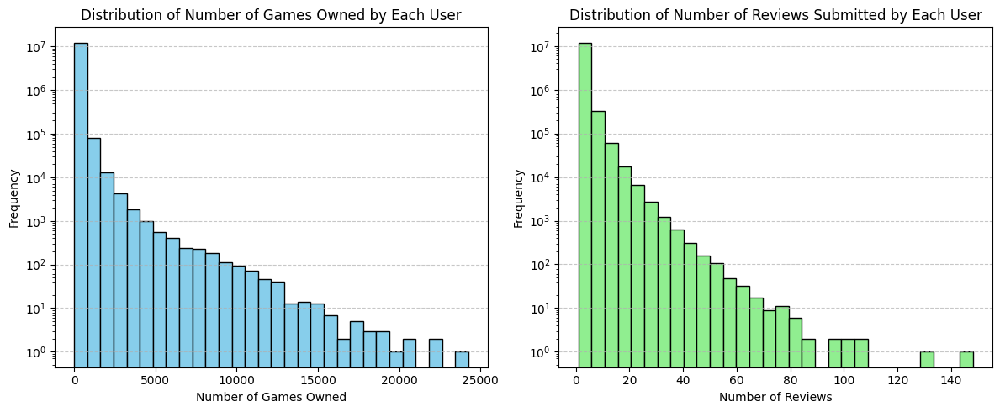

,Feature,Count,Missing,Mean,Median,Std,Min,Max,25% (Q1),75% (Q3),IQR,Skewness,Kurtosis
0,author.num_games_owned,12406555,0,88.121522,38.0,193.781361,0,24258,13.0,96.0,83.0,17.693096,762.184996
1,author.num_reviews,12406555,0,1.742017,1.0,1.819148,1,148,1.0,2.0,1.0,6.593782,91.791894


In [14]:
import matplotlib.pyplot as plt
from scipy.stats import spearmanr

threshold = 400000 # approximate max number of games

# Make a data frame that stores for each 'author.steamid', their unique values for 'author.num_games_owned' and 'author.num_reviews'
unique_author_data = df2[df2['author.num_games_owned']<threshold][['author.steamid', 'author.num_games_owned', 'author.num_reviews']].drop_duplicates('author.steamid')

# Plot histogram for number of games owned
fig, axes = plt.subplots(1, 2, figsize=(12, 5))
axes[0].hist(unique_author_data['author.num_games_owned'], bins=30, color='skyblue', edgecolor='black', log=True)
axes[0].set_title('Distribution of Number of Games Owned by Each User')
axes[0].set_xlabel('Number of Games Owned')
axes[0].set_ylabel('Frequency')
axes[0].grid(axis='y', linestyle='--', alpha=0.7)

# Plot histogram for number of reviews
axes[1].hist(unique_author_data['author.num_reviews'], bins=30, color='lightgreen', edgecolor='black', log=True)
axes[1].set_title('Distribution of Number of Reviews Submitted by Each User')
axes[1].set_xlabel('Number of Reviews')
axes[1].set_ylabel('Frequency')
axes[1].grid(axis='y', linestyle='--', alpha=0.7)

plt.tight_layout()
plt.show()

# print numeric features of these two columns
column_summary = numeric_summary(unique_author_data[['author.num_games_owned','author.num_reviews']])
column_summary

The histograms describing the number of games owned by users and the number of reviews submitted by them both follow a very steep downward curve, meaning that most users do not leave a large number of reviews or own more than a few dozen games. However, a small fraction of users is highly active in terms of leaving reviews and another small fraction of the total number of users owns many games. These statistics tell us about how the features are distributed separately. To see how they are correlated, we can print a scatter plot from the pairs (```author.num_games_owned```, ```author.num_reviews```).

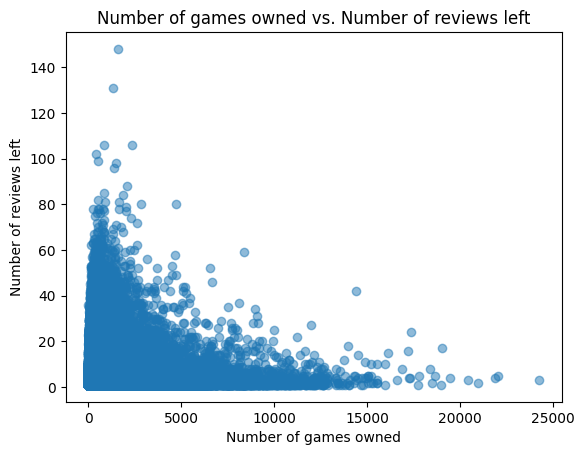

In [15]:
plt.scatter(unique_author_data['author.num_games_owned'], unique_author_data['author.num_reviews'], alpha=0.5) # print a scatter plot
plt.xlabel('Number of games owned')
plt.ylabel('Number of reviews left')
plt.title('Number of games owned vs. Number of reviews left')
plt.show()

Looking at this scatterplot, there does not seem to be much of a linear relationship between the two features. Many data points indicate that some users with fewer games tend to leave more reviews, while those with a larger number of games tend to leave fewer reviews. There is a large cluster of points concentrated in the lower-left corner of the plot, confirming that most users own a smaller number of games and leave a limited number of reviews. There are some outliers, where users with thousands of games have still left a great number of reviews. However, these cases are rarer and are further away from the main cluster.

Overall, this plot seems to indicate that as users acquire more and more games, they are less likely to review them all, perhaps because it would be very time-demanding.

We could create a scatter plot with log-transformed values to reduce skewedness and see if the plot reveals more about the relationship between the two attributes.

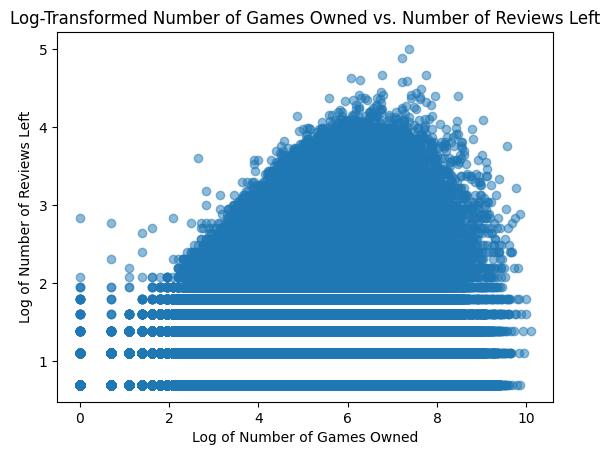

In [17]:
import numpy as np
# Apply log transformation (add 1 to avoid log(0))
log_games_owned = np.log1p(unique_author_data['author.num_games_owned'])
log_num_reviews = np.log1p(unique_author_data['author.num_reviews'])
# Plot log-transformed data
plt.scatter(log_games_owned, log_num_reviews, alpha=0.5)
plt.xlabel('Log of Number of Games Owned')
plt.ylabel('Log of Number of Reviews Left')
plt.title('Log-Transformed Number of Games Owned vs. Number of Reviews Left')
plt.show()

In the log-transformed plot we can see even more clearly that the relationship between the two attributes is non-linear. There is an increase in the log of the number of reviews as the log of the number of games owned increases initially, but after a certain point (around a log value of 6 for games owned), the log of the number of reviews starts to slowly decrease. This suggests that users with a moderate number of games tend to leave the most reviews, while those with very few or very many games leave fewer reviews. From the horizontal lines at the bottom we deduce that a large number of users leaves very few reviews, regardless of how many games they own. Users in the middle range of games owned (log values around 4–7) are likely to be more active reviewers, as shown by the peak in the log of the number of reviews. This could indicate that users with a moderately large game library are the most engaged in terms of reviewing habits.

We can try printing Pearson's correlation coefficient and Spearman's rank coefficient for these two attributes:

In [18]:
# Pearson's Correlation Coefficient
correlation = unique_author_data[['author.num_games_owned', 'author.num_reviews']].corr().iloc[0, 1] # get the correlation between the two features
print("Pearson's correlation coefficient:")
print(correlation)
# Spearman's Rank Correlation
spearman_corr, spearman_p = spearmanr(unique_author_data['author.num_games_owned'], unique_author_data['author.num_reviews']) # calculate spearman's rank correlation
print("Spearman's rank correlation:", spearman_corr)
print("p-value:", spearman_p)

Pearson's correlation coefficient:
0.22064601244763155
Spearman's rank correlation: 0.3561073962215215
p-value: 0.0


Pearson's coefficient is approximately 0.221, which suggests a weak positive linear correlation. The Spearman's rank correlation is slightly higher with a value of about 0.356, indicating a moderately positive monotonic relationship between the two variables. Therefore, even though there is no strong linear correlation, there is still a moderate increasing trend. The fact that the p-value is 0.0 tells us we can confidently interpret this relationship as real and not random.

In [19]:
# Apply the segmentation function to create a new column
unique_author_data['ownership_segment'] = unique_author_data['author.num_games_owned'].apply(segment_games_owned)
# Group by the ownership segment and calculate statistics
segment_stats = unique_author_data.groupby('ownership_segment').agg(
    count=('author.steamid', 'count'),  # count of users in each segment
    mean_games_owned=('author.num_games_owned', 'mean'),  # mean number of games owned
    mean_reviews=('author.num_reviews', 'mean')  # mean number of reviews written
).reset_index()
# Display the statistics
segment_stats

,ownership_segment,count,mean_games_owned,mean_reviews
0,High Ownership,1220578,361.842810,2.856722
1,Low Ownership,7186286,18.841818,1.347130
2,Medium Ownership,3933603,101.447949,2.079350
3,Very High Ownership,66088,1772.916324,4.015404


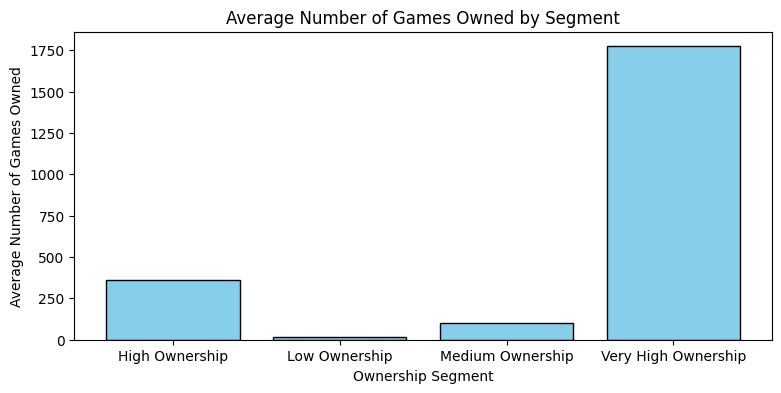

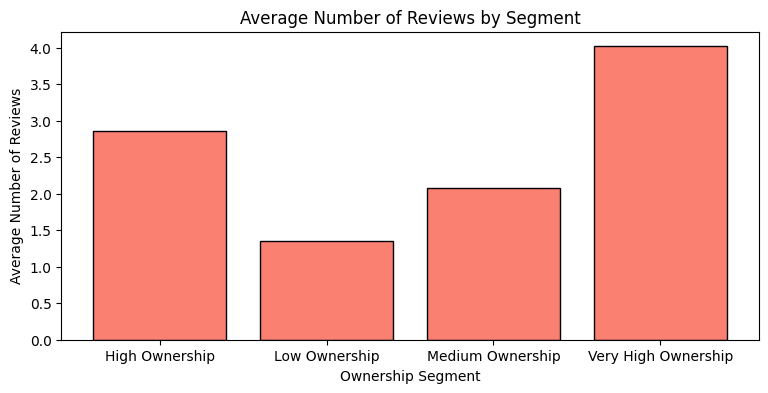

In [20]:
# Plotting the average number of games owned by segment
plt.figure(figsize=(9, 4))
plt.bar(segment_stats['ownership_segment'], segment_stats['mean_games_owned'], color='skyblue', edgecolor='black')
plt.xlabel('Ownership Segment')
plt.ylabel('Average Number of Games Owned')
plt.title('Average Number of Games Owned by Segment')
plt.show()
# Plotting the average number of reviews by segment
plt.figure(figsize=(9, 4))
plt.bar(segment_stats['ownership_segment'], segment_stats['mean_reviews'], color='salmon', edgecolor='black')
plt.xlabel('Ownership Segment')
plt.ylabel('Average Number of Reviews')
plt.title('Average Number of Reviews by Segment')
plt.show()

**Comments**: "High Ownership" and "Very High Ownership" segments show much higher mean values for both games owned and reviews written. This indicates that players who own more games tend to be more engaged in the community, likely providing more feedback through reviews. On the other hand, the "Low Ownership" segment, even though it is the largest group, has a very low mean for both metrics. This suggests that users who own fewer games do not engage with the platform as much, perhaps due to less experience or investment in gaming. The data and visualizations indicate that higher game ownership is in correlation with higher engagement.

**Conclusions**

Returning to our original hypothesis, "reviewers who own a larger number of games are likely to leave fewer reviews on the platform," we can confidently say that it is incorrect. The analysis conducted on the data reveals a consistent monotonic correlation between the number of games owned and the number of reviews left by users. The performed statistics show that as users' game ownership increases, their tendency to leave reviews also rises. This suggests that users who engage more deeply with the platform by owning more games are also more likely to express their opinions and feedback through reviews. This contradicts our initial assumption and highlights the importance of user engagement as a factor in review activity.

From a marketing point of view, strategies that aim to increase the number of games owned by users could also enhance user activity and review contributions. For example, introductory offers, free trials or curated content recommendations could motivate Low Ownership users to explore more games, therefore increasing their ownership and, subsequently, their likelihood to contribute reviews.

In conclusion, the statistics strongly support the notion that increased game ownership correlates positively with review activity on the platform. By making the most of these insights, Steam and game developers can design more effective engagement strategies to improve user experience and satisfaction, ultimately benefiting both the community and the marketplace.

### 5. Ask an LLM tool (such as ChatGPT, Claude AI, Gemini, Perplexity, etc.) to understand the purposes of histograms, bar plots, scatterplots, and pie charts and what kind of insights they offer that might be useful for statistical analysis. Are those results trustworthy, or can you do something to improve somehow the confidence in the suggestions given by the LLM?

These are the results of the inquiry, provided by ChatGPT:

1. **Histograms**

Histograms display the distribution of a single continuous variable by dividing data into intervals (or bins) and showing the count or frequency of data points within each interval. They can reveal if data is normally distributed, skewed, or has multiple modes, as well as show the variability and range of values. Outliers become evident as bars that are distant from the bulk of the data.
The central tendency helps estimate where most data points lie (mean, median). Histograms are useful for understanding the general distribution of variables.

2. **Bar Plots**

Bar plots are typically used to represent categorical data or discrete variables by showing the frequency or count of each category. They are useful for showing patterns and trends in data, comparing counts of categories and working with aggregated values.

3. **Scatter Plots**

Scatter plots visualize the relationship between two continuous variables by plotting individual data points on a 2D graph. They help identify correlations or relationships between variables (positive, negative, or none), and finding trends, clusters, or patterns in the data. Points that do not fit the general pattern (outliers) are easy to spot. Scatterplots are essential in regression analysis, as they allow a preliminary visual assessment of linearity, which is a core assumption for many statistical models. They are also helpful in identifying potential multivariate relationships and interactions.

4. **Pie Charts**

Pie charts show the proportion of categories within a whole, representing each category as a slice of a pie. They make it possible to easily see the percentage contribution of each category to the total, visually identifying which categories contribute the most or the least. They are useful for showing distributions of categorical data but work best for small numbers of categories, as they become less effective and harder to read with many slices. Although limited for detailed analysis, pie charts are helpful for a quick overview of the relative importance of categories. They're often used in presentations to convey simple proportional relationships.

Each type of plot provides unique insights that can enhance statistical analysis by visually summarizing data, revealing patterns, and aiding in interpreting data relationships and distributions.

**Conclusions**

The results given by LLMs can usually provide valuable insights, but are not always 100% accurate. The information given by ChatGPT about different types of plots seems rather trutworthy, but there are a few ways to improve the confidence in these results. For example, comparing information from the LLM with academic literature, textbooks or statistical resources, or interrogating multiple LLMs to identify inconsistencies or biases among different models. Another useful way to increase confidence, is to seek empirical validation through personal statistical analysis. Interacting with statistics communities or forums can also increase the confidence level in these results.

# Bonus
Beyond just looking at the numerical ratings, the words users write in their reviews give us valuable insights into how they feel about the application. Let's analyze these review texts using sentiment analysis.

After analyzing the entire dataframe, we discovered that it contains an extensive population of 200 million reviews which presents significant computational challenges when adopting the sentiment analysis.
To facilitate a more manageable yet effective sentiment analysis that yields valuable insights, we opted to draw a sample from this population.
To determine an appropriate sample size, we utilized the formula for estimating sample size:
[ n = \left( \frac{Z \sigma}{E} \right)^2 ]

Consequently, we selected a random sample of 5,000 reviews. This approach ensures that each review has an equal opportunity to be included in the sample, thereby maximizing the representativeness and reliability of our analysis.

In [ ]:
sample_size = 5000

sample_df = df.sample(n= sample_size, random_state = 42)
sample_df['language'].value_counts()
# we can see that it represents the actual dataframe, even in here we see that the top 3 languages are english, chinese and russian.

In [ ]:
# english reviews
english_df = sample_df[sample_df['language']== 'english']
# Defining the sentiment scoring function with a treashold of 0.05. In order to have a distinction between negative positive and neutral reviews
def sentiment_score(sentiment):
    value = 0
    if sentiment > 0.05:
        value = 4  # positive comment
    elif sentiment <= -0.05:
        value = 0  # negative comment
    else:
        value = 2  # neutral comment
    return value

def translatee(txt):
    if txt is None or txt.strip() == '':
        return ''  # Return an empty string for None or empty inputs
    try:
        translation = translator.translate(txt, dest="en")
        return translation.text  # Return only the translated text
    except Exception as e:
        return str(txt)  # Ensure that original text is returned as a string

import nltk
from nltk.sentiment.vader import SentimentIntensityAnalyzer

# Initializing the VADER sentiment analyzer
sia = SentimentIntensityAnalyzer()

english_df['review'] = english_df['review'].fillna('').astype(str) # transforming the empty reviews type into string type

# Applying the VADER to calculate sentiment scores
english_df['score'] = english_df['review'].apply(lambda review: sia.polarity_scores(review)['compound'])
print(english_df[['review', 'score']])

# Applying the sentiment_score to determine whether the comments are negative positive or neutral based on the sentiment score obtained
# from the vader analysis

english_df['sentiment_score'] = english_df['score'].apply(sentiment_score)

print(english_df[['review','sentiment_score','score']])

# importing the needed packages
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# making the distinction between the positive and negative values
positive_comment = english_df[english_df['sentiment_score'] == 4]['review']
negative_comment = english_df[english_df['sentiment_score'] == 2]['review']

# Sampling positive and negative reviews to create wordclouds
sample_positive = " ".join(comment for comment in positive_comment.sample(frac=0.1, random_state=23))
sample_negative = " ".join(comment for comment in negative_comment.sample(frac=0.1, random_state=23))

# Generating word cloud images
wordcloud_positive = WordCloud(width=800, height=400, max_words=200, background_color="white").generate(sample_positive)
wordcloud_negative = WordCloud(width=800, height=400, max_words=200, background_color="white").generate(sample_negative)

plt.figure(figsize=(15, 7.5))
# Positive word cloud
plt.subplot(1, 2, 1)
plt.imshow(wordcloud_positive, interpolation='bilinear')
plt.title('Positive Comment Word Cloud')
plt.axis("off")

# Negative word cloud
plt.subplot(1, 2, 2)
plt.imshow(wordcloud_negative, interpolation='bilinear')
plt.title('Negative Comment Word Cloud')
plt.axis('off')

In [ ]:
# Displaying a bar plot of positive, negative and neutral reviews
import seaborn as sns

sns.countplot(data=english_df, x='sentiment_score', palette='coolwarm')
plt.title("Distribution of Sentiment Categories")
plt.xlabel("Sentiment Category")
plt.ylabel("Number of Reviews")
plt.show()

# plotting the sentiment score as a pie chart

pos = (english_df['sentiment_score'] == 4).sum()
neg = (english_df['sentiment_score'] == 0).sum()
neu = (english_df['sentiment_score'] == 2).sum()

plt.pie([pos, neg, neu], labels=['Positive', 'Negative', 'Neutral'], autopct='%1.1f%%')
plt.title('Sentiment Analysis')
plt.show()

There are way more positive comments than the negative ones.


#### Does the sentiment analysis align with whether the application is recommended or not? Explain any insights from this comparison.

In [ ]:
recommend = english_df['recommended'].value_counts()


plt.figure(figsize=(8, 5))
sns.barplot(x=recommend.index.astype(str), y=recommend.values, palette='pastel')
plt.title('Count of Recommendations')
plt.xlabel('Recommended')
plt.ylabel('Count')
plt.xticks(rotation=0)
plt.show()

Based on the sentiment analysis conducted on the user comments related to the application, it was observed that a majority of the feedback was positive. Simultaneously, the recommendation data indicated that a significant majority of users recommended the application. Specifically, for the english language, the analysis revealed that 1954 users recommended the application (True), while 248 users did not recommend it (False).
These discoveries suggest a strong alignment between the sentiment expressed in comments and the users' likelihood to recommend the application. Since the majority of comments were positive, it is reasonable to conclude that users who expressed positive sentiments were more inclined to recommend the application.

These results imply that enhancing the factors leading to positive sentiment can further boost the recommendation rate.
Conversely, the 248 users who did not recommend the application might provide constructive criticism which may be interpret as positive or neutral reviews. Alternatevely they can be thought as negative comments.

In [ ]:
# correlation analysis for the english comments between recomendations and sentiment scores
from scipy.stats import pearsonr
english_df['recommended_binary'] = english_df['recommended'].apply(lambda x: 1 if x else 0)
recommendations = english_df['recommended_binary']
sc = english_df['score']

# computing the Pearson correlation
corr, p_value = pearsonr(recommendations, sc)

# Output
print(f'Correlation: {corr}, P-value: {p_value}')

With a value of 0.364, there's a moderate positive correlation between the binary recommendation status (recommended vs. not recommended) and the sentiment score. Suggesting that as the sentiment score increases, the likelihood of a recommendation also increases, but the relationship is not very strong.
The p-value reported is extremely small, way smaller than 0.05, indicating that there's an evidence againt the null hypothesis, which, is that there is no correlation.
Thus we can say that the correlation is statistically significant, suggesting that the relationship observed is unlikely to occur by random chance.

In [ ]:
# chinese review

chinese_df = sample_df[sample_df['language'] == 'schinese']
# for the chinese language we used another model, which does not need for a translation

from transformers import pipeline

chinese_df['review'] = chinese_df['review'].fillna('').astype(str)
# Load a multilingual or Chinese-specific sentiment analysis model
sentiment_pipeline = pipeline("sentiment-analysis", model="nlptown/bert-base-multilingual-uncased-sentiment")

# Define the maximum character length for truncation (approx. 512 tokens)
max_length = 512

# Truncate text to 512 characters, then run sentiment analysis
chinese_df['truncated_review'] = chinese_df['review'].apply(lambda x: x[:max_length] if isinstance(x, str) else "")
chinese_df['sentiment_result'] = chinese_df['truncated_review'].apply(lambda review: sentiment_pipeline(review)[0])

# Extract score and label
chinese_df['score'] = chinese_df['sentiment_result'].apply(lambda result: result['score'])
#chinese_df['label'] = chinese_df['sentiment_result'].apply(lambda result: result['label'])

# Drop the temporary 'truncated_review' and 'sentiment_result' columns if no longer needed
chinese_df.drop(columns=['truncated_review', 'sentiment_result'], inplace=True)

# Applying the function to determine the score value
chinese_df.loc['sentiment_score'] = chinese_df['score'].apply(sentiment_score)
chinese_df

In [ ]:
# Displaying a bar plot of positive, negative and neutral reviews
import seaborn as sns

sns.countplot(data=chinese_df, x='sentiment_score', palette='coolwarm')
plt.title("Distribution of Sentiment Categories")
plt.xlabel("Sentiment Category")
plt.ylabel("Number of Reviews")
plt.show()

# plotting the sentiment score as a pie chart

pos = (chinese_df['sentiment_score'] == 4).sum()
neg = (chinese_df['sentiment_score'] == 0).sum()
neu = (chinese_df['sentiment_score'] == 2).sum()

plt.pie([pos, neg, neu], labels=['Positive', 'Negative', 'Neutral'], autopct='%1.1f%%')
plt.title('Sentiment Analysis')
plt.show()

most probably there's an error in the detection since the 99.9% of the reviews look to be completely positive.
By analyzing also the recommendations we see that the majority of the users, 648, recomend the applications while the rest, 211, don't.
We can suppose that the 648 users thaat recomend the application actually left a positive review but the other 211 would have give a negative review.

In [ ]:
recommend = chinese_df['recommended'].value_counts()
print(recommend)

plt.figure(figsize=(8, 5))
sns.barplot(x=recommend.index.astype(str), y=recommend.values, palette='pastel')
plt.title('Count of Recommendations')
plt.xlabel('Recommended')
plt.ylabel('Count')
plt.xticks(rotation=0)
plt.show()


We tried to translate the reviews but they still present some inconsistencis. By applying different translation methods (deeptranslation, googletrans) but the reviews dont seem to be translated correctly.
Thus we decided to focus our attention only the english comments


# Algorithmic Question (AQ)

You are given two positive integers, $n$ (where $1\le n \le 10^9$) and k (where $q \le k \le 100$). Your task is to express $n$ as the sum of $k$ positive integers, all having the same parity (i.e., all have the same remainder when divided by 2, meaning they are either all even or all odd).
In other words, find $a_1, a_2, ..., a_k$ each $a_i \gt 0, n = a_1 + a_2 + ... + a_k$, and all $a_i$ simultaneously are either even or odd.
If it's impossible to represent $n$ in this way, report that no such representation exists.

**Input**

In the first input line, you will receive a number t (where $1 \le t \le 100$), representing the number of test cases. The following $t$ lines will contain two values, $n$ and $k$, corresponding to each test case.

**Output**

For each test case, if it is possible to represent $n$ as the sum of $k$ positive integers, all of the same parity (either all even or all odd), print "YES" and provide the corresponding values of $a_i$ in the next line. If there are multiple valid solutions, you can print any of them. If such a representation is not possible for a given test case, print "NO".

### Examples
---

**Input**
```
8
10 3
100 4
8 7
97 2
8 8
3 10
5 3
```
**Output**
```
YES
4 2 4
YES
55 5 5 35
NO
NO
YES
1 1 1 1 1 1 1 1
NO
YES
3 1 1
```

## Implement a Python program to solve the problem above.

In [ ]:
def sumSameParity(n, k):

  """
    Determines if it is possible to express the integer 'n' as the sum of 'k' positive integers,
    all having the same parity (either all odd or all even). If possible, it returns "YES" followed
    by the integers, otherwise returns "NO".

    Parameters:
    n (int): The integer to be expressed as the sum of 'k' integers. It must be a positive integer (1 <= n <= 10^9).
    k (int): The number of terms in the sum. All terms must share the same parity (1 <= k <= 100).

    Returns:
    str: A string "YES" followed by the integers that sum to 'n', if such a representation is possible.
         Otherwise, it returns "NO" if it is not possible to represent 'n' as the sum of 'k' integers
         with the same parity.
  """

  """
    The first check evaluates three conditions where it is impossible to represent 'n' as the sum of 'k' addends with the same parity:
    1. If 'k' is greater than 'n', then it's impossible to represent 'n' as a sum of 'k' positive integers because the minimum sum of 'k' positive integers is at least 'k'.
    2. If 'n' is odd and 'k' is even, it's impossible to represent 'n' as the sum of 'k' numbers with the same parity because the sum of an even number of odd integers is always
       even, and 'n' is odd.
    3. If 'n' is even and 'k' is odd, and 'k' is greater than 'n/2', it's impossible to represent 'n' as a sum of 'k' even integers. The minimum sum of 'k' even integers is '2*k',
       which would exceed 'n' if 'k > n/2'. Also, 'n' cannot be the sum of 'k' odd integers because the sum of an odd number of odd integers is always odd, but 'n' is even.
  """
  if (k > n or (n % 2 != 0 and k % 2 == 0) or (n % 2 == 0 and k % 2 != 0 and k > n / 2)):
    return("NO")

  # This list will store the 'k' addends that sum up to 'n' with the same parity.
  addends = []

  # If 'k' equals 'n', the only possible way to represent 'n' as a sum of 'k' numbers is by using 'k' ones (i.e., 'n' 1's), since the sum of 'k' ones equals 'n'.
  if (k == n):
    addends = [1] * k
    """
    The following condition handles two cases where 'n' can be represented as a sum of 'k' odd integers:
    Case 1: If 'n' is odd and 'k' is odd, and 'k < n' (which is ensured by the initial check), it's always possible to represent 'n' as a sum of 'k' odd integers.
    Case 2: If 'n' is even, 'k' is even, and 'k > n / 2', it's possible to represent 'n' as the sum of 'k' odd integers. This is because the sum of an even number of odd integers is
            even, and since 'k' exceeds 'n / 2', the minimum sum of 'k' even integers would exceed 'n'. Hence, we need to use odd integers instead.
    In both cases, the strategy is to use (k-1) ones, which are odd, and set the final addend as 'n - (k-1)' to ensure that the total sum equals 'n'.
    The number 'n - (k-1)' will always be odd because subtracting an odd number (i.e., (k-1)) from a number 'n', either odd or even, results in an odd number.
    """
  elif((n % 2 != 0 and k % 2 != 0) or (n % 2 == 0 and k % 2 == 0 and k > n / 2)):
    addends = [1] * (k - 1)
    addends.append(n - (k - 1))
    """
    Finally, this condition handles the case where 'n' is even and 'k' is less than or equal to 'n / 2'.
    Regardless of whether 'k' is even or odd, 'n' can always be written as the sum of 'k' even numbers. This is because the sum of any number of even integers is always even.
    The strategy here is to use (k-1) numbers equal to 2, and set the final addend as 'n - 2 * (k-1)' to ensure the total sum equals 'n'.
    The value 'n - 2 * (k-1)' will always be even, so the sum of the numbers will maintain the correct parity.
    """
  else:
    addends = [2] * (k - 1)
    addends.append(n - 2 * (k - 1))

  # Return "YES" to indicate that the solution exists, followed by the addends that sum up to 'n'.
  return("YES\n" + " ".join(map(str, addends)))

In [ ]:

### Read the number of test cases.
t = int(input())

# Initialize an empty list that will store 't' sublists.
# Each sublist contains two integers 'n' and 'k', which represent the values for each test case.
# Using list comprehension, we read the input for 't' test cases. For each test case:
# - 'input().split()' reads a single line of input, splits it into two parts (n and k),
# - 'map(int, ...)' converts the split input strings into integers,
# - 'list()' collects the two integers (n, k) into a sublist.
# This creates a list of 't' sublists where each sublist corresponds to a test case.
nk_list = [list(map(int, input().split())) for _ in range(t)]

# Iterate over each sublist 'nk' in the 'nk_list'.
# Each 'nk' is a two-element list where:
# - 'nk[0]' represents 'n' (the target number),
# - 'nk[1]' represents 'k' (the number of addends with the same parity).
# For each test case, we call the function 'sumSameParity' with 'n' and 'k' as arguments,
# and print the result of the function call, which outputs either "NO" or "YES" followed by the valid addends.
for nk in nk_list:
  print(sumSameParity(nk[0], nk[1]))


## Please provide an analysis of your code's time complexity using Big O notation

### Initial Condition Check
The first condition involves three main logical checks:
1. `k > n`;
2. Parity mismatch between $n$ and $k$;
3. Another parity mismatch when $n$ is even and $k$ is odd and greater than $n/2$.

Each check consists of basic comparison operators such as `>`, `!=`, `==`, and logical operators like `and`, `or`. Each of these operations takes constant time.\
In particular, the total number of comparisons and logical operations is **constant**: 6 value comparisons and 5 logical comparisons, leading to \( O(1) \). If this condition is satisfied, the algorithm immediately returns `"NO"`, and no further execution occurs, making the time complexity **$O(1)$** in this case (**best case**).

### First `if` Block
If the first condition is not satisfied, the algorithm moves into the second block of conditions. The first `if` block checks whether `k == n`, which takes **$O(1)$** time.

If `k == n`, the algorithm populates a list `addends` with $k$ elements, all equal to $1$. This operation involves creating a list with $k$ elements, with each insertion taking **$O(1)$** time. The length of the list $k$ directly impacts the time taken to create it.

- **List creation** takes $O(k)$ time as $k$ elements are added.
- **Final output formatting** is obtained by concatenating the list into a string, which takes $O(k)$ time.

Thus, the time complexity for this branch is:\
$O(1)$ (first condition check) + $O(1)$ (first `if` block check) + $O(k)$ (list creation) + $O(k)$ (output formatting) = $O(k)$

### Second `elif` Block
If the condition `k == n` is not satisfied, the algorithm proceeds to check another condition involving parity. This condition involves a few additional comparisons (5 value comparisons and 4 logical operators), all of which take **constant time** $O(1)$.

If this condition holds, the algorithm constructs the list `addends` by adding $k - 1$ ones and appends the element calculated as $n - (k - 1)$ at the end.
- **Appending** elements to a list generally has *amortized time complexity* of $O(1)$ due to Python's internal memory allocation strategy. This occurs because Python preallocates a larger storage space than what is actually needed when a list is created. Hence, the resizing of the list happens with a very low frequency. The resizing causes the allocation of a larger space for the list, copying all the elements and adding the last element, which takes $O(l)$, where $l$ is the length of the list. Since this operation is executed with a very low frequency, using amortized analysis, even if we occasionally perform expensive operations, we can get a lower bound on the 'average' cost of operations when considering them as a sequence rather than individually.
Since Python resizes the list exponentially, the overall cost of `append()` operations is distributed over many operations. Thus, even though resizing has a linear cost, the amortized complexity of the `append()` operation remains $O(1)$. In general, in our case $0 \leq k \leq 100$, so we don't have space resizing issues.
Therefore, adding $k-1$ ones takes **$O(k)$** time, and appending the last element takes **$O(1)$**.
- **Output formatting** again takes **$O(k)$** time.

Thus, the total complexity for this branch is:\
**$O(1)$** (first condition check) + **$O(1)$** + (first `if` block check) + **$O(1)$** (second `elif` block check) + **$O(k)$** (list creation) + **$O(1)$** (append last element) + **$O(k)$** (output formatting) = **$O(k)$**

### Final `else` Block
If none of the previous conditions are satisfied, the final `else` block is executed. Here, the algorithm adds $k-1$ twos to the list and appends another calculated value $n-2\cdot(k - 1)$. The analysis for this block is similar to the `elif` block:
- **Creating** the list with $k-1$ elements takes **$O(k)$** time.
- **Appending** the final calculated value takes **$O(1)$** time.
- **Output formatting** takes **$O(k)$** time.

Thus, the total complexity for this branch is also:\
**$O(1)$** (first condition check) + **$O(1)$** + (first `if` block check) + **$O(1)$** (second `elif` block check) + **$O(1)$** (final `else` block check) + **$O(k)$** (list creation) + **$O(1)$** (append last element) + **$O(k)$** (output formatting) = **$O(k)$**

### Worst Case Complexity
In the worst case, the algorithm proceeds past the initial condition check and enters one of the `if-elif-else` blocks. Each of these blocks has a time complexity of **$O(k)$** due to list creation and output formatting.

However, since $k$ is bounded by $100$ (i.e., $k \leq 100 $), we conduct two distinct analyses:
- With respect to $k$, the algorithm takes linear time **$O(k)$**.
- With respect to $n$, since $k $ has a fixed upper limit of $100$ and does not depend on $n$, operations such as creating the list `addends`, appending elements, and formatting the output are performed at most $O(100)$ times, regardless of the value of $n$, where $1 \leq n \leq 10^9$. Therefore, as $k$ is a *constant* with respect to $n$, the overall complexity remains *constant with respect to $n$*.

### Final Complexity
- **Best Case**: it occurs when the initial condition is satisfied and the algorithm returns `"NO"`, with a time complexity of $O(1)$;
- **Worst Case**: it occurs when list creation and output formatting take place, with a time complexity of $O(k)$.

Thus, given that $k$ is bounded independently of $n$, we can conclude that the algorithm exhibits *constant complexity with respect to $n$*. However, the complexity of the algorithm is *linear* in $k$, resulting in $O(k)$.

## Ask an LLM tool (such as ChatGPT, Claude AI, Gemini, Perplexity, etc.) to evaluate the time complexity of your code using Big O notation. Is the assessment accurate? If it differs from your previous analysis, which would be correct? Please explain your reasoning.

We asked ChatGPT to analyze the time complexity of our code, and, as we anticipated, it provided a breakdown of the various components of the algorithm that aligned closely with my own analysis. Below are the key points highlighted by ChatGPT:

1. **Initial Condition Check**:
   - ChatGPT recognized that the initial condition check consists of a few constant-time comparisons. This leads to a best-case complexity of $O(1)$ when the condition is satisfied immediately.

2. **Control Flow Analysis**:
   - In the scenario where `k==n`, it identified a linear time complexity with respect to $k$ for creating a list of size $k$ and for the subsequent formatting, resulting in a complexity of $O(k)$.
   - For the other two blocks (the `elif` and `else` conditions), ChatGPT noted that both involve creating a list with $k - 1$ elements, performing an append operation, and handling output formatting. This also leads to a complexity of $O(k)$.

3. **Overall Complexity**:
   - ChatGPT concluded that the worst-case complexity is $O(k)$. It emphasized that while $k$ can vary, it remains bounded (i.e., $k \leq 100$), which is favorable since 100 is a relatively small number for computational analysis.

The assessment from the LLM aligns with my analysis and validates the conclusions drawn about the time complexity of the algorithm. Both analyses indicate:
- **Best Case**: $O(1)$ when the initial condition is satisfied.
- **Worst Case**: $O(k)$ when list creation and formatting are executed.

However, we found that the LLM's assessment lacked some depth compared to our own analysis. Notably, it did not account for the amortized costs associated with appending elements to the list. This could benefit from further discussion to clarify the underlying complexities. Additionally, the LLM did not mention the distinction between linear time complexity for $k$ and constant time complexity for $n$.

Given the constraints on $k$, which does not depend on $n$, we emphasized that while the algorithm may take $O(k)$ in certain cases, indicating linear complexity with respect to $k$, it remains constant with respect to $n$. This crucial detail highlights that, even when the algorithm operates in $O(k)$, its performance is effectively constant regarding $n$, making it efficient in practical scenarios.

In summary, even though both analyses yield the same overall results, our examination provides a more nuanced understanding of the complexities involved. This deeper analysis ensures that all relevant factors, such as amortized costs and the relationship between $k$ and $n$, are thoroughly considered.